In [45]:
# Final set of unified functions for all ipynbs:
## - Pull in the model function
import sys
import os
from class_based_implementation.train_model import objective, MODEL_CLASSES, LOSS_FUNCTIONS # Import mappings too

# Move these somewhere else eventually
def load_model(model_name, model_path):
    model_class = MODEL_CLASSES[model_name]
    model = model_class.load_from_checkpoint(model_path, strict=False)
    return model

def return_weights(model):
    weights = {}
    weights["w1_param"] = model.w1.data
    weights["w2_param"] = model.w2.data
    weights["v1_param"] = model.v1.data
    if model.gamma is not None:
        weights["gamma_param"] = model.gamma.data
    else:
        weights["gamma_param"] = None
    return weights

Seed: 1


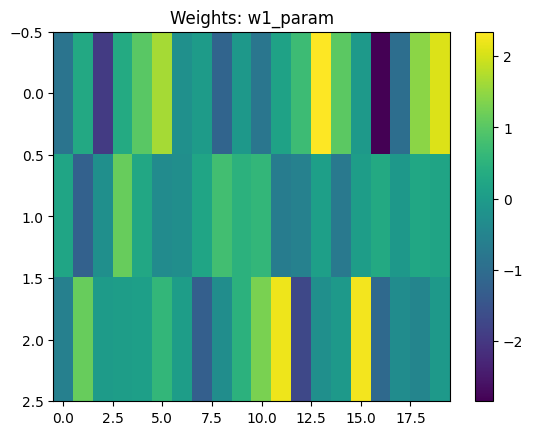

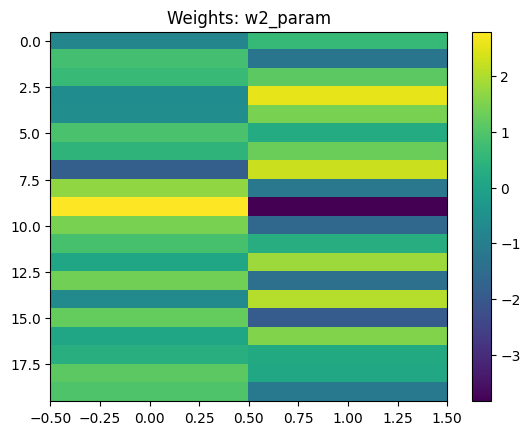

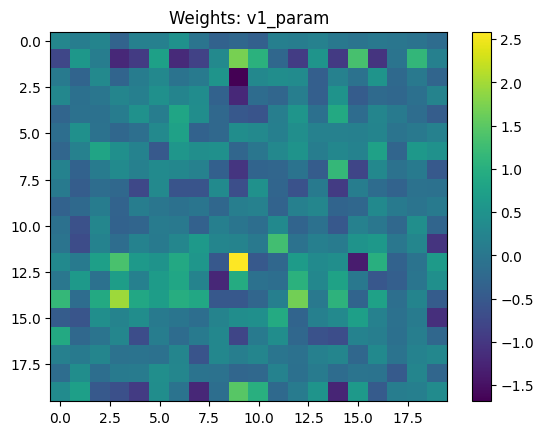

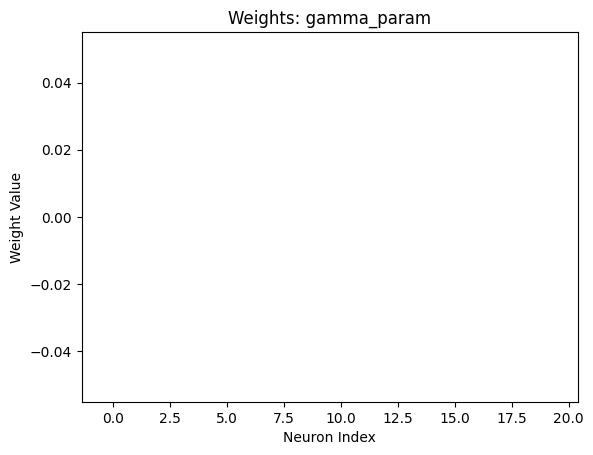

Seed: 2


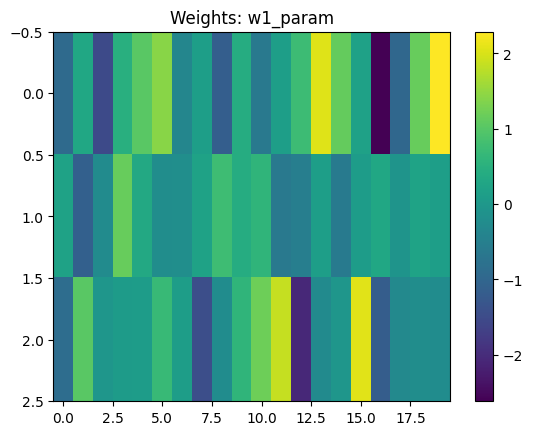

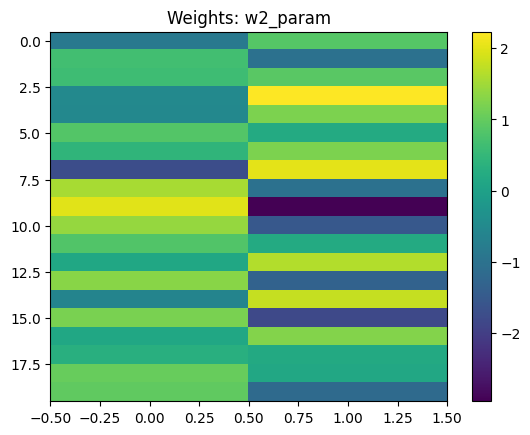

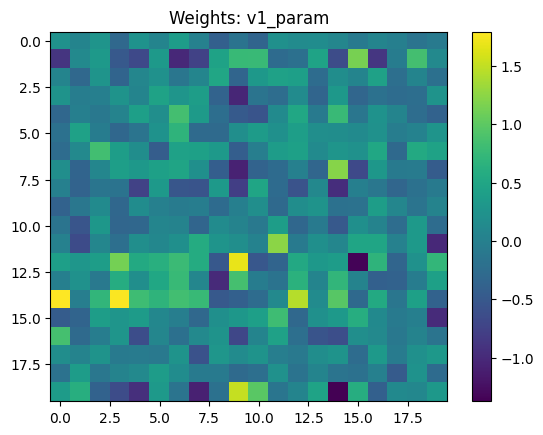

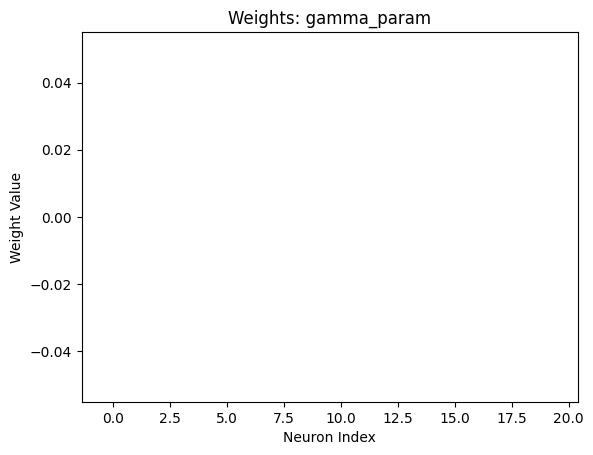

Seed: 3


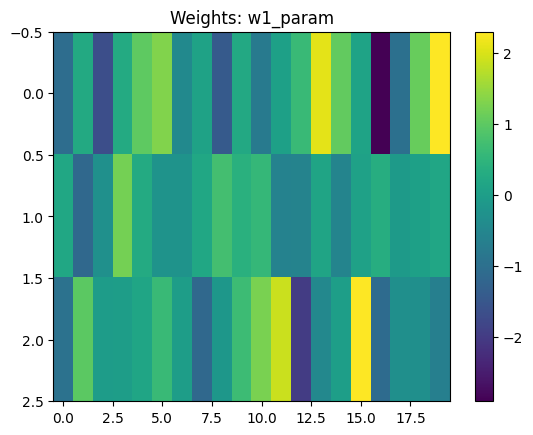

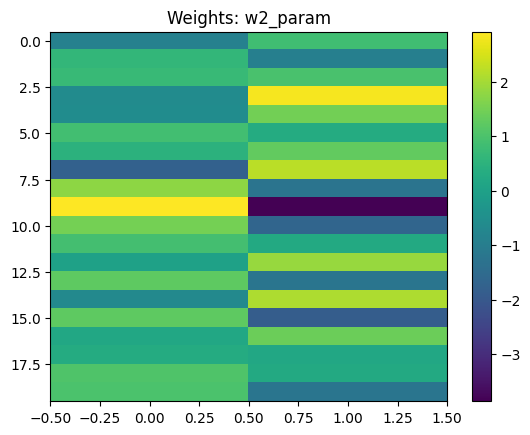

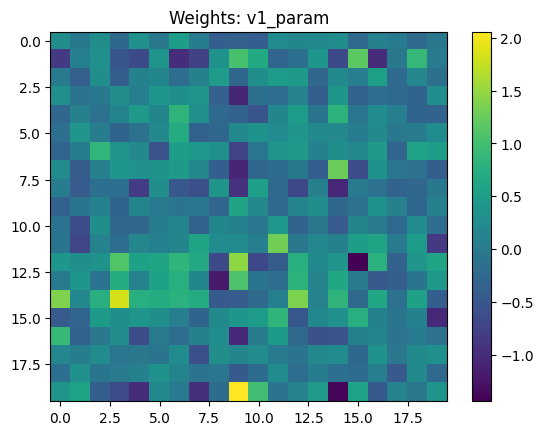

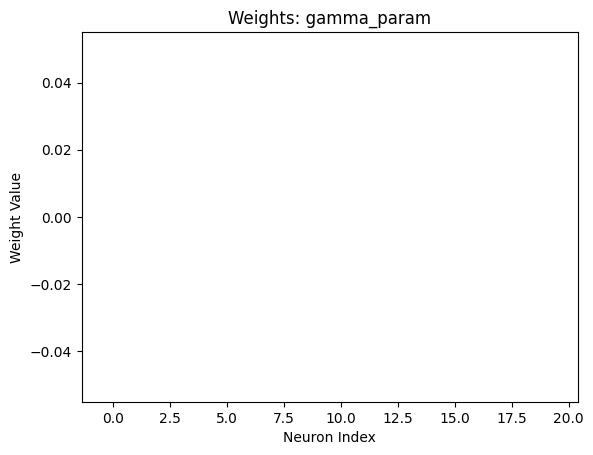

Seed: 4


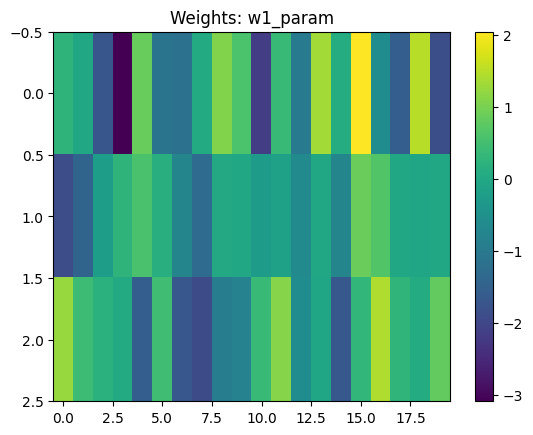

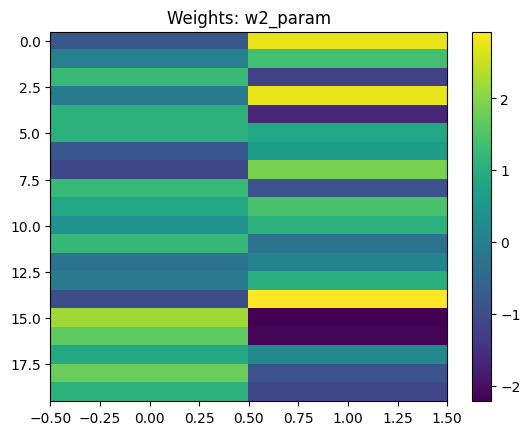

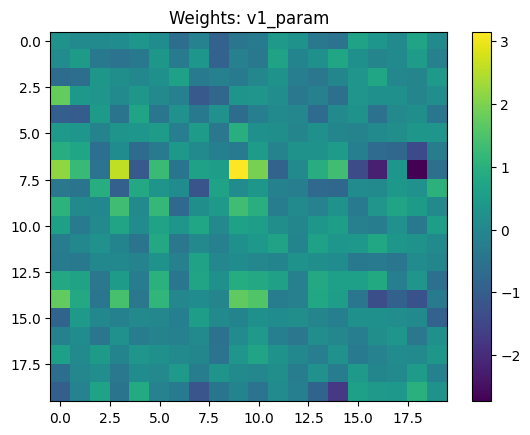

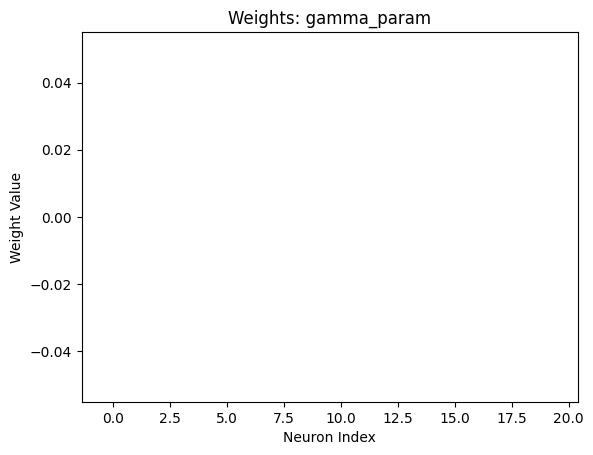

Seed: 5


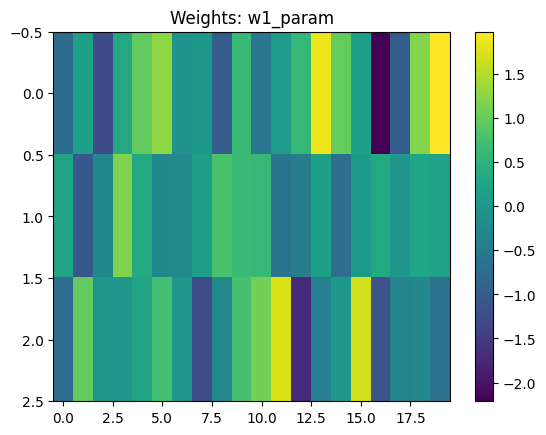

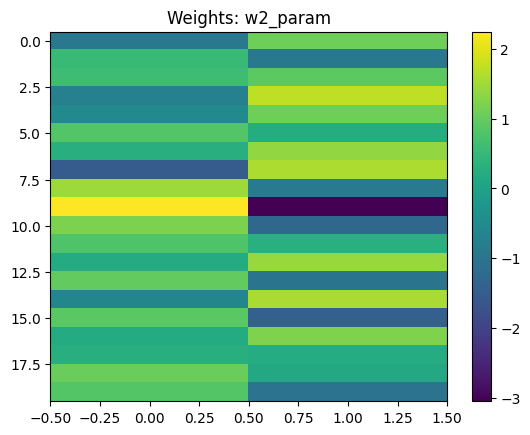

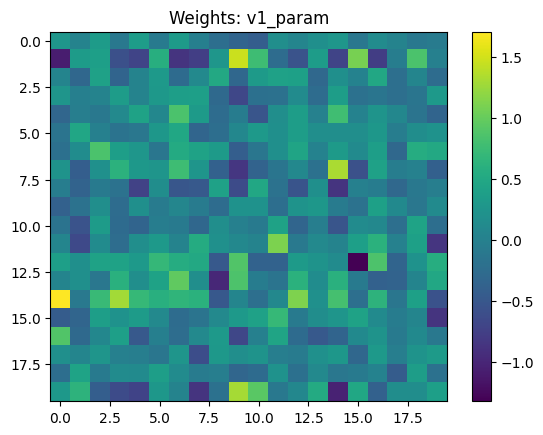

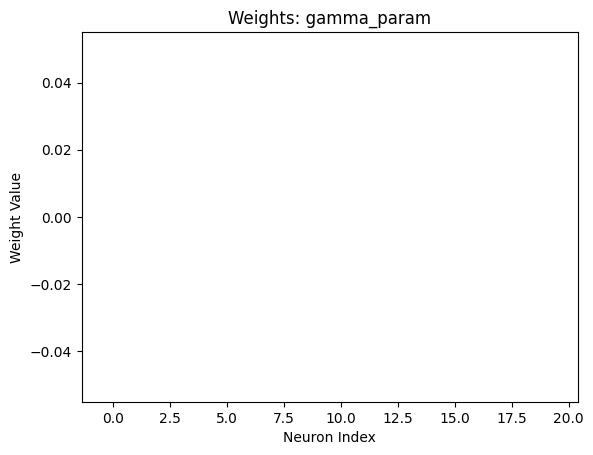

In [48]:
data = "randman"
gamma_fixed = True
gamma_init_type = "const_zero"
reset_nsn = True
# Visualize all the weights
import matplotlib.pyplot as plt
def visualize_weights(weights):
    for key, value in weights.items():
        if value is not None:
            # If 2-D, plot as heatmap
            if len(value.shape) == 2:
                plt.figure()
                plt.title(f"Weights: {key}")
                plt.imshow(value.cpu().numpy(), aspect='auto', cmap='viridis')
                plt.colorbar()
                plt.show()
            elif len(value.shape) == 1:
                plt.figure()
                plt.title(f"Weights: {key}")
                plt.bar(range(len(value.cpu().numpy())), value.cpu().numpy())
                plt.xlabel("Neuron Index")
                plt.ylabel("Weight Value")
                plt.show()
        # If 1-D, plot as line

sampler_type = "tpe"

# Do this for all of the flexible spiking models (print seed and then show)
for seed in range(1,6):
    print(f"Seed: {seed}")
    if data == "randman":
        if reset_nsn == False:
            path = f"/vast/nar8991/snn/training_results/randman/1_d/2_classes/3/cross_entropy/Hybrid_NSN_SNN_V1_Flexible_Spiking/recurrent_True/seed_{seed}/tpe_sampler/20_hidden/1.0_pct_data/None_percent_snn/{gamma_init_type}_gamma_init/gamma_fixed_{gamma_fixed}/reset_nsn_False/best_model_of_study.ckpt"
        else:
            path = f"/vast/nar8991/snn/training_results/randman/1_d/2_classes/3/cross_entropy/Hybrid_NSN_SNN_V1_Flexible_Spiking/recurrent_True/seed_{seed}/tpe_sampler/20_hidden/1.0_pct_data/None_percent_snn/{gamma_init_type}_gamma_init/gamma_fixed_{gamma_fixed}/best_model_of_study.ckpt"
    elif data == "shd":
        path = f"/vast/nar8991/snn/training_results/shd/None_d/20_classes/700/cross_entropy/Hybrid_NSN_SNN_V1_Flexible_Spiking/recurrent_True/seed_{seed}/tpe_sampler/256_hidden/1.0_pct_data/None_percent_snn/{gamma_init_type}_gamma_init/gamma_fixed_{gamma_fixed}/reset_nsn_{reset_nsn}/best_model_of_study.ckpt"
    model = load_model("Hybrid_NSN_SNN_V1_Flexible_Spiking", path)
    weights = return_weights(model)
    visualize_weights(weights)

In [49]:
# Now let's visualize the membrane potentials on the test set
from test_visualizations.utils import get_randman_test_data, get_shd_test_data
import torch
from tqdm import tqdm
if data == "randman":
    test_loader = get_randman_test_data()
else:
    test_loader = get_shd_test_data()

# Now let's track the membrane potentials for each model
def get_membrane_potentials(model, test_loader):
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model.test_accuracy.reset()
    model.to(device)
    model.zero_grad()
    # membrane_potentials = []
    # synaptic_currents = []
    for inputs, targets in tqdm(test_loader, desc="Testing"):
        inputs, targets = inputs.to(device), targets.to(device)
        _, auxiliary_outputs, _, hidden_out_t = model(inputs)
        # print(auxiliary_outputs['synaptic_currents'].shape)
        return auxiliary_outputs, hidden_out_t
    #     membrane_potentials.append(auxiliary_outputs['membrane_potentials'].cpu().numpy())
    #     synaptic_currents.append(auxiliary_outputs['synaptic_currents'].cpu().numpy())

    # return membrane_potentials, synaptic_currents

# Graph a single example of membrane potentials and synaptic currents
def graph_membrane_potentials_and_synaptic_currents(membrane_potentials, synaptic_currents, example_idx=0):
    # Shape -> 50 in batch, 400 time steps, 20 hidden
    # We want to graph the membrane potentials and synaptic currents for all 20 hidden neurons
    # for a single example in the batch (e.g., example_idx=0)
    plt.figure(figsize=(12, 6))
    plt.subplot(2, 1, 1)
    plt.title("Membrane Potentials Over Time")
    plt.imshow(membrane_potentials[example_idx].T, aspect='auto', cmap='viridis')
    plt.colorbar(label='Membrane Potential')
    plt.ylabel('Neuron Index')

    plt.subplot(2, 1, 2)
    plt.title("Synaptic Currents Over Time")
    plt.imshow(synaptic_currents[example_idx].T, aspect='auto', cmap='plasma')
    plt.colorbar(label='Synaptic Current')
    plt.xlabel('Time Step')
    plt.ylabel('Neuron Index')

    plt.tight_layout()
    plt.show()

def single_mem_and_syn_potential(membrane_potentials, synaptic_currents, hidden_out_t, neuron_idx=0, example_idx=0):
    # Shape -> 50 in batch, 400 time steps, 20 hidden
    # We want to graph the membrane potentials and synaptic currents for a single neuron
    # (e.g., neuron_idx=0) for a single example in the batch (e.g., example_idx=0)
    plt.figure(figsize=(10, 4))
    plt.plot(membrane_potentials[example_idx, :, neuron_idx], label='Membrane Potential', color='blue')
    plt.plot(synaptic_currents[example_idx, :, neuron_idx], label='Synaptic Current', color='orange')
    plt.plot(hidden_out_t[example_idx, :, neuron_idx], label='Neuron Output', color='green', linestyle='--')
    plt.title(f"Neuron {neuron_idx} Membrane Potential and Synaptic Current Over Time")
    plt.xlabel('Time Step')
    plt.ylabel('Value')
    plt.legend()
    plt.grid()
    plt.show()
# Now let's plot a single neuron membrane potential and synaptic current over time
# for the first example in the batch
# for seed in range(1,6):
#     print(f"Seed: {seed}")
#     path = f"/vast/nar8991/training_results/randman/1_d/2_classes/3/cross_entropy/Hybrid_NSN_SNN_V1_Flexible_S


Seed: 1


Testing:   0%|          | 0/1 [00:00<?, ?it/s]


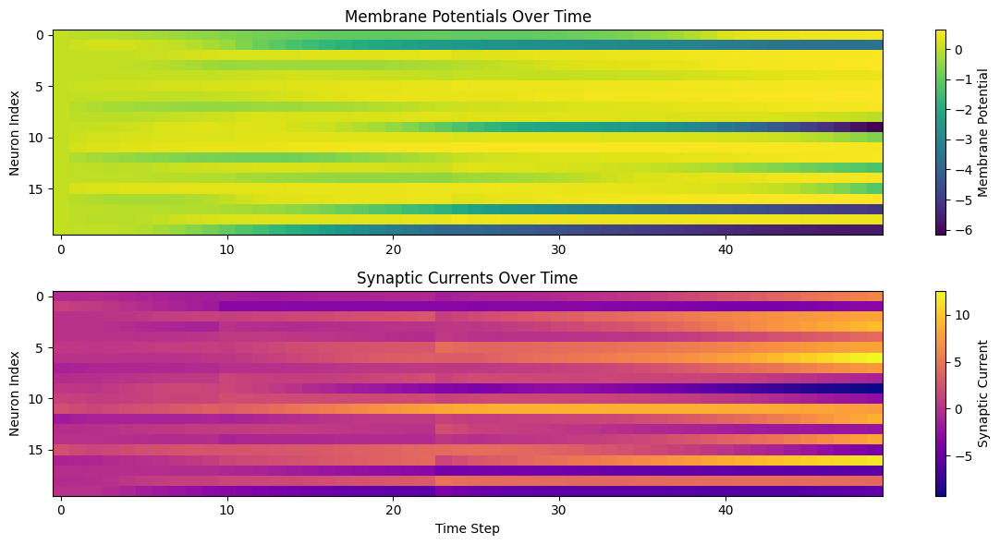

Neuron 0 is non-spiking.
Gamma value: 0.0


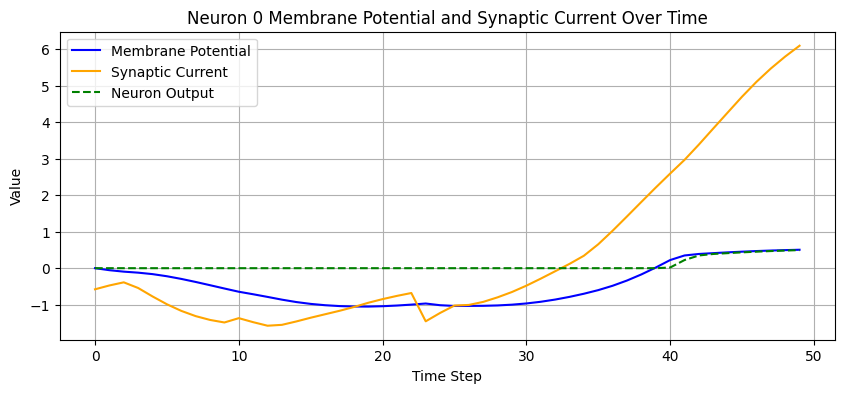

Neuron 1 is non-spiking.
Gamma value: 0.0


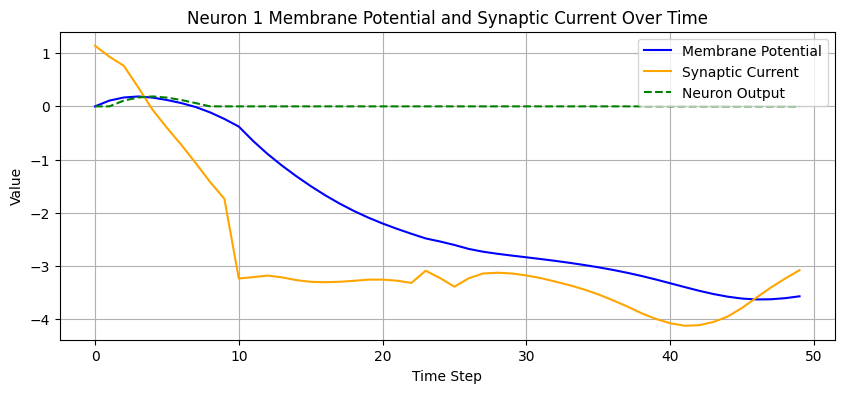

Neuron 2 is non-spiking.
Gamma value: 0.0


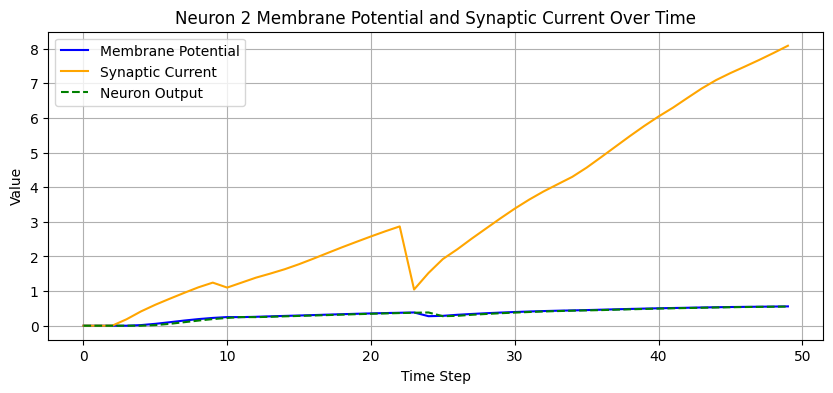

Neuron 3 is non-spiking.
Gamma value: 0.0


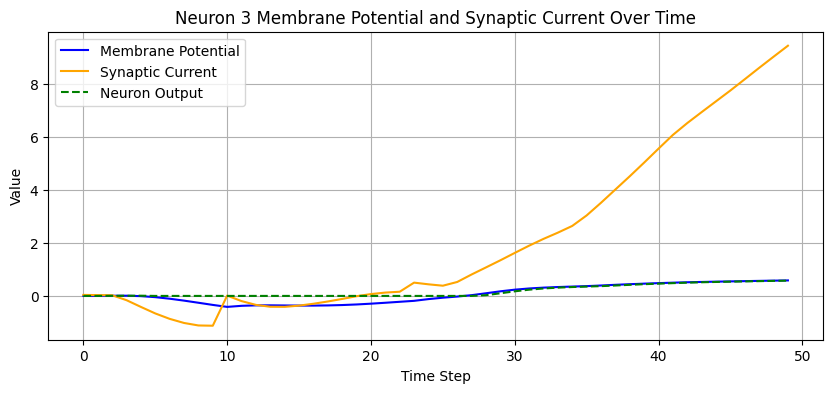

Neuron 4 is non-spiking.
Gamma value: 0.0


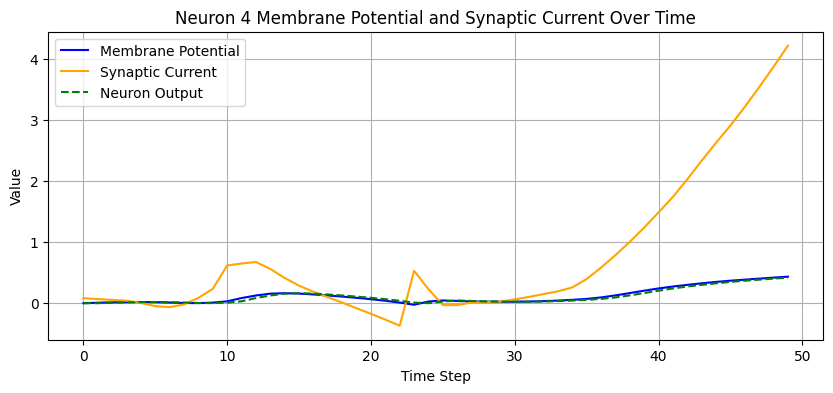

Neuron 5 is non-spiking.
Gamma value: 0.0


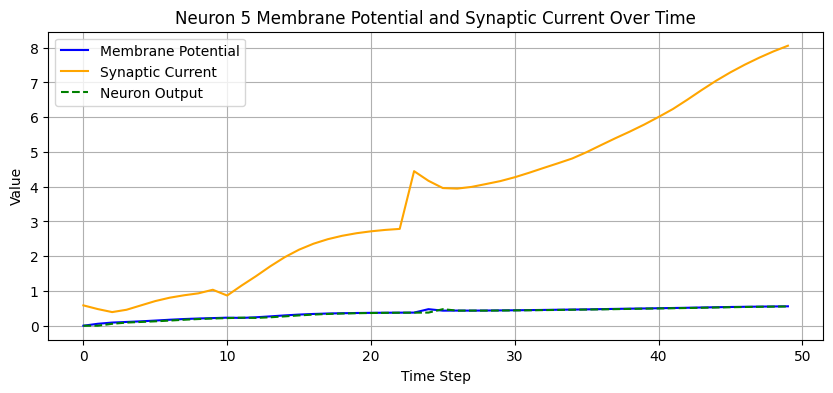

Neuron 6 is non-spiking.
Gamma value: 0.0


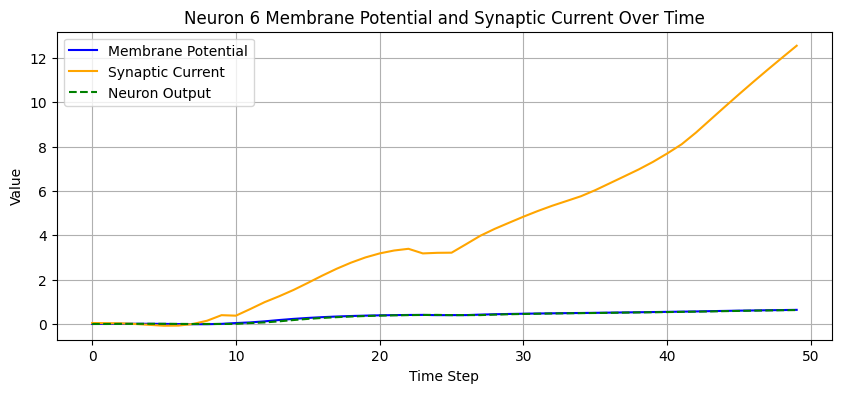

Neuron 7 is non-spiking.
Gamma value: 0.0


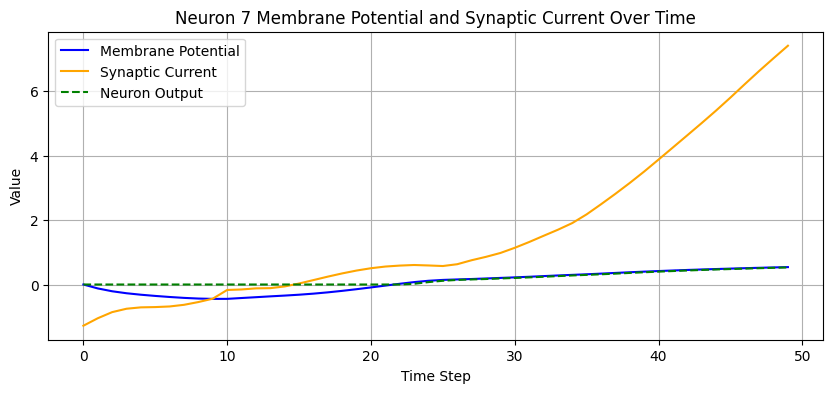

Neuron 8 is non-spiking.
Gamma value: 0.0


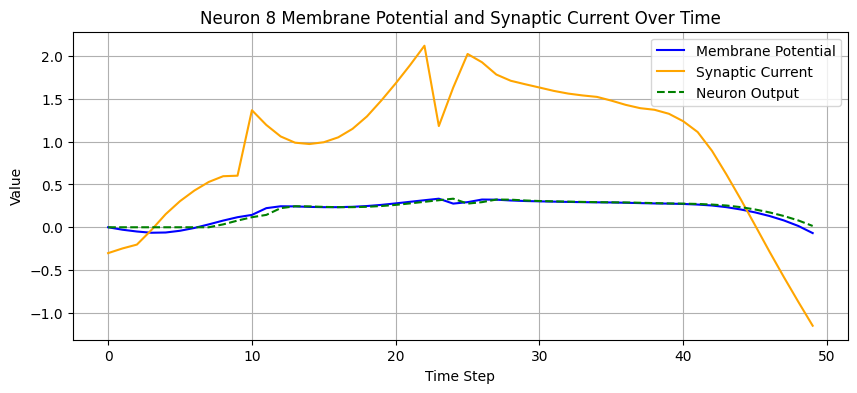

Neuron 9 is non-spiking.
Gamma value: 0.0


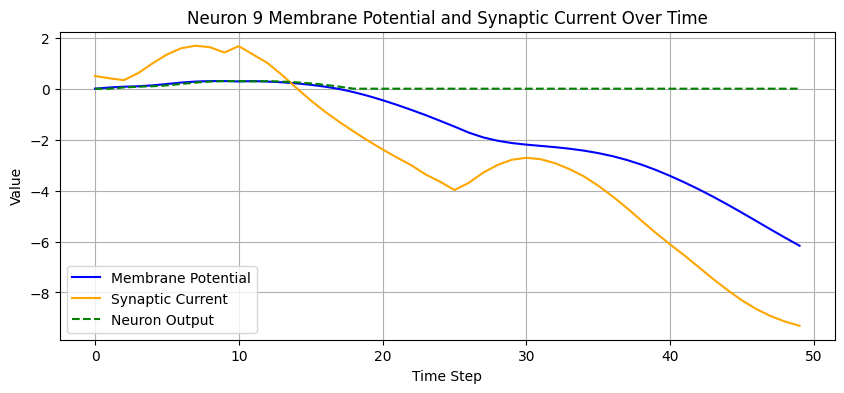

Neuron 10 is non-spiking.
Gamma value: 0.0


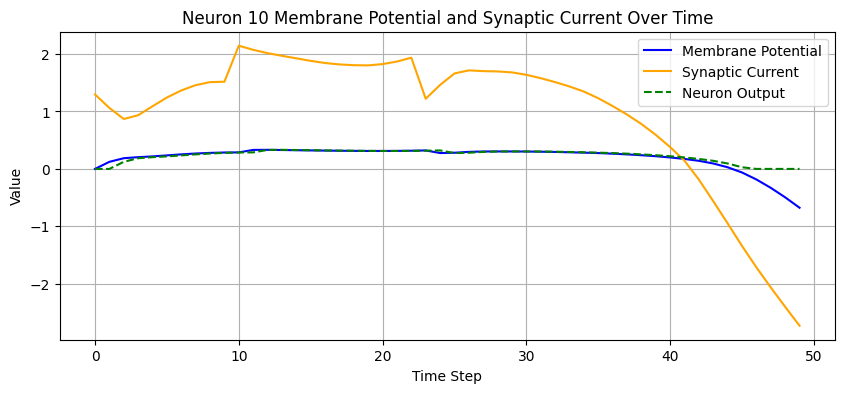

Neuron 11 is non-spiking.
Gamma value: 0.0


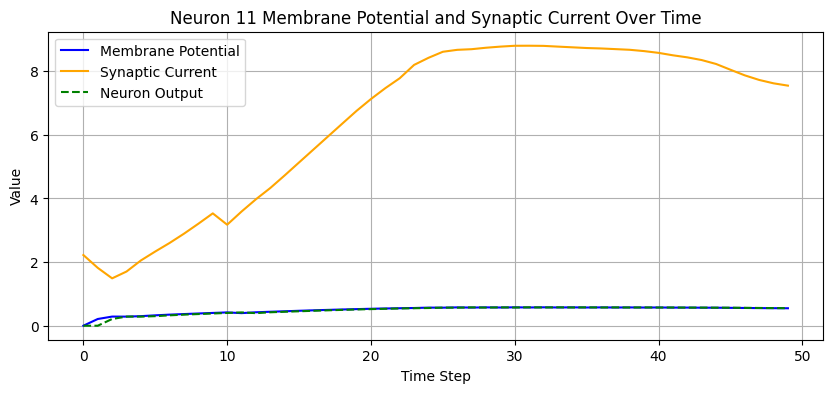

Neuron 12 is non-spiking.
Gamma value: 0.0


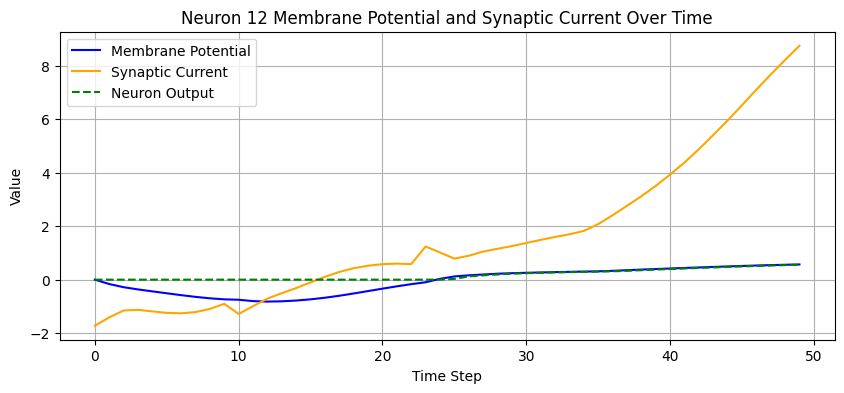

Neuron 13 is non-spiking.
Gamma value: 0.0


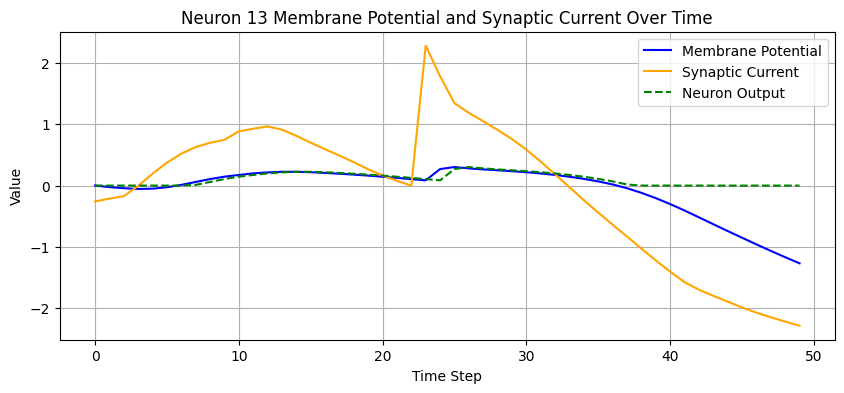

Neuron 14 is non-spiking.
Gamma value: 0.0


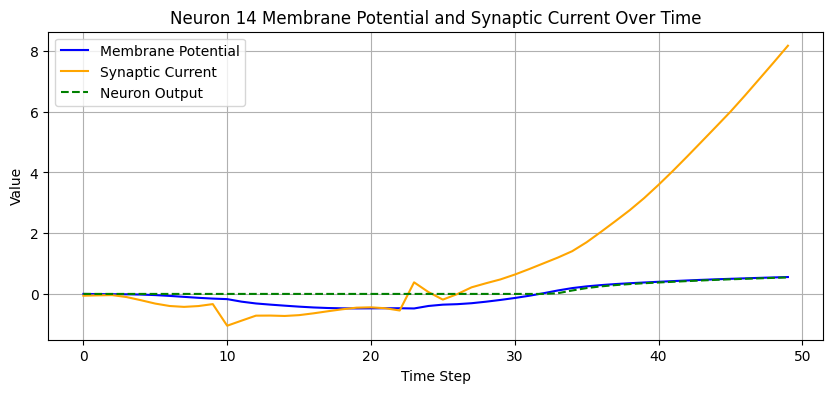

Neuron 15 is non-spiking.
Gamma value: 0.0


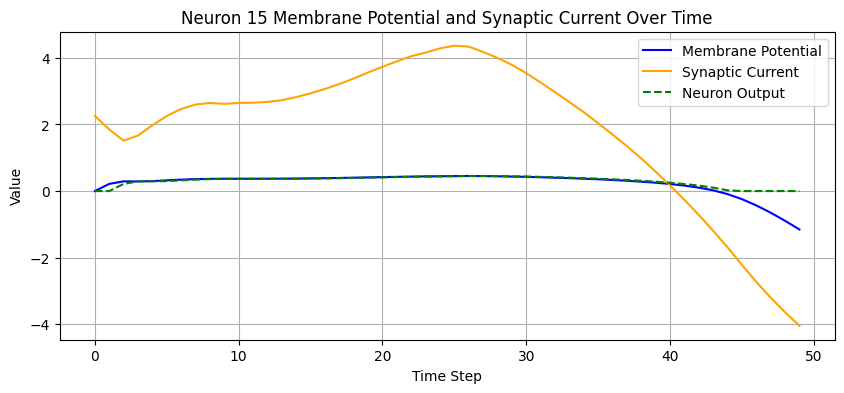

Neuron 16 is non-spiking.
Gamma value: 0.0


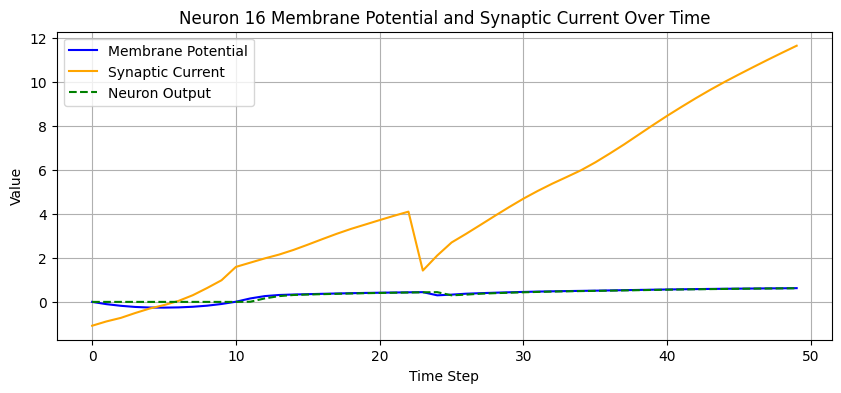

Neuron 17 is non-spiking.
Gamma value: 0.0


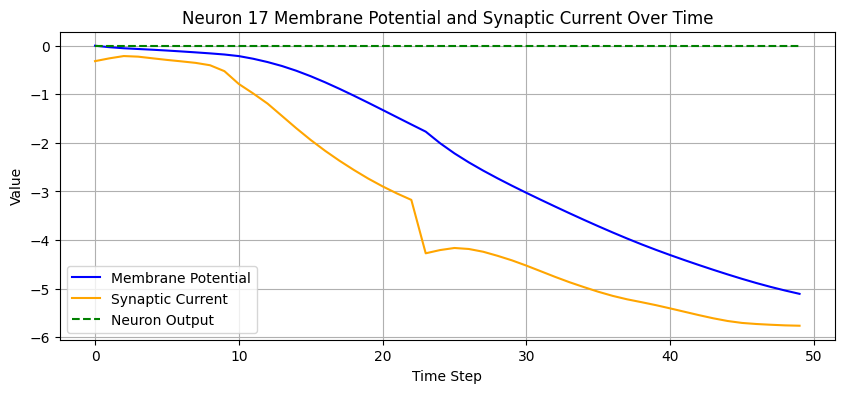

Neuron 18 is non-spiking.
Gamma value: 0.0


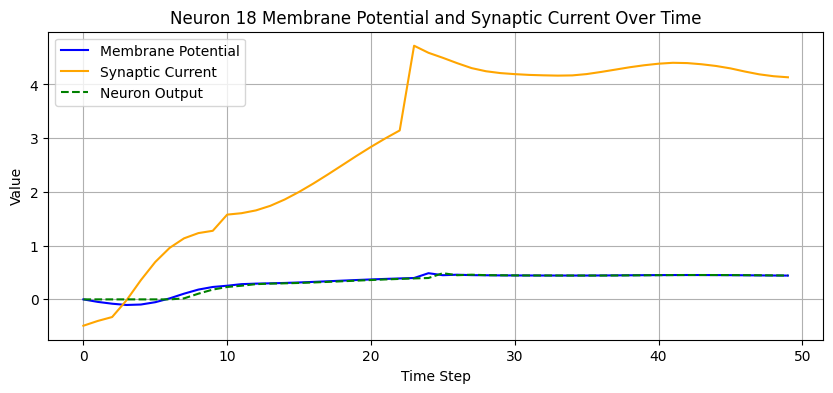

Neuron 19 is non-spiking.
Gamma value: 0.0


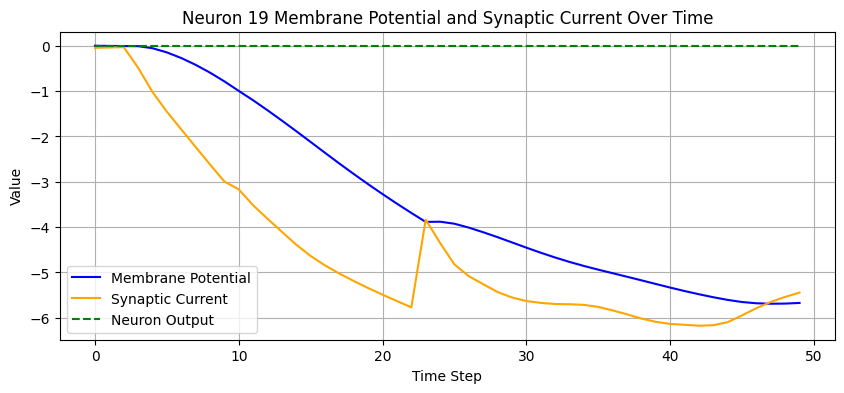

Seed: 2


Testing:   0%|          | 0/1 [00:00<?, ?it/s]


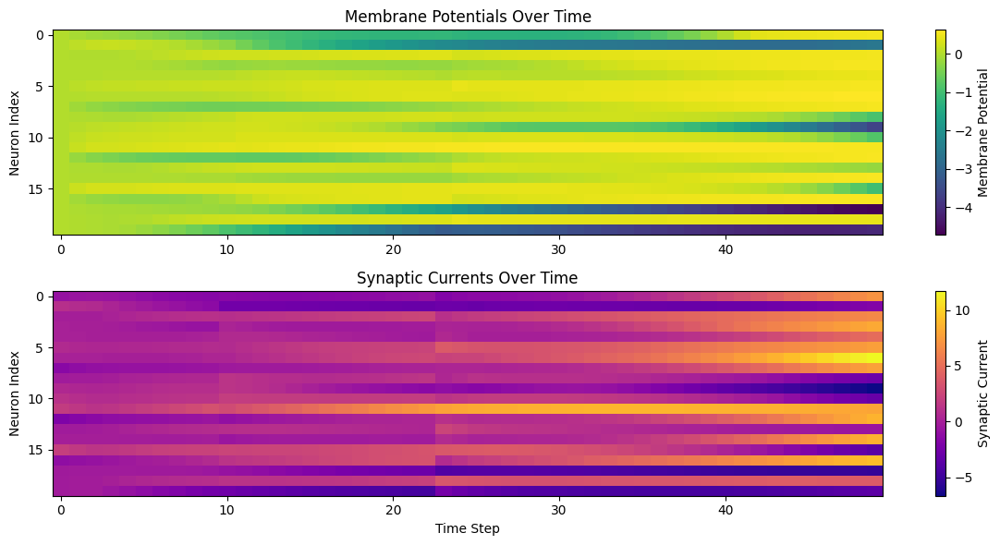

Neuron 0 is non-spiking.
Gamma value: 0.0


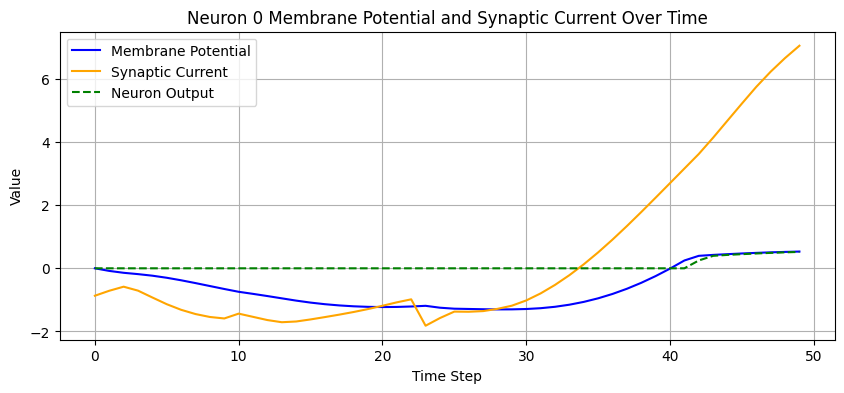

Neuron 1 is non-spiking.
Gamma value: 0.0


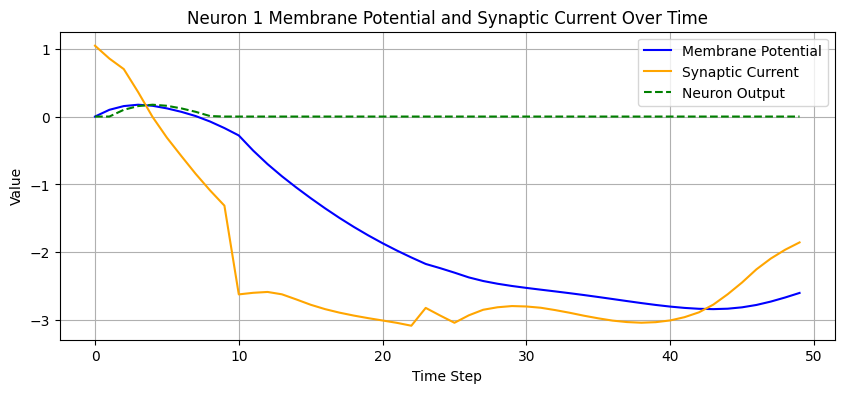

Neuron 2 is non-spiking.
Gamma value: 0.0


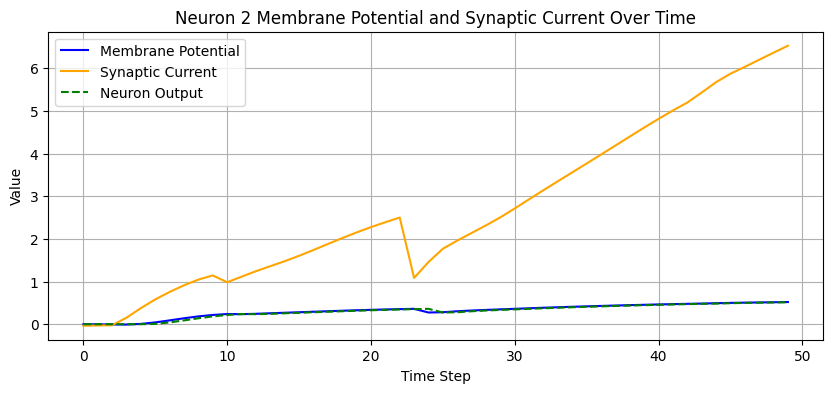

Neuron 3 is non-spiking.
Gamma value: 0.0


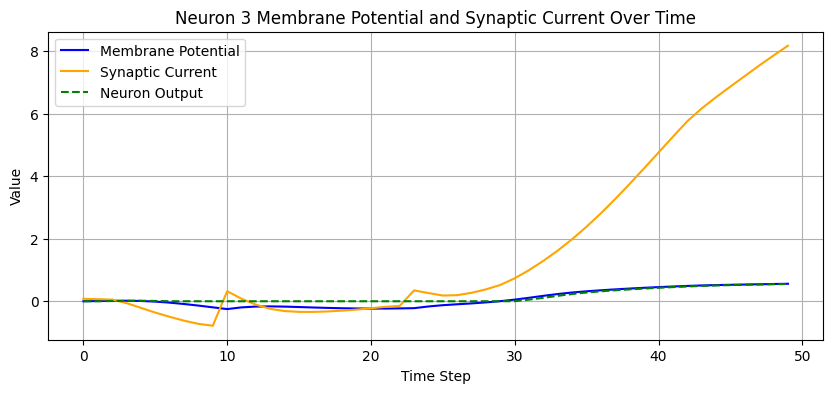

Neuron 4 is non-spiking.
Gamma value: 0.0


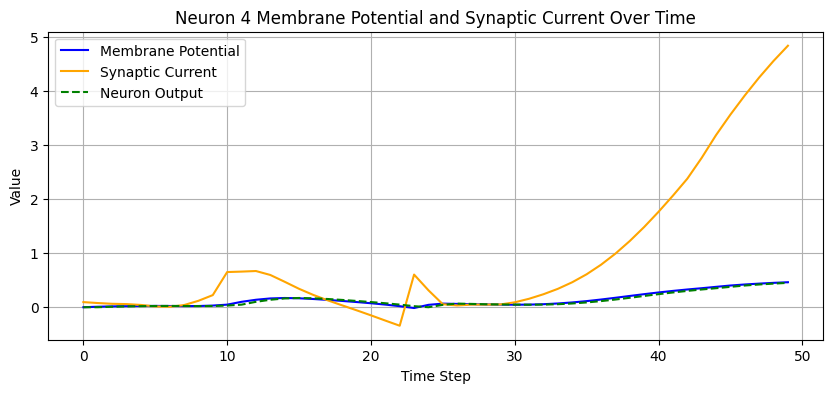

Neuron 5 is non-spiking.
Gamma value: 0.0


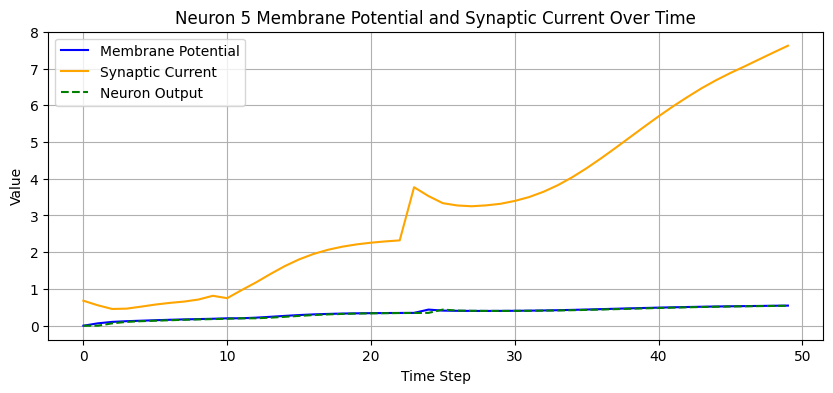

Neuron 6 is non-spiking.
Gamma value: 0.0


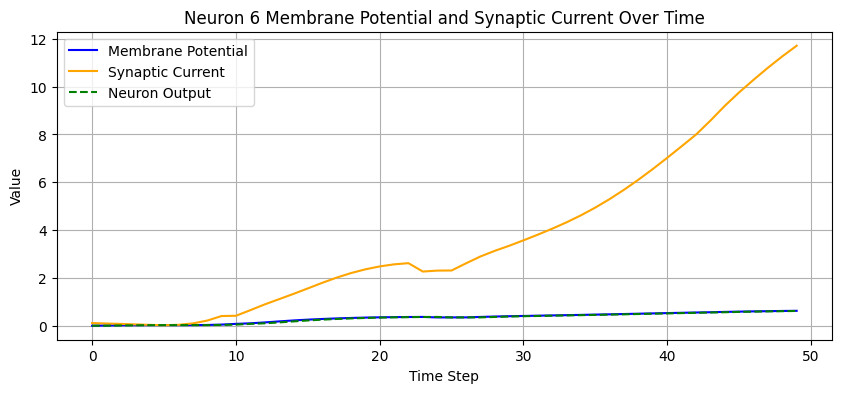

Neuron 7 is non-spiking.
Gamma value: 0.0


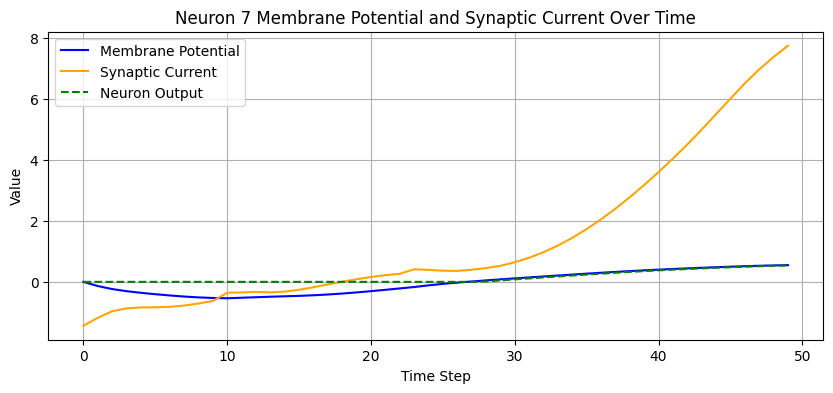

Neuron 8 is non-spiking.
Gamma value: 0.0


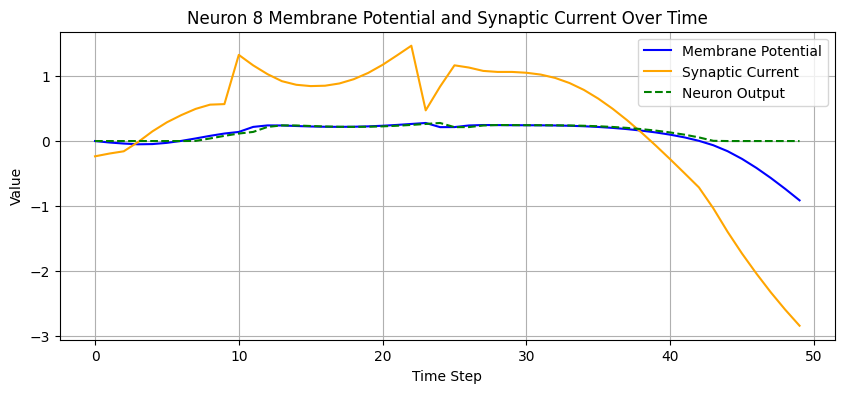

Neuron 9 is non-spiking.
Gamma value: 0.0


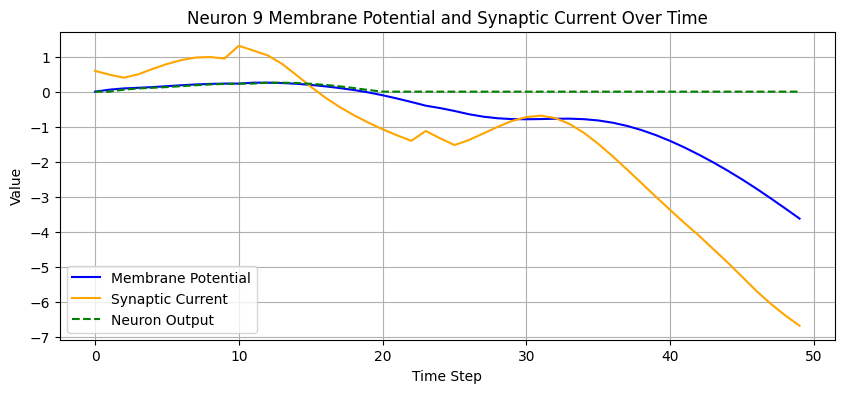

Neuron 10 is non-spiking.
Gamma value: 0.0


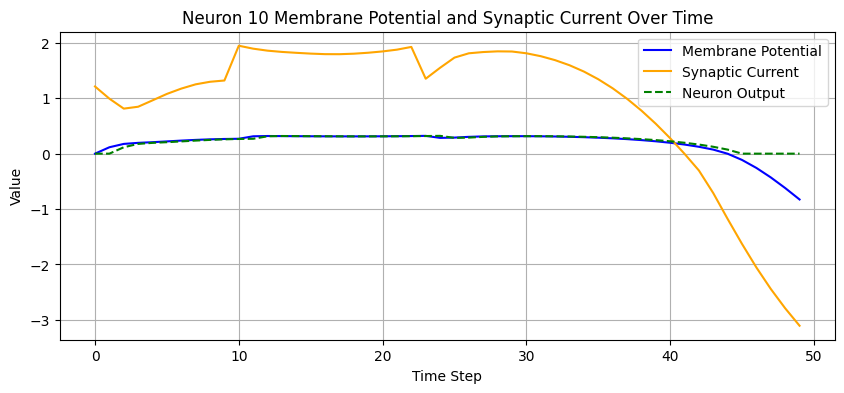

Neuron 11 is non-spiking.
Gamma value: 0.0


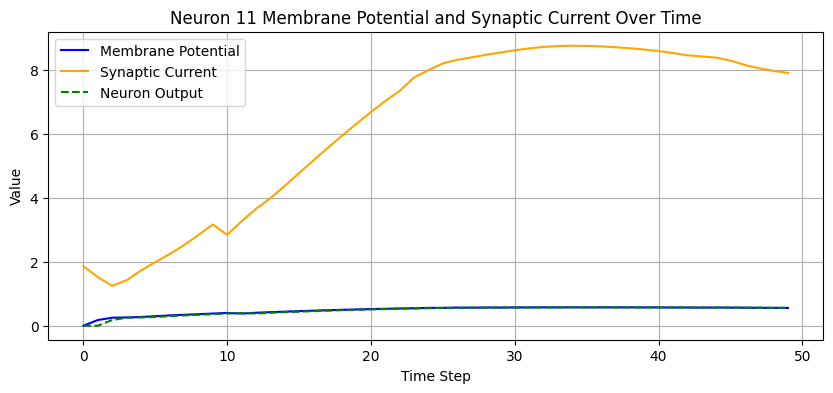

Neuron 12 is non-spiking.
Gamma value: 0.0


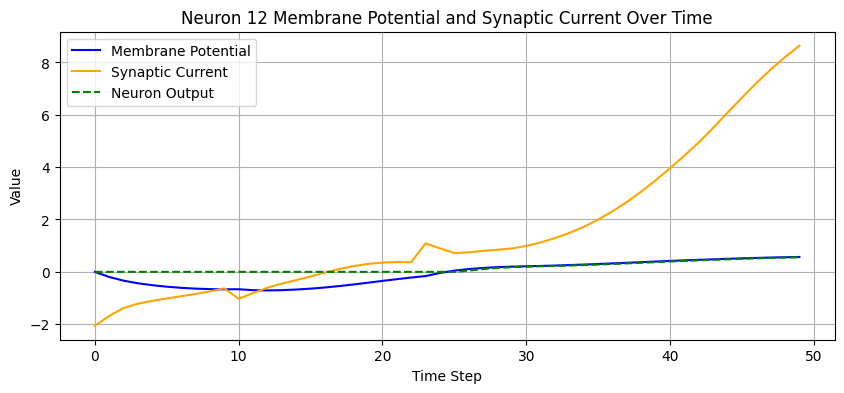

Neuron 13 is non-spiking.
Gamma value: 0.0


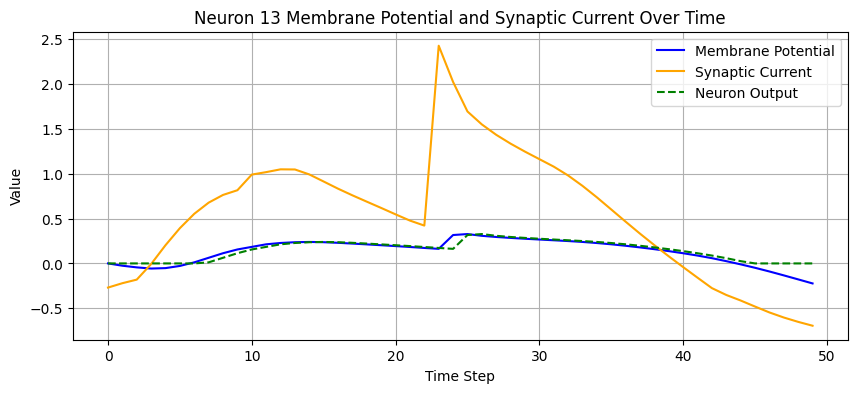

Neuron 14 is non-spiking.
Gamma value: 0.0


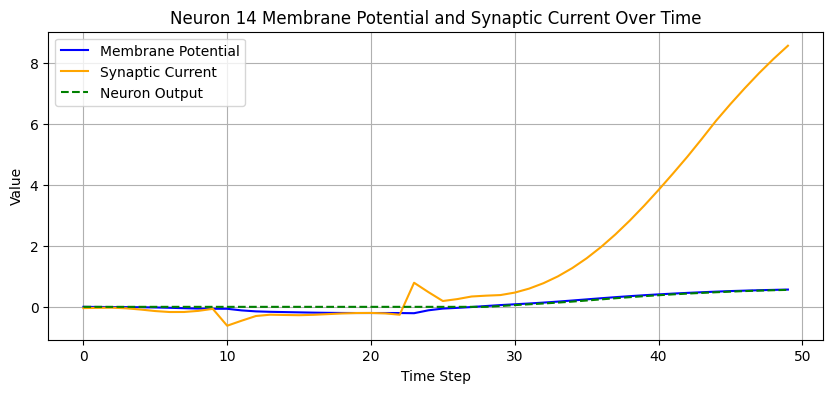

Neuron 15 is non-spiking.
Gamma value: 0.0


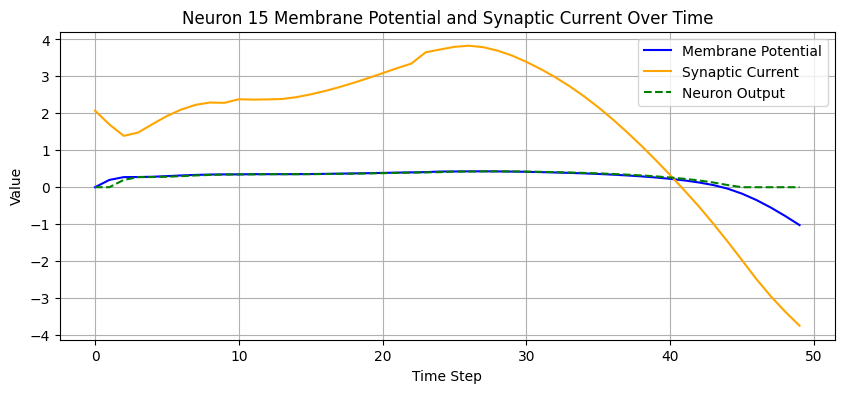

Neuron 16 is non-spiking.
Gamma value: 0.0


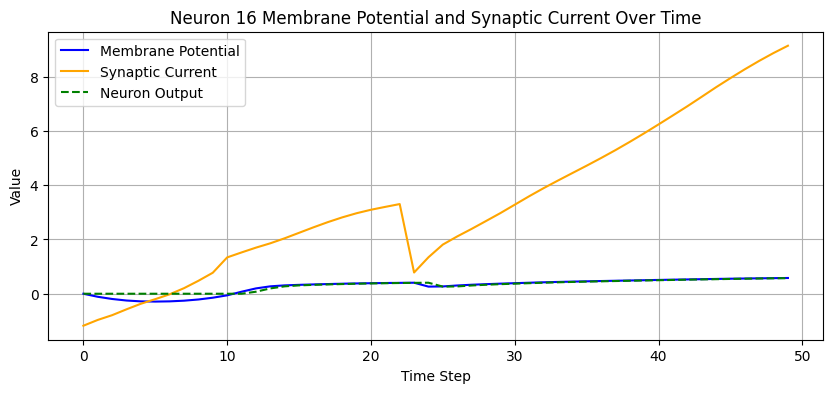

Neuron 17 is non-spiking.
Gamma value: 0.0


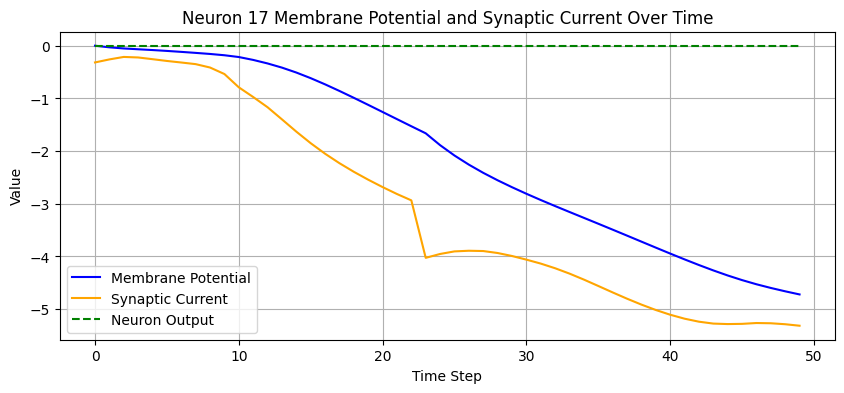

Neuron 18 is non-spiking.
Gamma value: 0.0


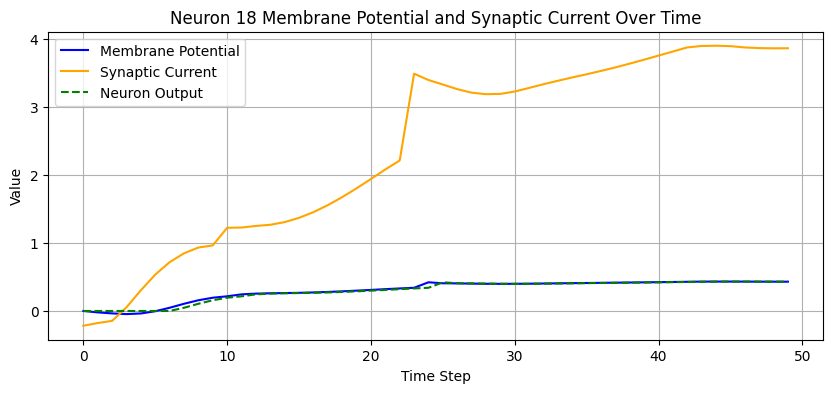

Neuron 19 is non-spiking.
Gamma value: 0.0


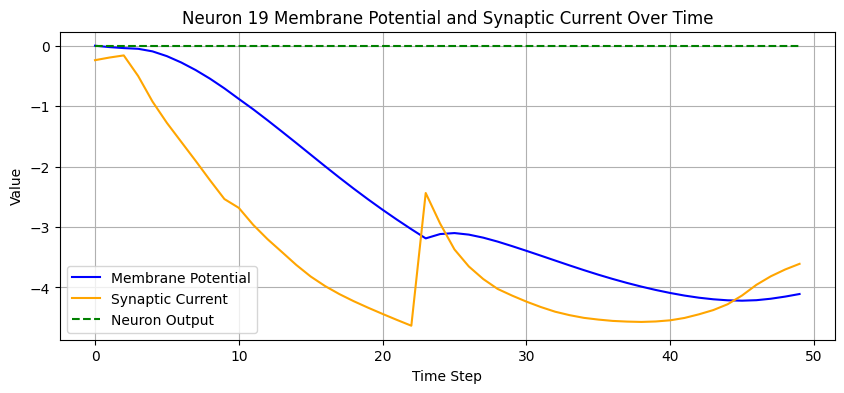

Seed: 3


Testing:   0%|          | 0/1 [00:00<?, ?it/s]


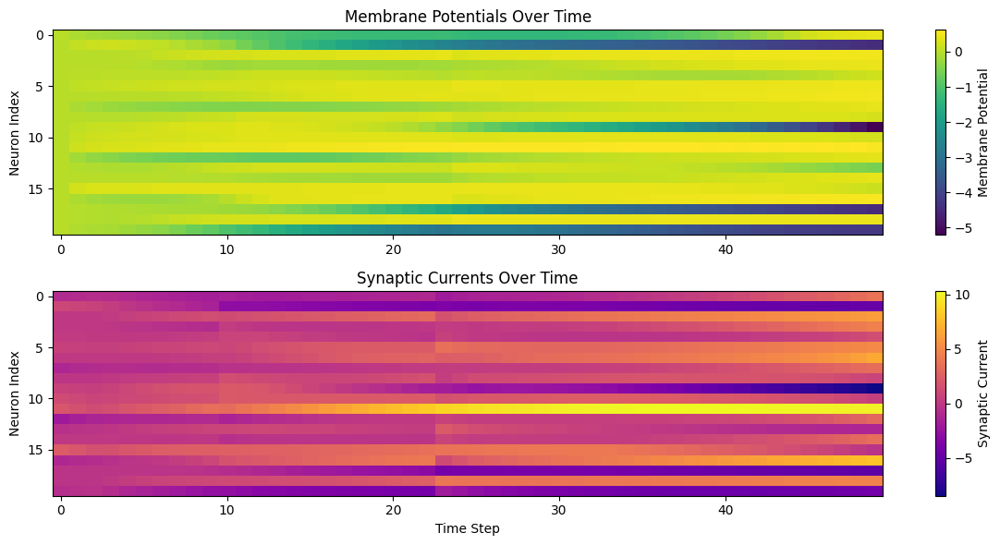

Neuron 0 is non-spiking.
Gamma value: 0.0


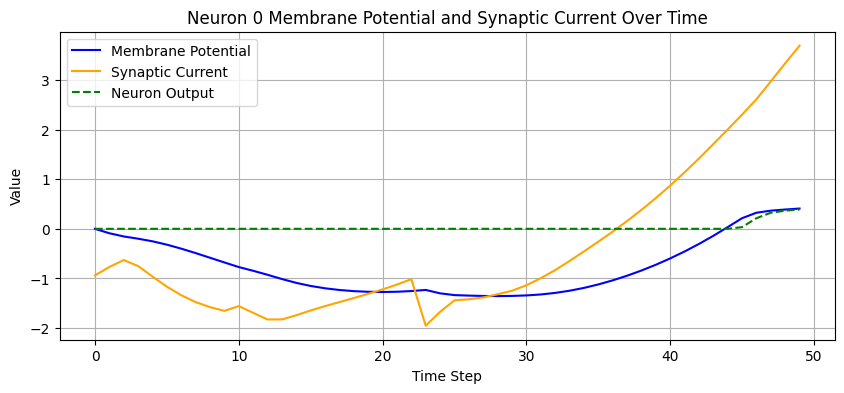

Neuron 1 is non-spiking.
Gamma value: 0.0


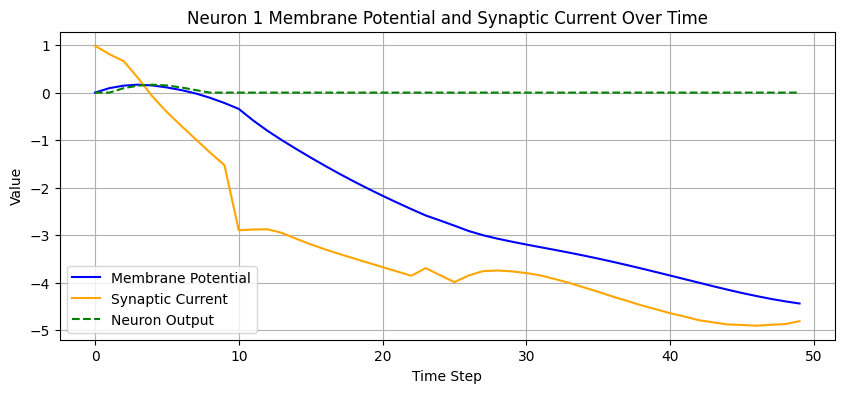

Neuron 2 is non-spiking.
Gamma value: 0.0


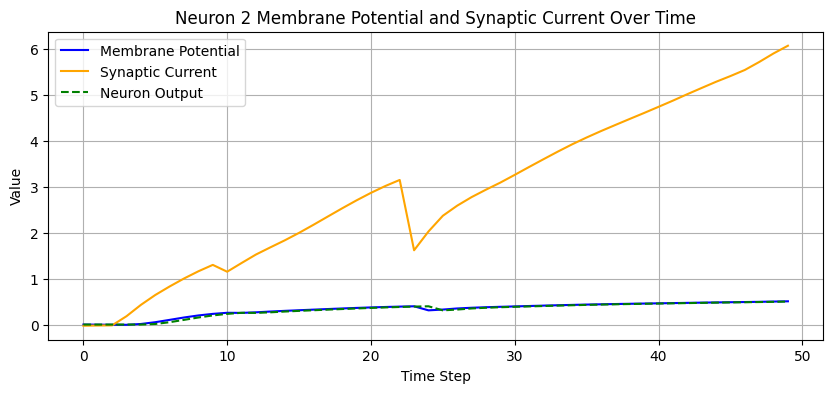

Neuron 3 is non-spiking.
Gamma value: 0.0


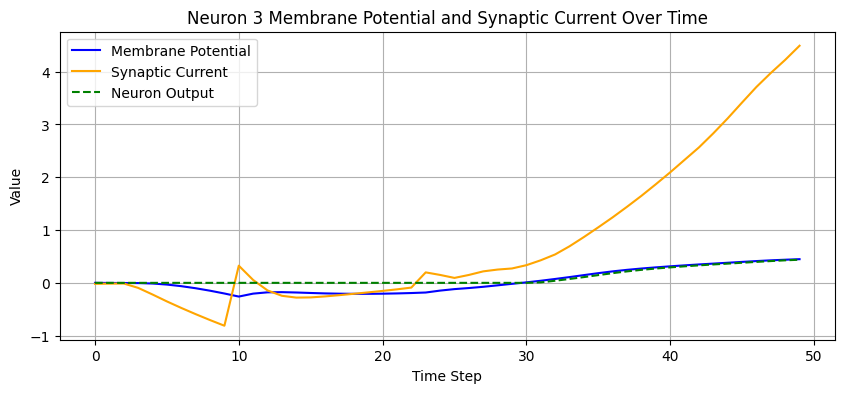

Neuron 4 is non-spiking.
Gamma value: 0.0


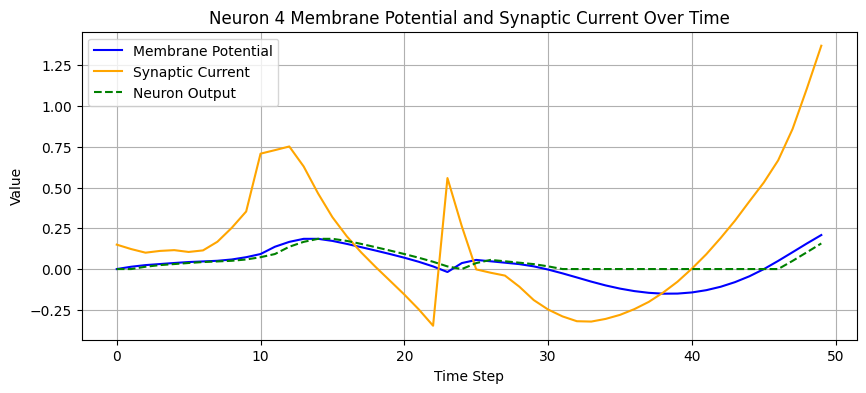

Neuron 5 is non-spiking.
Gamma value: 0.0


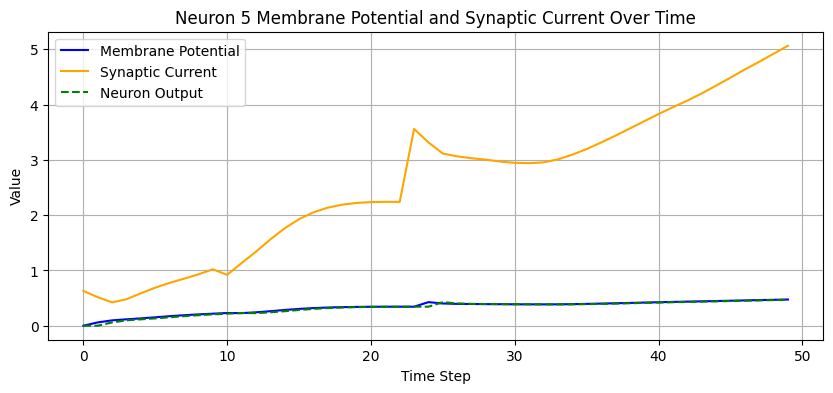

Neuron 6 is non-spiking.
Gamma value: 0.0


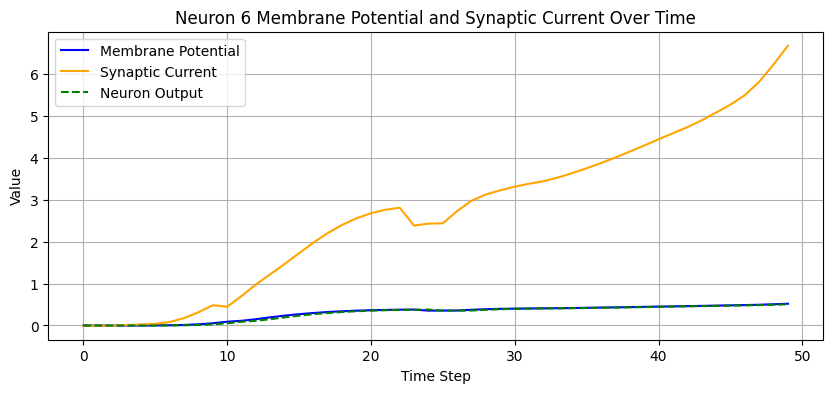

Neuron 7 is non-spiking.
Gamma value: 0.0


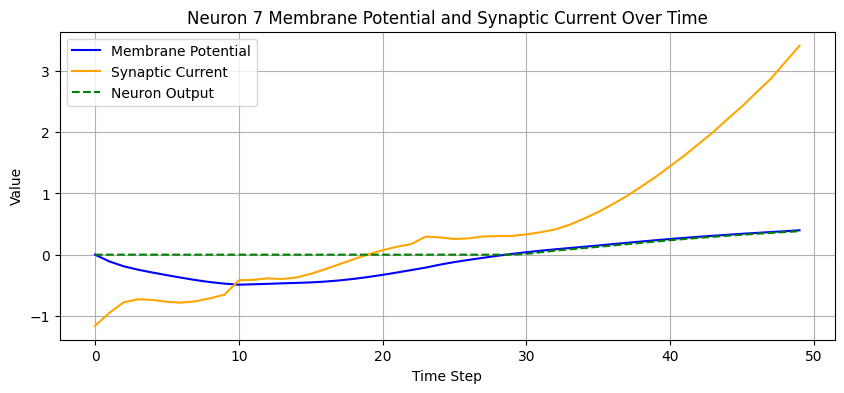

Neuron 8 is non-spiking.
Gamma value: 0.0


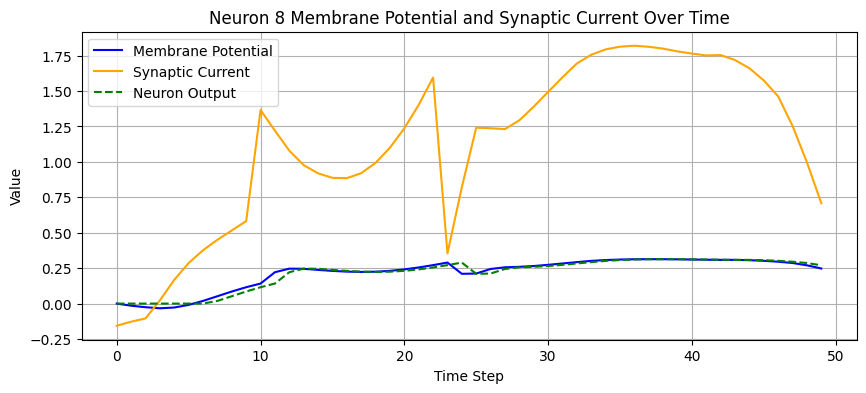

Neuron 9 is non-spiking.
Gamma value: 0.0


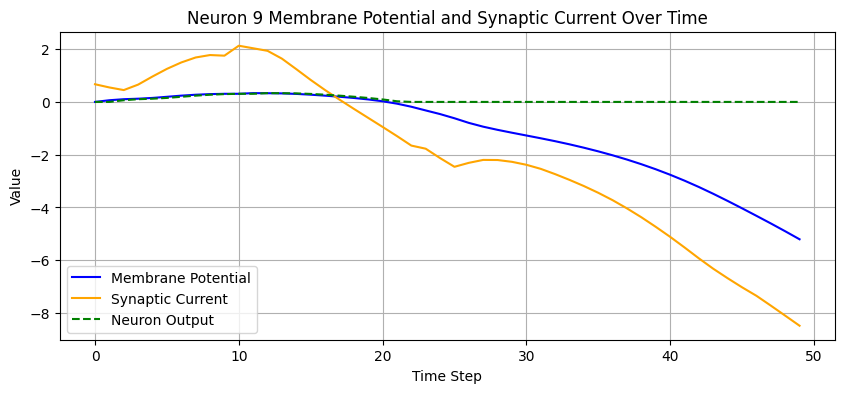

Neuron 10 is non-spiking.
Gamma value: 0.0


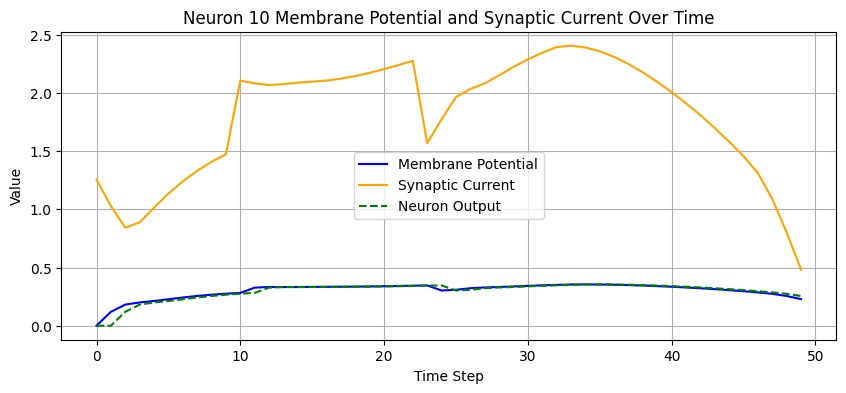

Neuron 11 is non-spiking.
Gamma value: 0.0


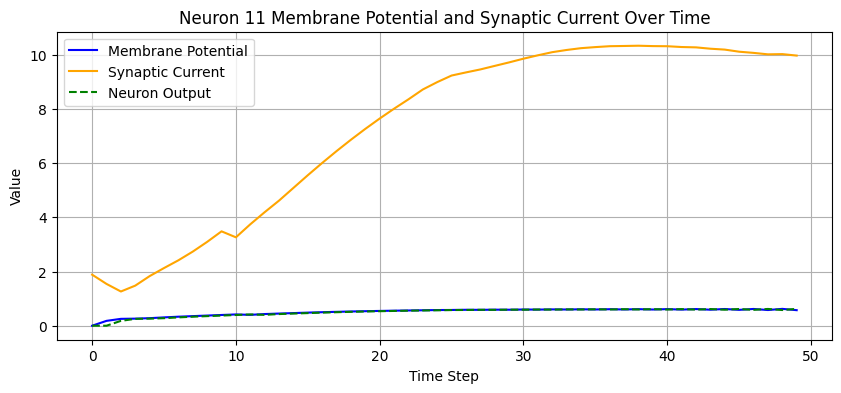

Neuron 12 is non-spiking.
Gamma value: 0.0


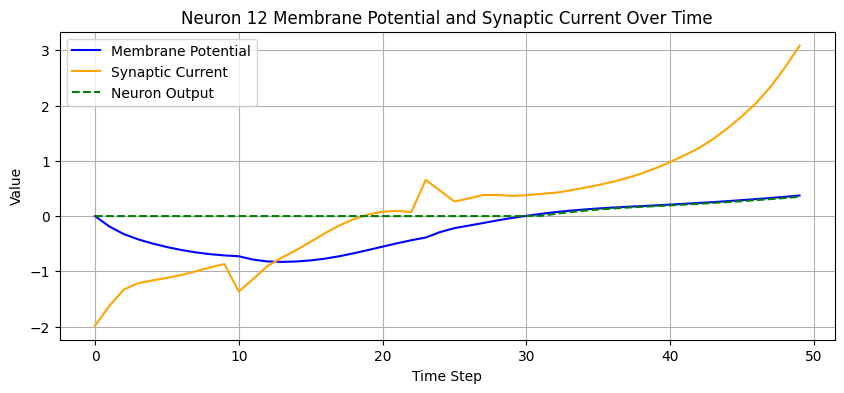

Neuron 13 is non-spiking.
Gamma value: 0.0


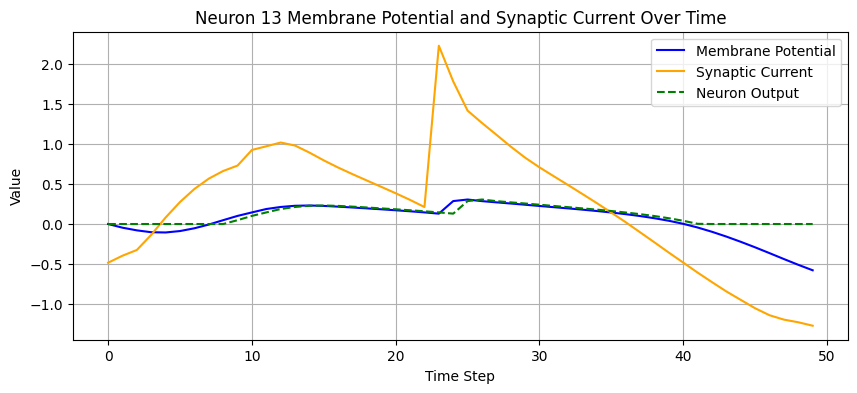

Neuron 14 is non-spiking.
Gamma value: 0.0


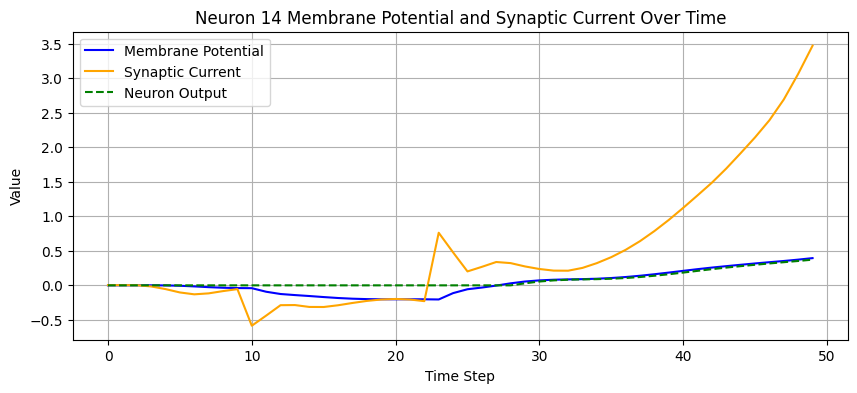

Neuron 15 is non-spiking.
Gamma value: 0.0


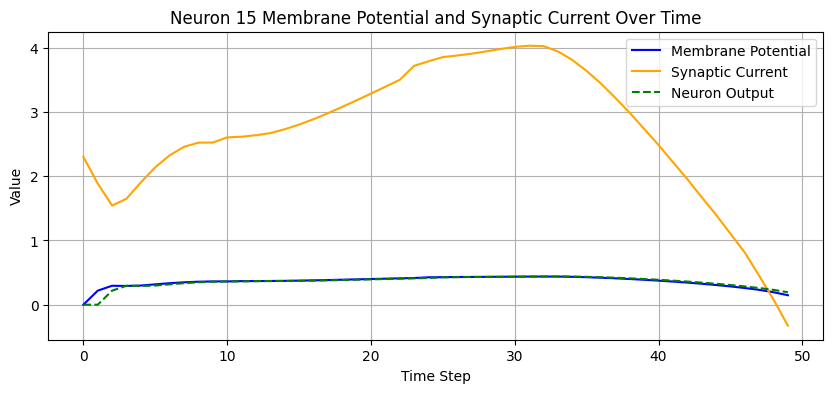

Neuron 16 is non-spiking.
Gamma value: 0.0


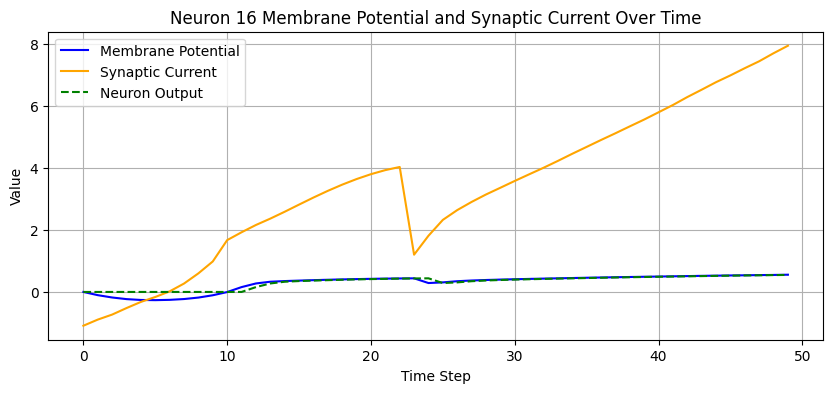

Neuron 17 is non-spiking.
Gamma value: 0.0


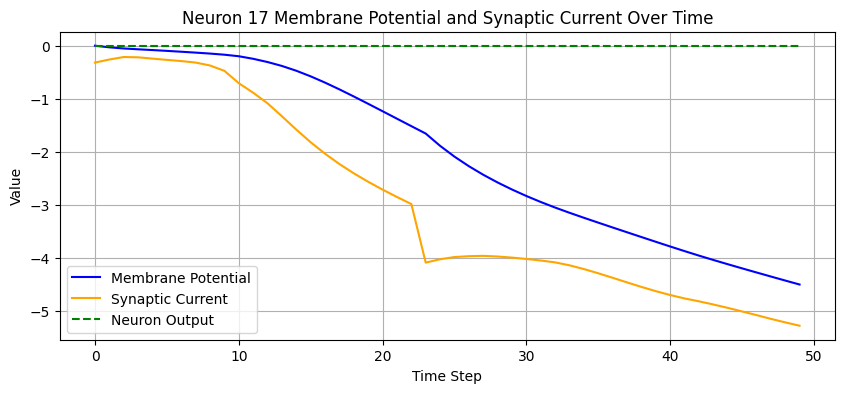

Neuron 18 is non-spiking.
Gamma value: 0.0


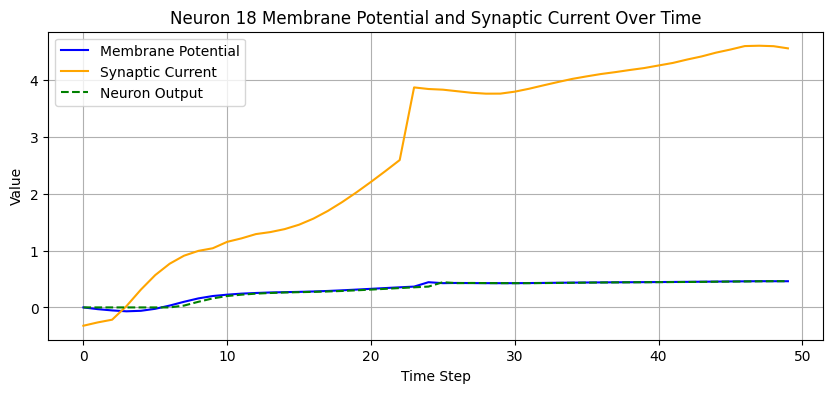

Neuron 19 is non-spiking.
Gamma value: 0.0


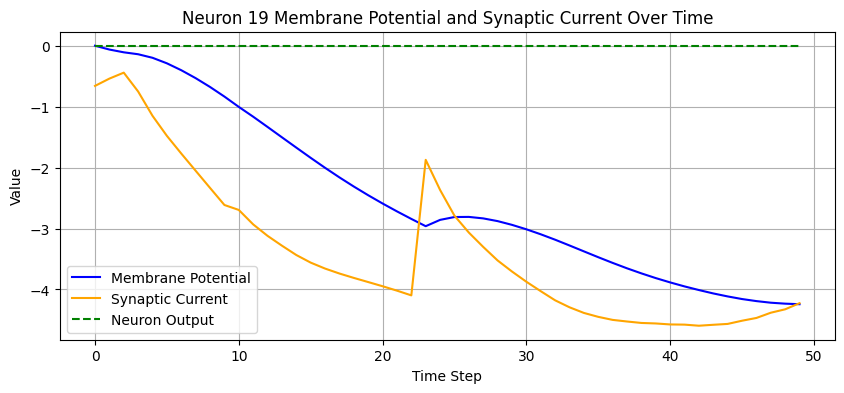

Seed: 4


Testing:   0%|          | 0/1 [00:00<?, ?it/s]


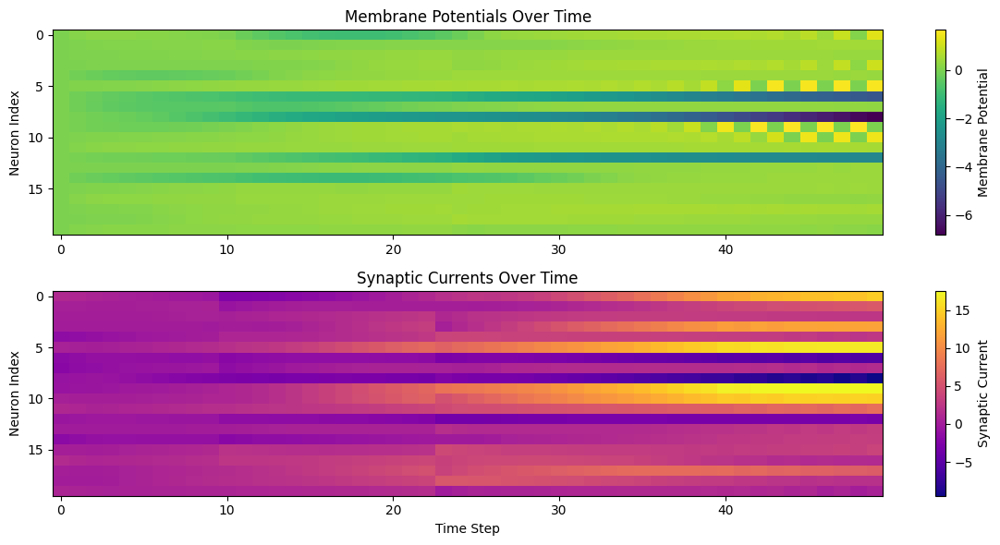

Neuron 0 is non-spiking.
Gamma value: 0.0


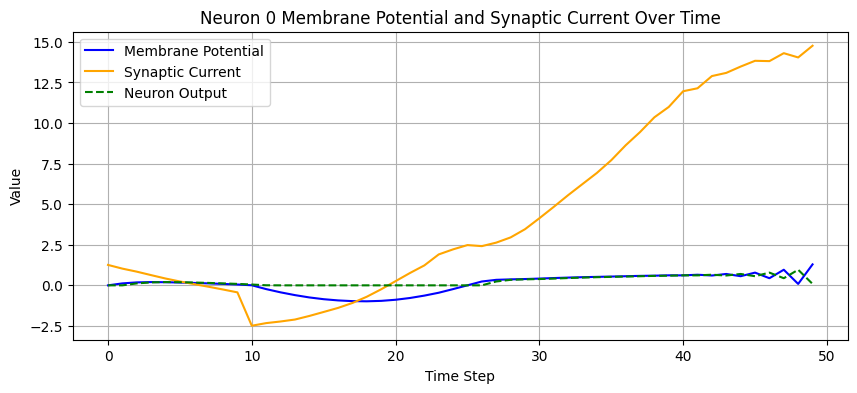

Neuron 1 is non-spiking.
Gamma value: 0.0


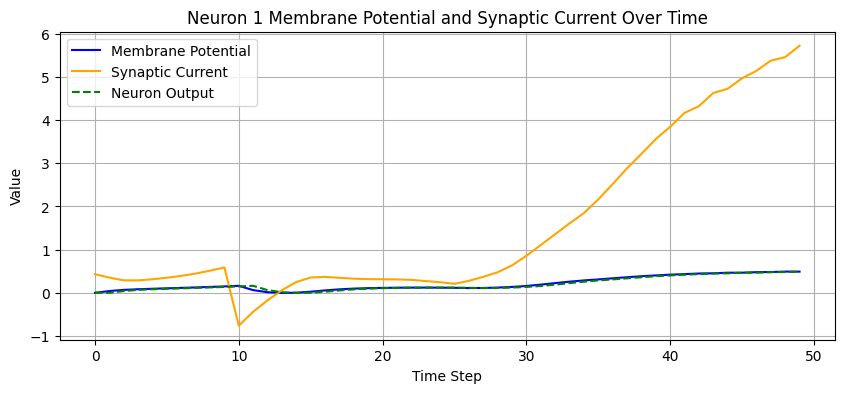

Neuron 2 is non-spiking.
Gamma value: 0.0


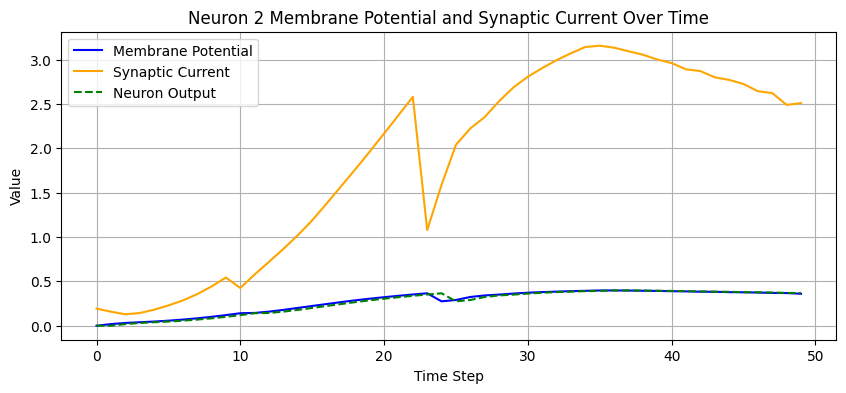

Neuron 3 is non-spiking.
Gamma value: 0.0


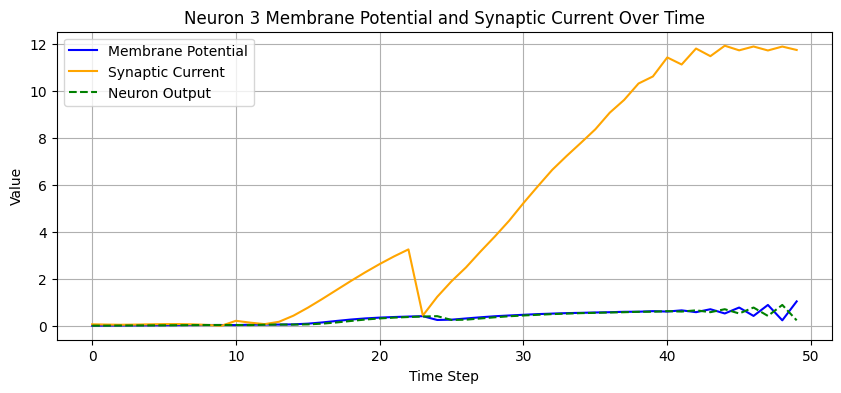

Neuron 4 is non-spiking.
Gamma value: 0.0


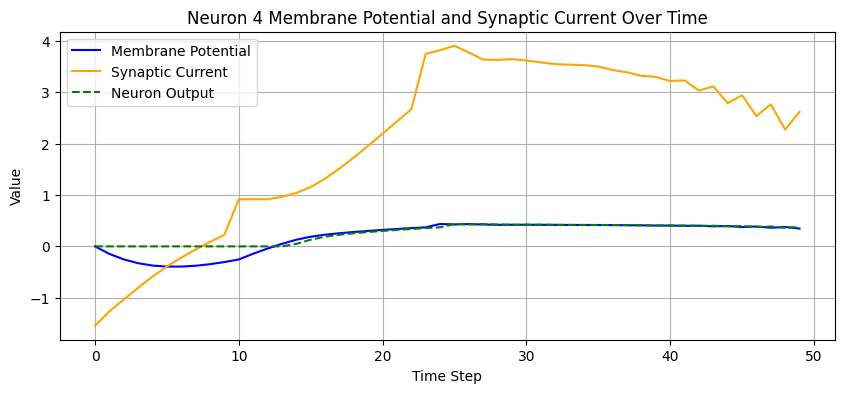

Neuron 5 is non-spiking.
Gamma value: 0.0


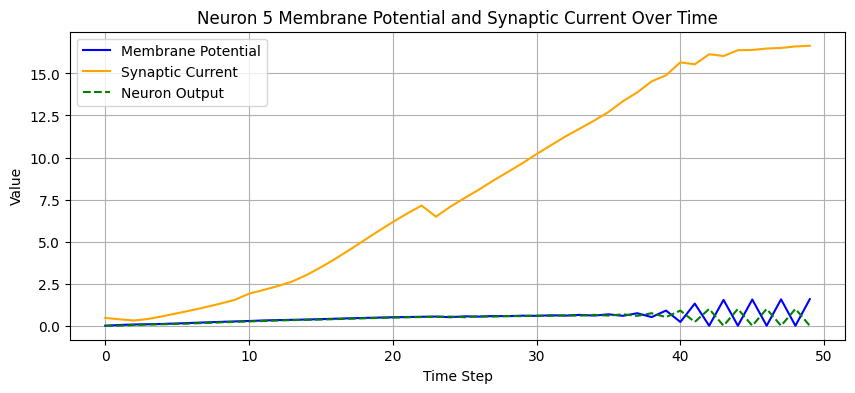

Neuron 6 is non-spiking.
Gamma value: 0.0


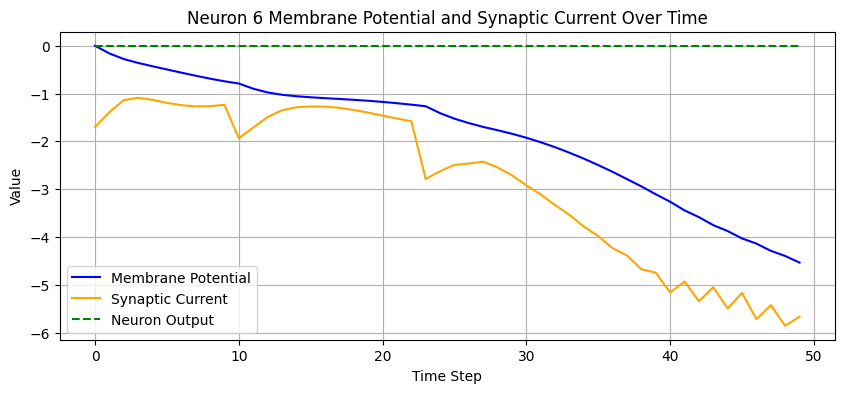

Neuron 7 is non-spiking.
Gamma value: 0.0


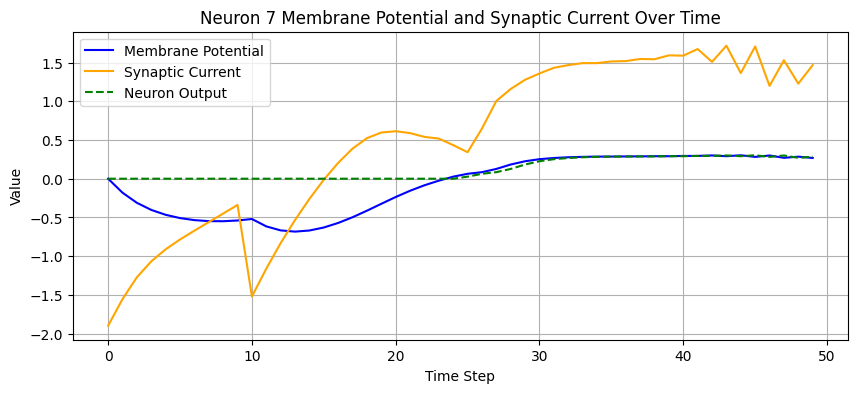

Neuron 8 is non-spiking.
Gamma value: 0.0


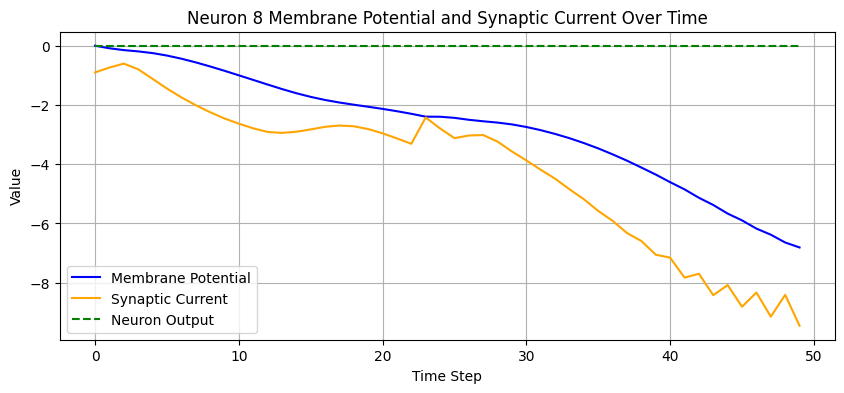

Neuron 9 is non-spiking.
Gamma value: 0.0


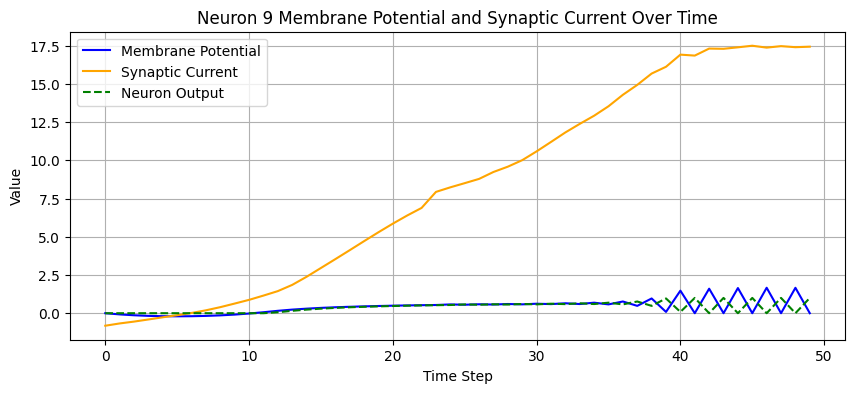

Neuron 10 is non-spiking.
Gamma value: 0.0


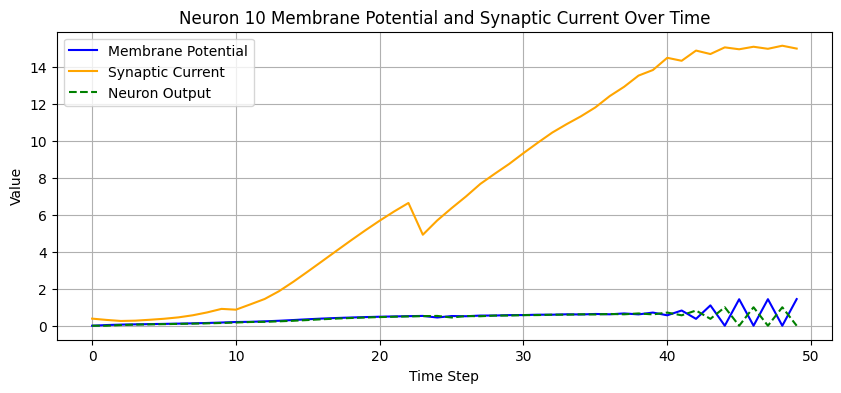

Neuron 11 is non-spiking.
Gamma value: 0.0


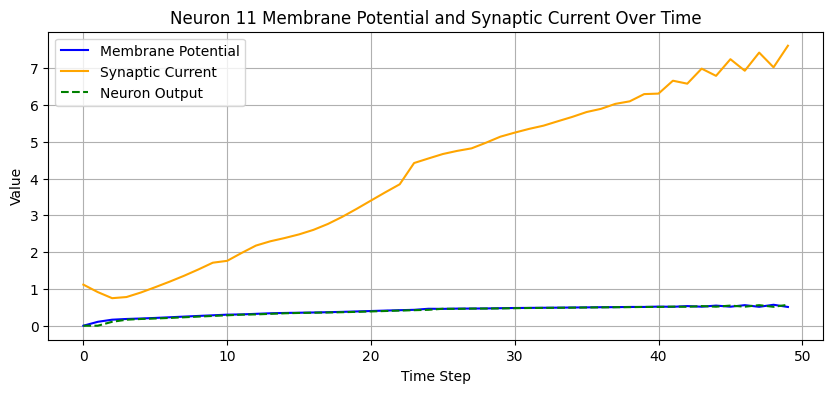

Neuron 12 is non-spiking.
Gamma value: 0.0


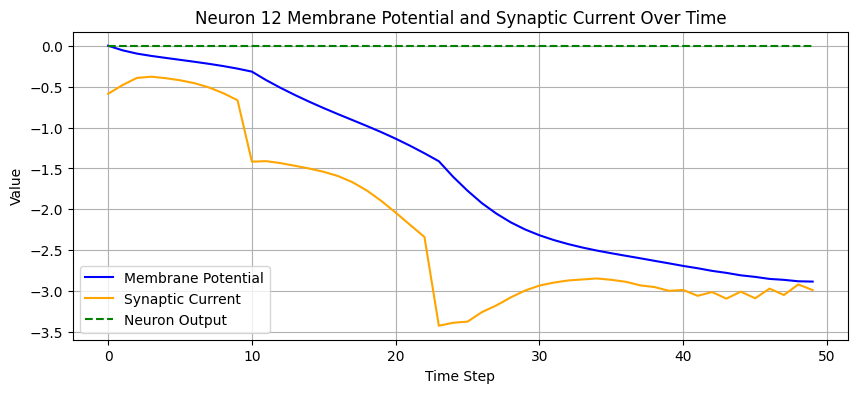

Neuron 13 is non-spiking.
Gamma value: 0.0


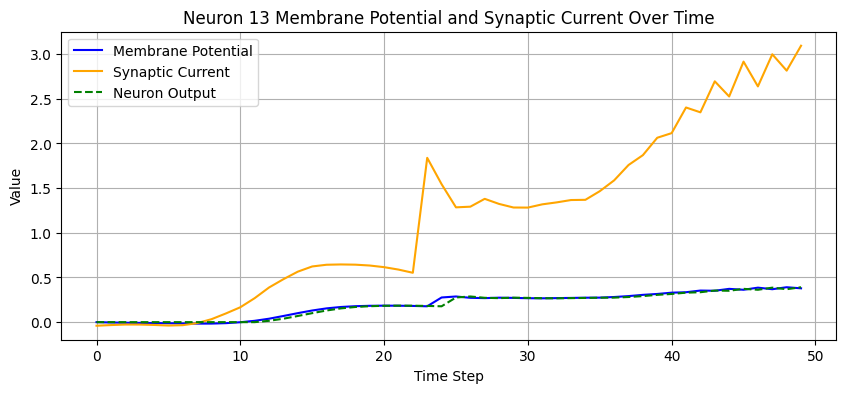

Neuron 14 is non-spiking.
Gamma value: 0.0


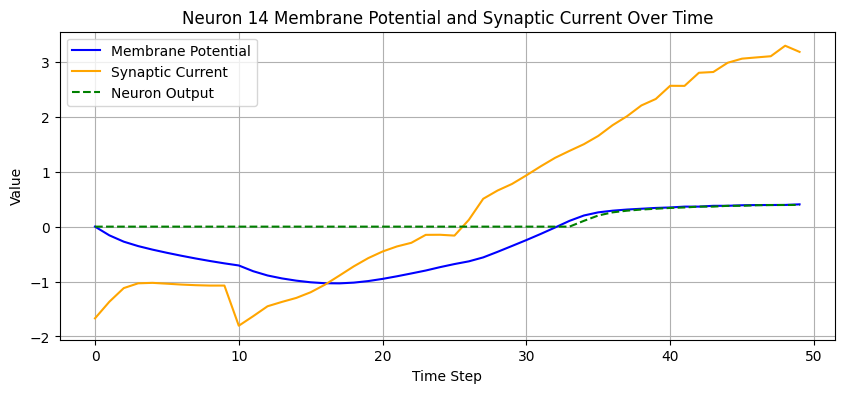

Neuron 15 is non-spiking.
Gamma value: 0.0


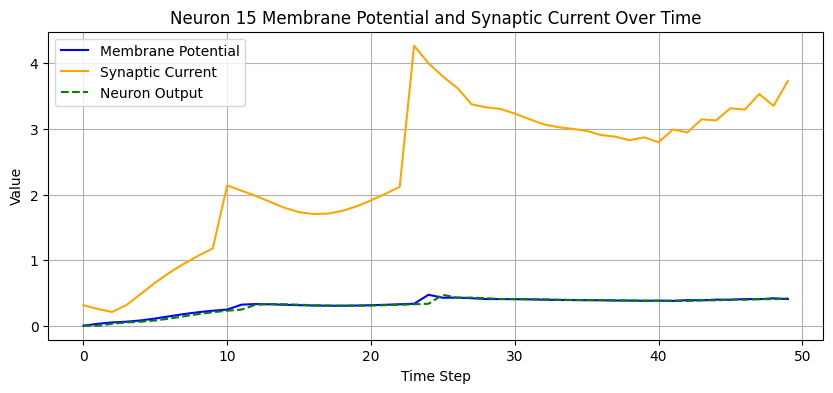

Neuron 16 is non-spiking.
Gamma value: 0.0


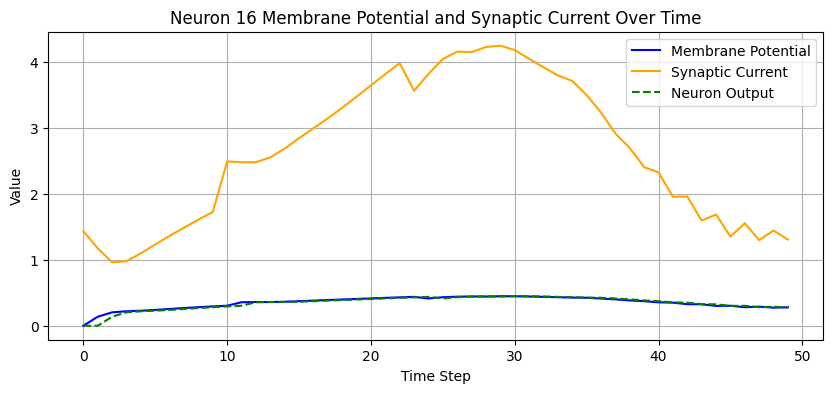

Neuron 17 is non-spiking.
Gamma value: 0.0


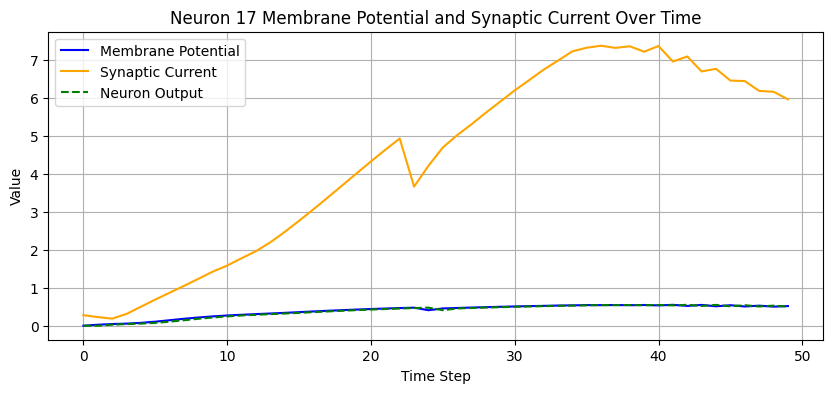

Neuron 18 is non-spiking.
Gamma value: 0.0


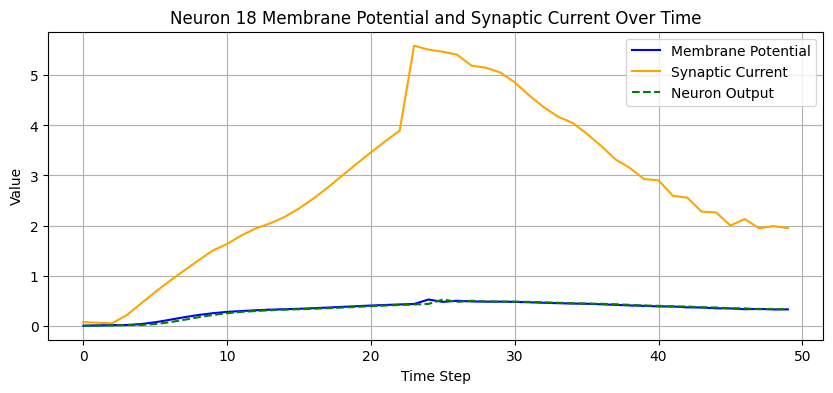

Neuron 19 is non-spiking.
Gamma value: 0.0


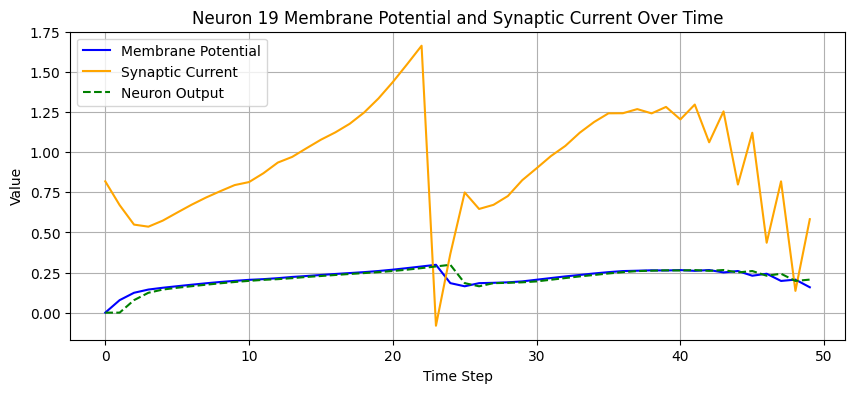

Seed: 5


Testing:   0%|          | 0/1 [00:00<?, ?it/s]


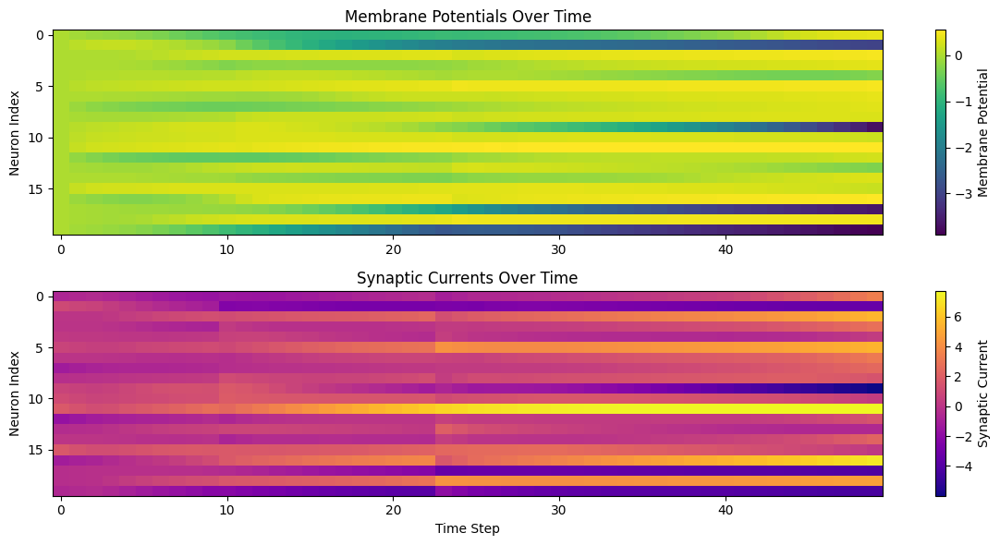

Neuron 0 is non-spiking.
Gamma value: 0.0


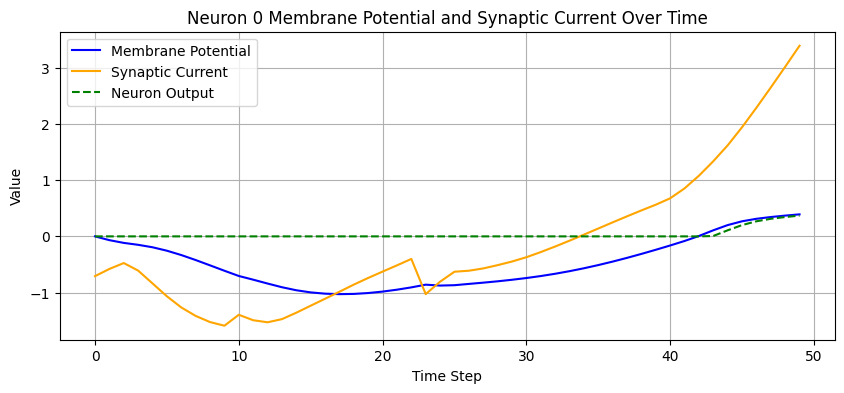

Neuron 1 is non-spiking.
Gamma value: 0.0


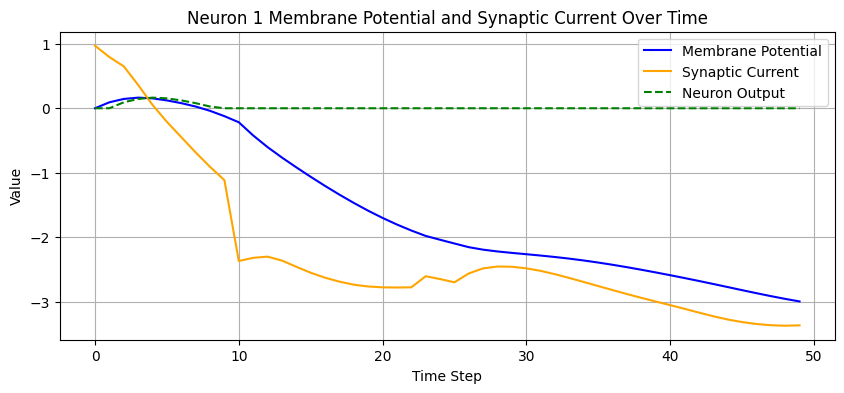

Neuron 2 is non-spiking.
Gamma value: 0.0


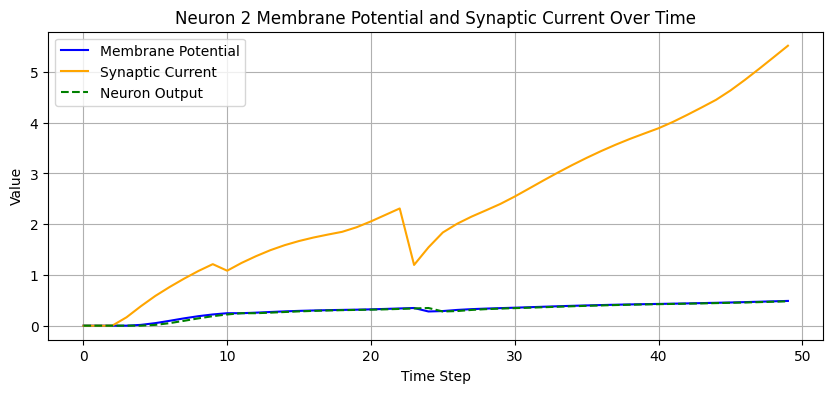

Neuron 3 is non-spiking.
Gamma value: 0.0


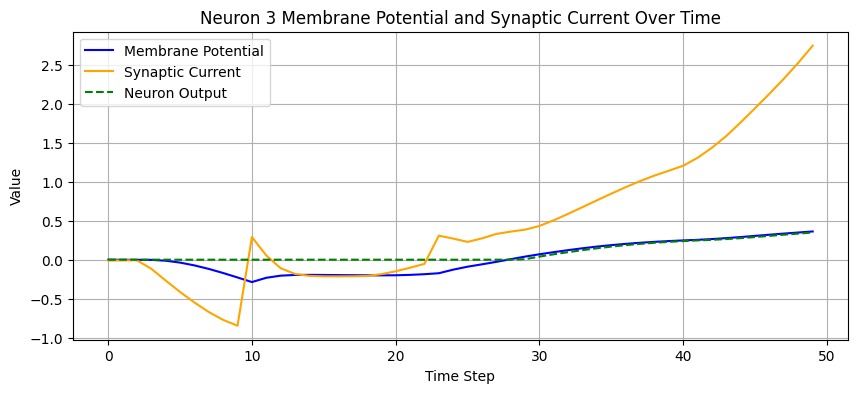

Neuron 4 is non-spiking.
Gamma value: 0.0


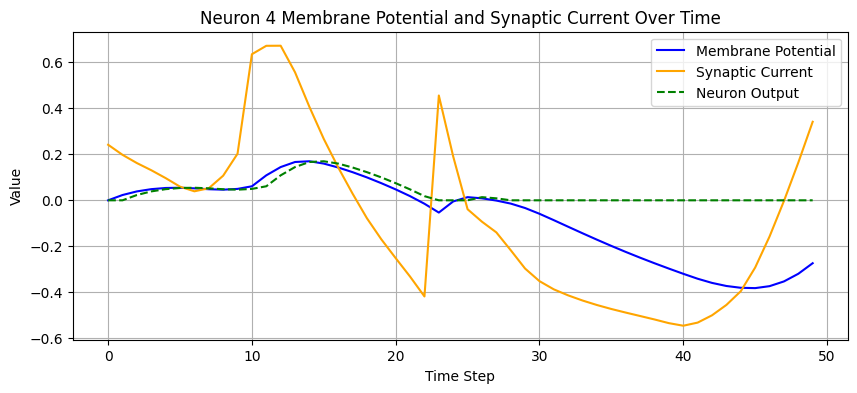

Neuron 5 is non-spiking.
Gamma value: 0.0


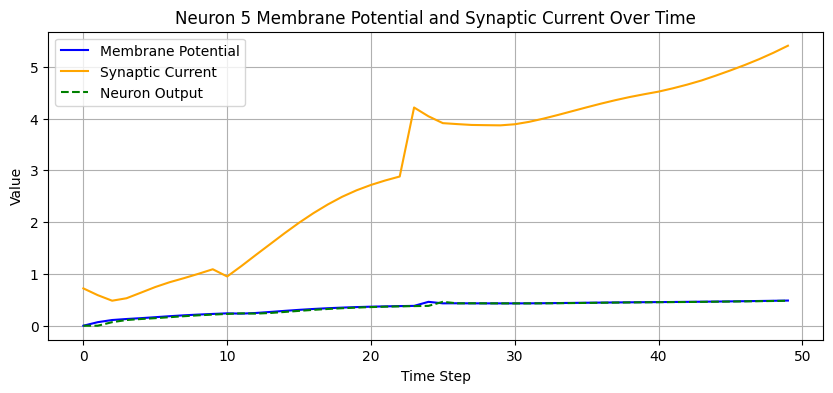

Neuron 6 is non-spiking.
Gamma value: 0.0


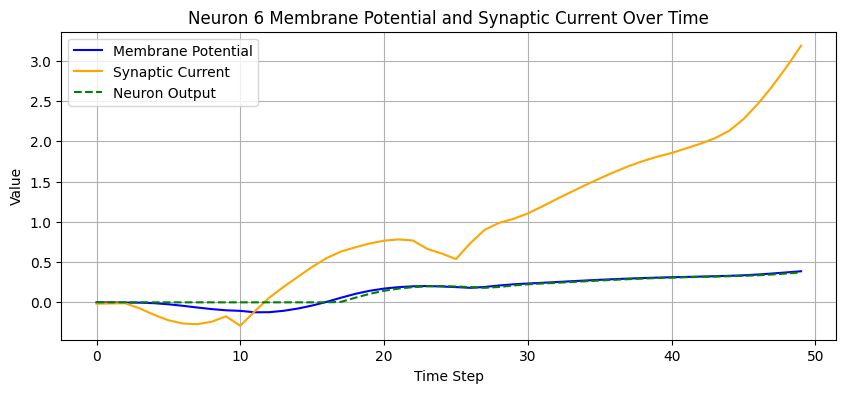

Neuron 7 is non-spiking.
Gamma value: 0.0


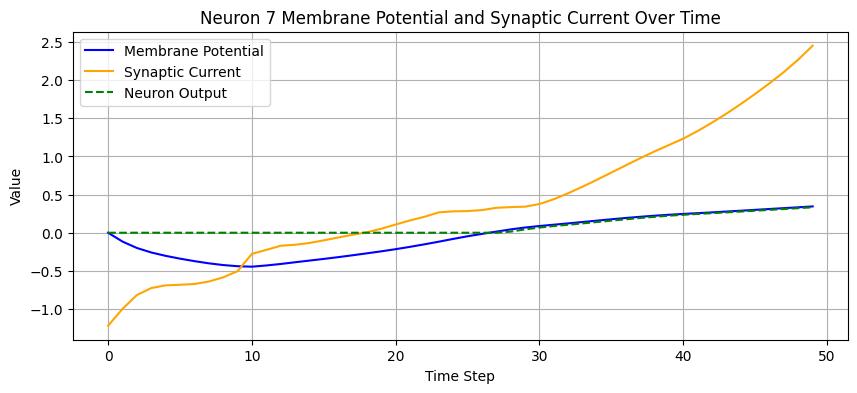

Neuron 8 is non-spiking.
Gamma value: 0.0


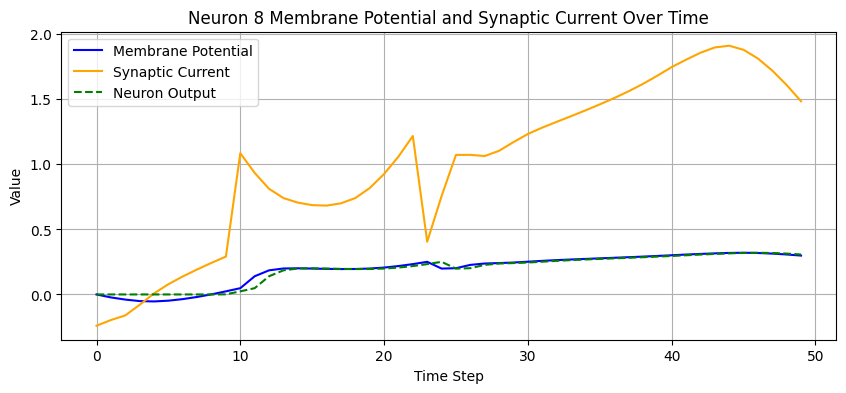

Neuron 9 is non-spiking.
Gamma value: 0.0


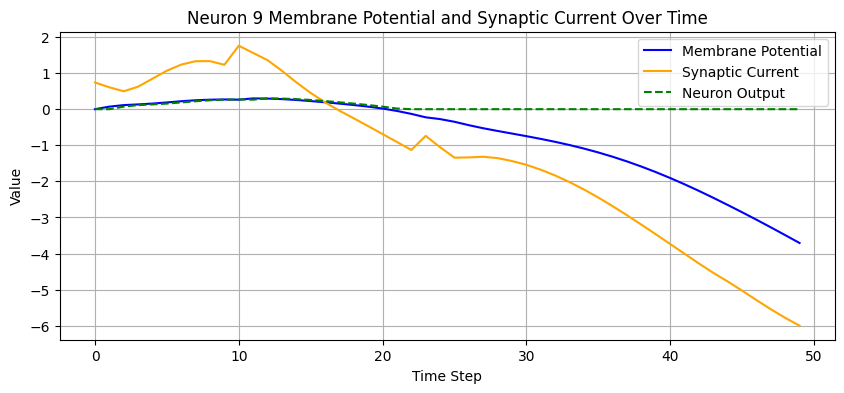

Neuron 10 is non-spiking.
Gamma value: 0.0


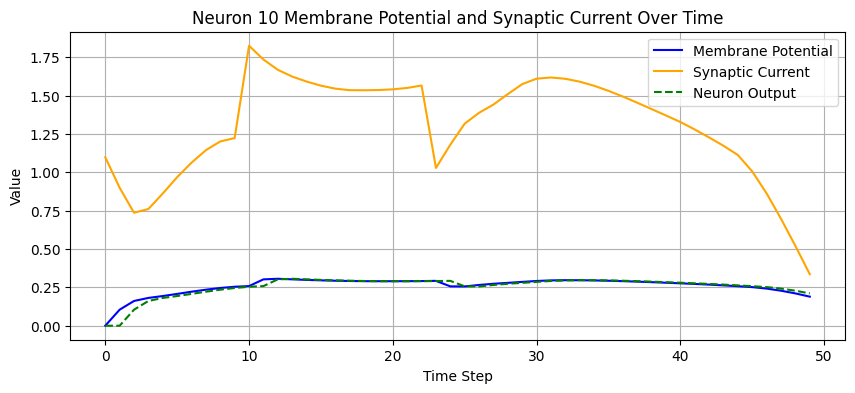

Neuron 11 is non-spiking.
Gamma value: 0.0


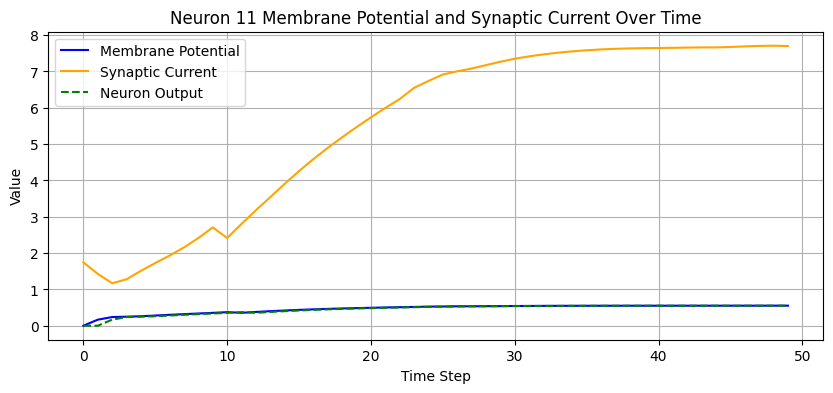

Neuron 12 is non-spiking.
Gamma value: 0.0


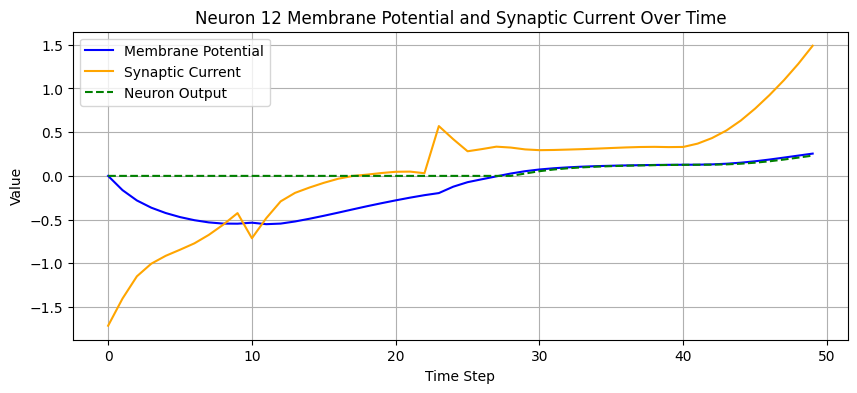

Neuron 13 is non-spiking.
Gamma value: 0.0


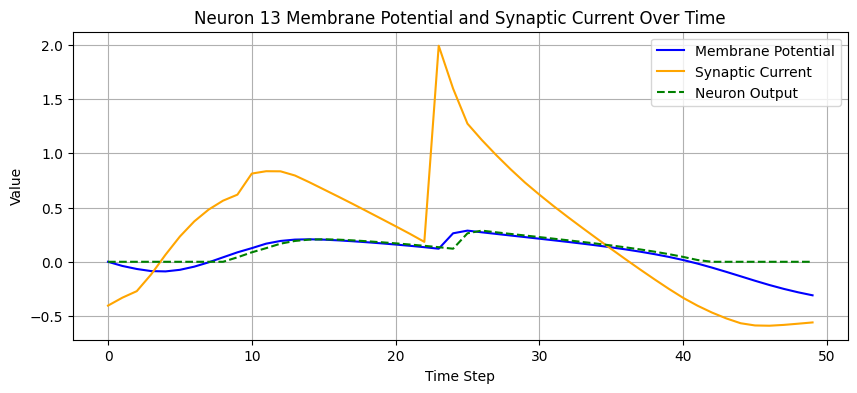

Neuron 14 is non-spiking.
Gamma value: 0.0


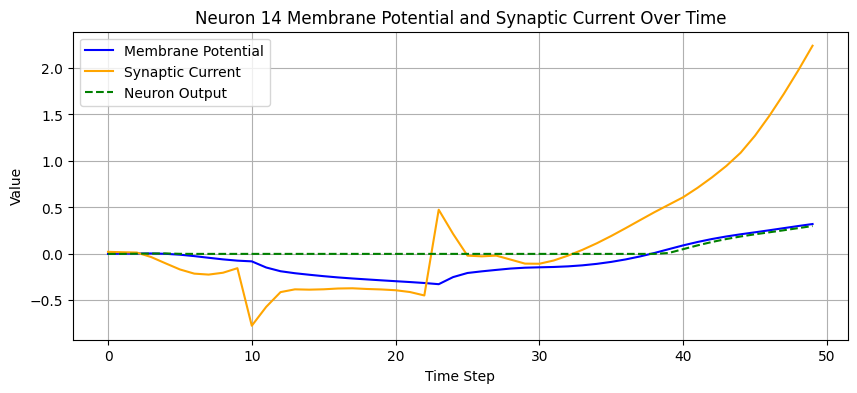

Neuron 15 is non-spiking.
Gamma value: 0.0


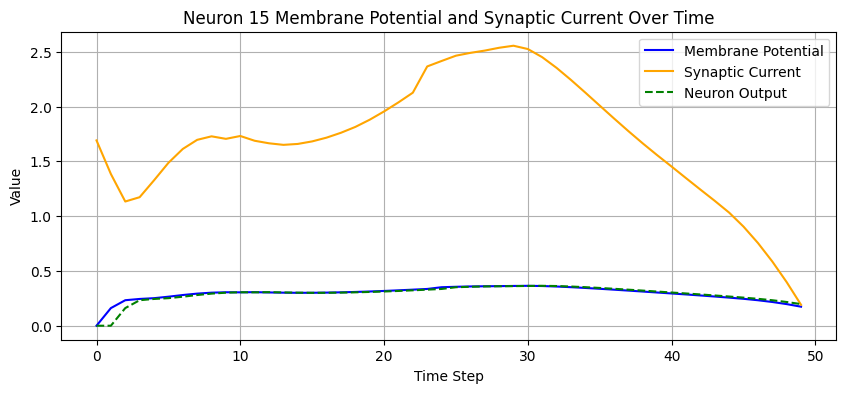

Neuron 16 is non-spiking.
Gamma value: 0.0


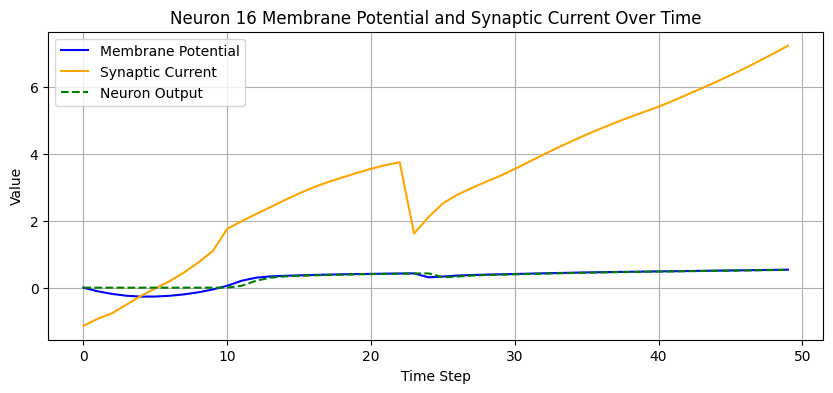

Neuron 17 is non-spiking.
Gamma value: 0.0


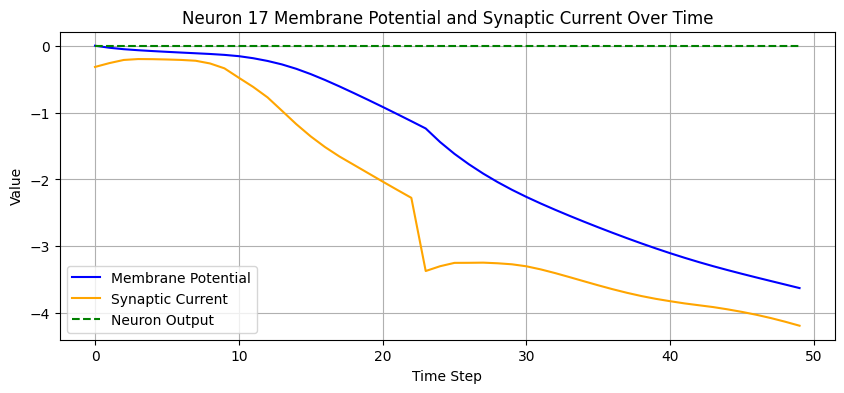

Neuron 18 is non-spiking.
Gamma value: 0.0


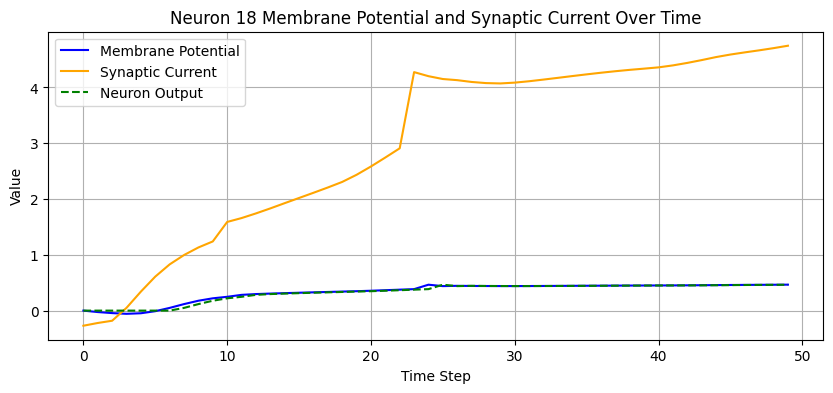

Neuron 19 is non-spiking.
Gamma value: 0.0


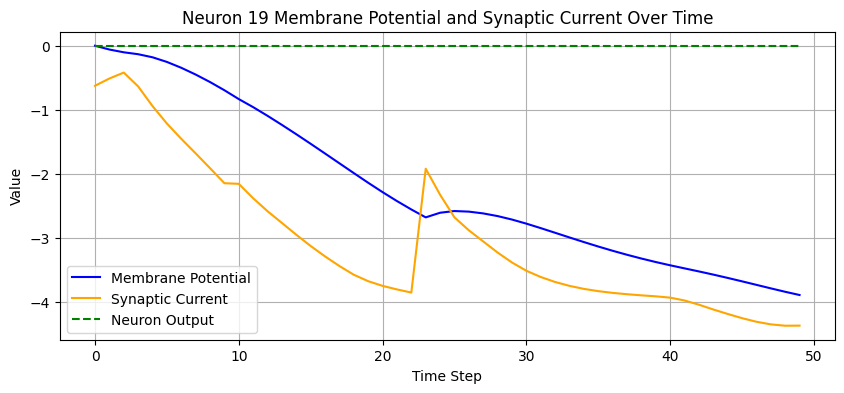

In [51]:
for seed in range(1,6):
    print(f"Seed: {seed}")
    if data == "randman":
        if reset_nsn == False:
            path = f"/vast/nar8991/snn/training_results/randman/1_d/2_classes/3/cross_entropy/Hybrid_NSN_SNN_V1_Flexible_Spiking/recurrent_True/seed_{seed}/tpe_sampler/20_hidden/1.0_pct_data/None_percent_snn/{gamma_init_type}_gamma_init/gamma_fixed_{gamma_fixed}/reset_nsn_{reset_nsn}/best_model_of_study.ckpt"
        else:
            path = f"/vast/nar8991/snn/training_results/randman/1_d/2_classes/3/cross_entropy/Hybrid_NSN_SNN_V1_Flexible_Spiking/recurrent_True/seed_{seed}/tpe_sampler/20_hidden/1.0_pct_data/None_percent_snn/{gamma_init_type}_gamma_init/gamma_fixed_{gamma_fixed}/best_model_of_study.ckpt"
    else:
        path = f"/vast/nar8991/snn/training_results/shd/None_d/20_classes/700/cross_entropy/Hybrid_NSN_SNN_V1_Flexible_Spiking/recurrent_True/seed_{seed}/tpe_sampler/256_hidden/1.0_pct_data/None_percent_snn/{gamma_init_type}_gamma_init/gamma_fixed_{gamma_fixed}/reset_nsn_{reset_nsn}/best_model_of_study.ckpt"
    model = load_model("Hybrid_NSN_SNN_V1_Flexible_Spiking", path)
    weights = return_weights(model)
    gamma_param = weights["gamma_param"]
    auxiliary_outputs, hidden_out_t = get_membrane_potentials(model, test_loader)
    membrane_potentials = auxiliary_outputs['membrane_potentials']
    synaptic_currents = auxiliary_outputs['synaptic_currents']
    graph_membrane_potentials_and_synaptic_currents(membrane_potentials.cpu().detach().numpy(), synaptic_currents.cpu().detach().numpy(), example_idx=0)
    neuron_idx = 0
    for neuron_idx in range(membrane_potentials.shape[2]):
        if gamma_param[neuron_idx] > 0.5:
            print(f"Neuron {neuron_idx} is spiking.")
        else:
            print(f"Neuron {neuron_idx} is non-spiking.")
        print(f"Gamma value: {gamma_param[neuron_idx].item()}")
        single_mem_and_syn_potential(membrane_potentials.cpu().detach().numpy(), synaptic_currents.cpu().detach().numpy(), hidden_out_t.cpu().detach().numpy(), neuron_idx, example_idx=0)
    # Identify if the neuron is spiking or nonspiking using gamma


Seed: 1


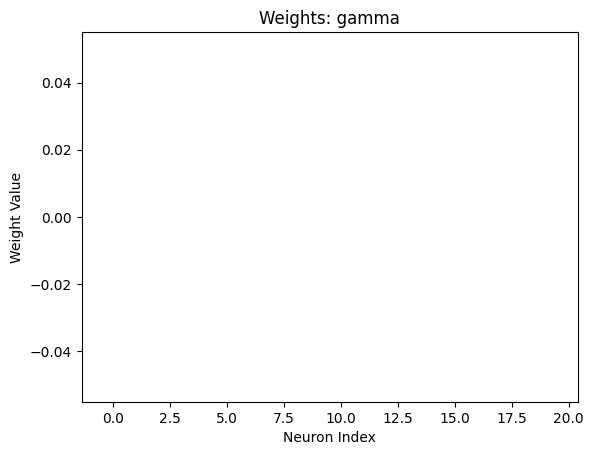

Testing: 100%|██████████| 1/1 [00:00<00:00, 27.62it/s]

Accuracy before binarizing gamma: 0.3375000059604645


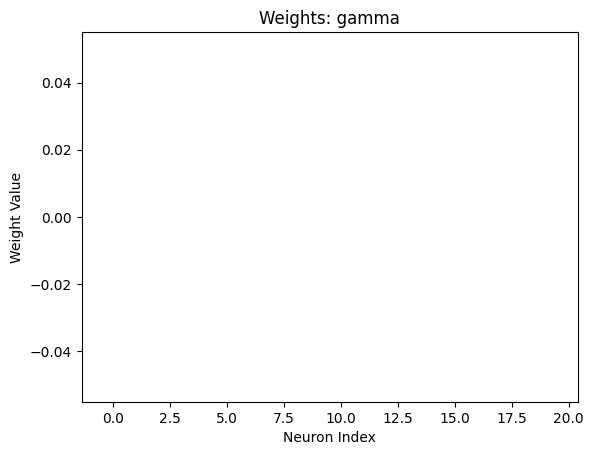

Testing: 100%|██████████| 1/1 [00:00<00:00, 31.41it/s]


Accuracy after binarizing gamma: 0.3375000059604645


Testing:   0%|          | 0/1 [00:00<?, ?it/s]


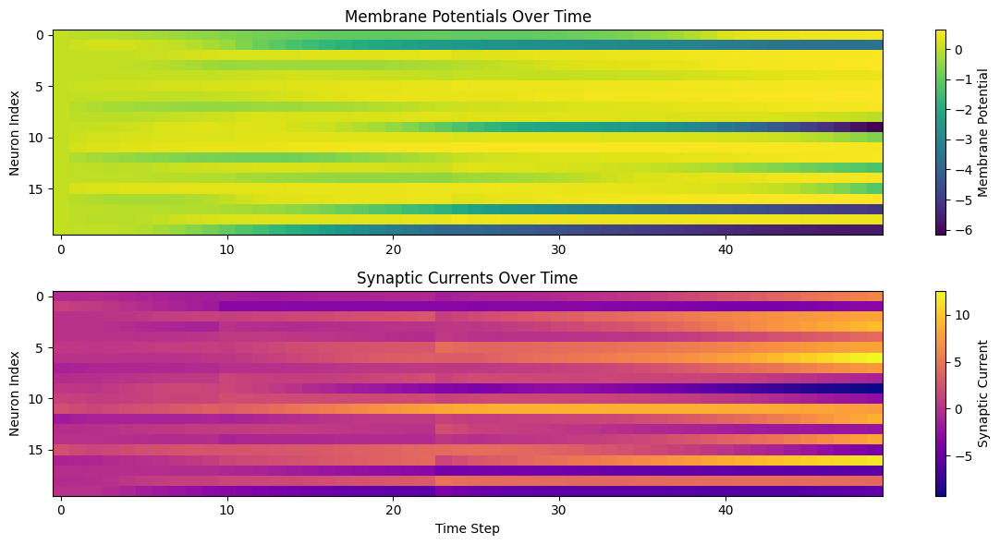

Neuron 0 is non-spiking.
Gamma value: 0.0


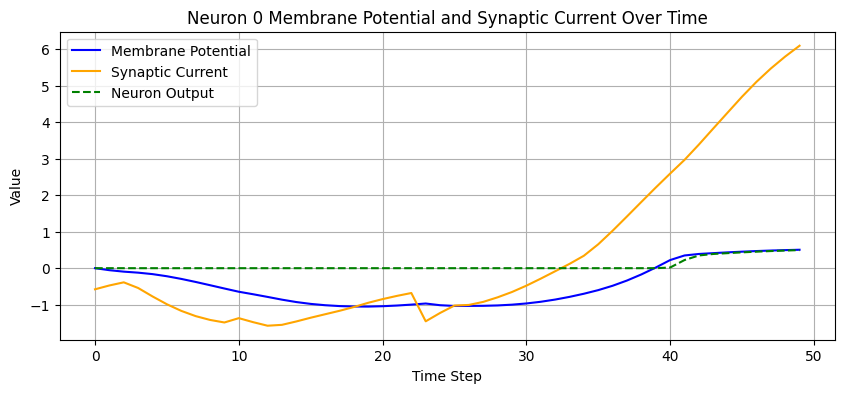

Neuron 1 is non-spiking.
Gamma value: 0.0


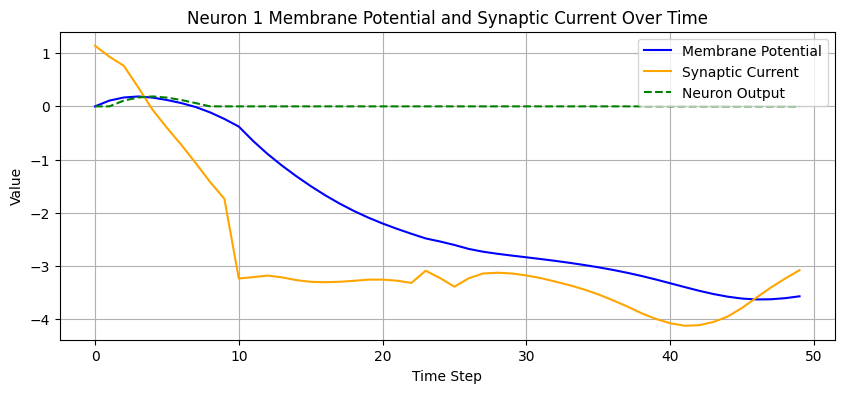

Neuron 2 is non-spiking.
Gamma value: 0.0


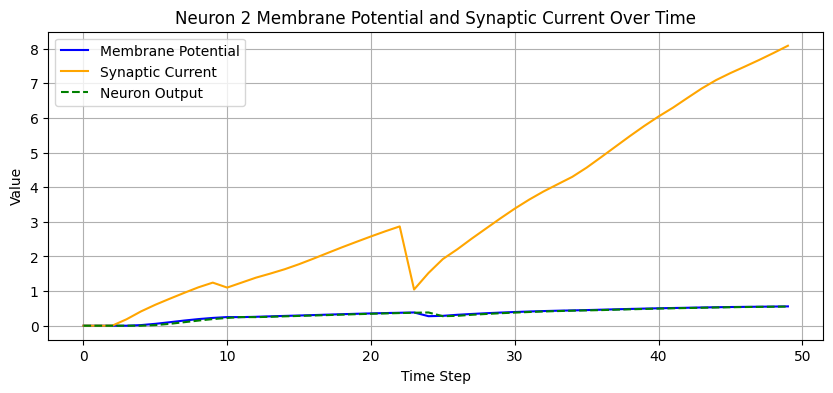

Neuron 3 is non-spiking.
Gamma value: 0.0


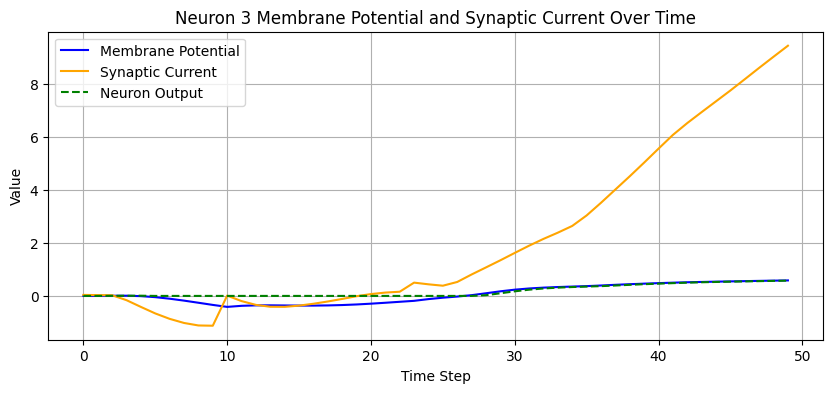

Neuron 4 is non-spiking.
Gamma value: 0.0


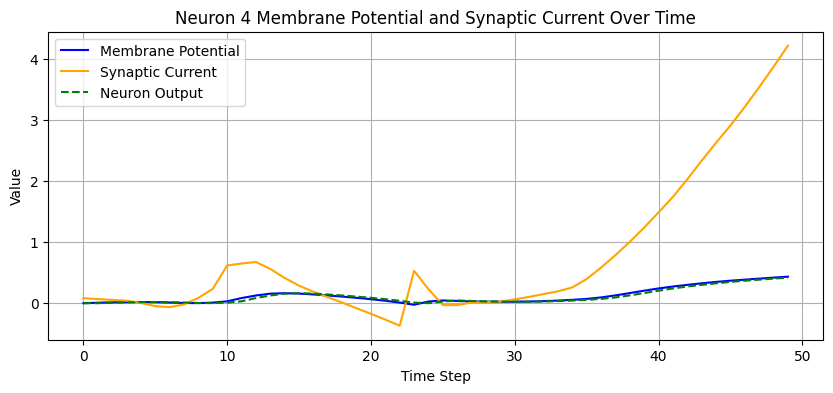

Neuron 5 is non-spiking.
Gamma value: 0.0


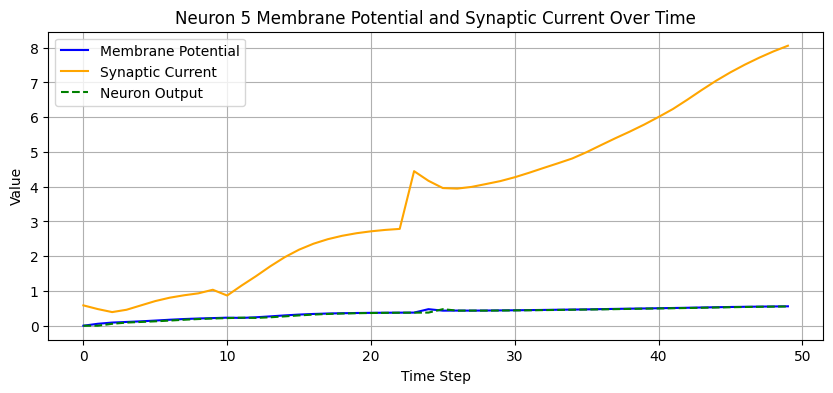

Neuron 6 is non-spiking.
Gamma value: 0.0


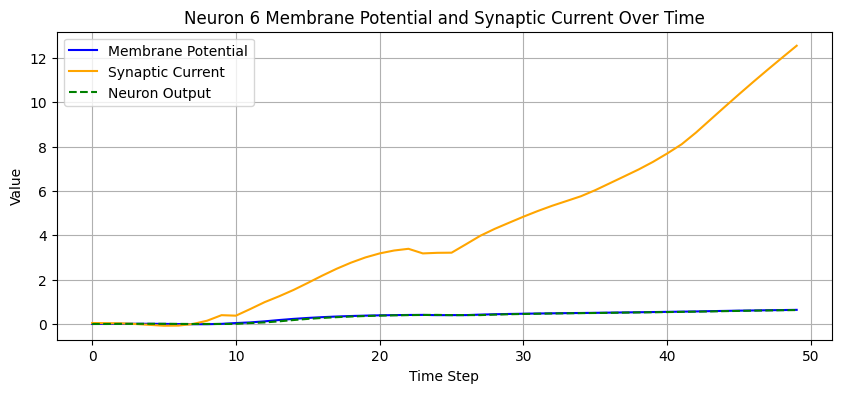

Neuron 7 is non-spiking.
Gamma value: 0.0


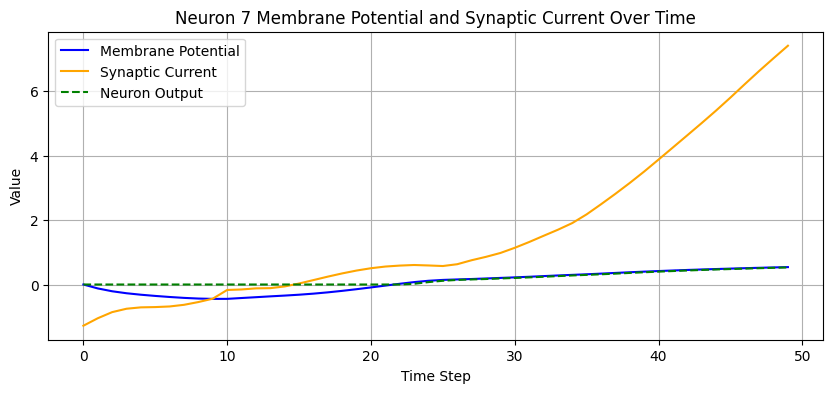

Neuron 8 is non-spiking.
Gamma value: 0.0


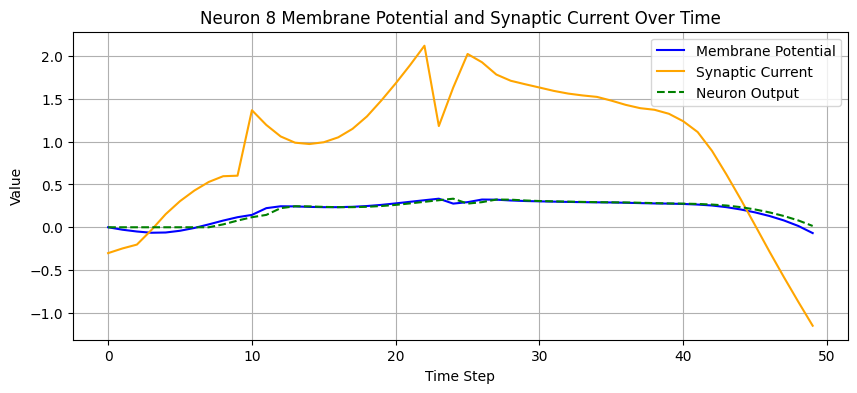

Neuron 9 is non-spiking.
Gamma value: 0.0


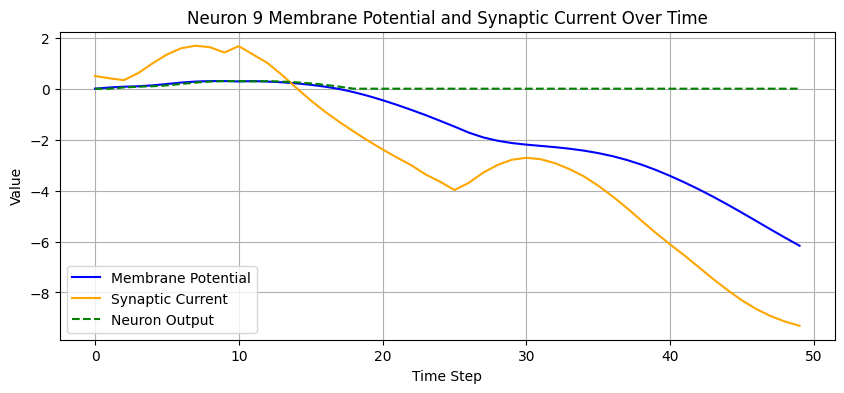

Neuron 10 is non-spiking.
Gamma value: 0.0


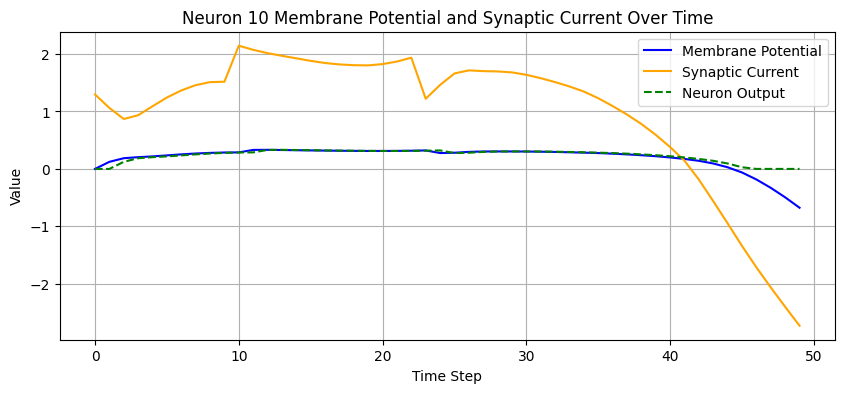

Neuron 11 is non-spiking.
Gamma value: 0.0


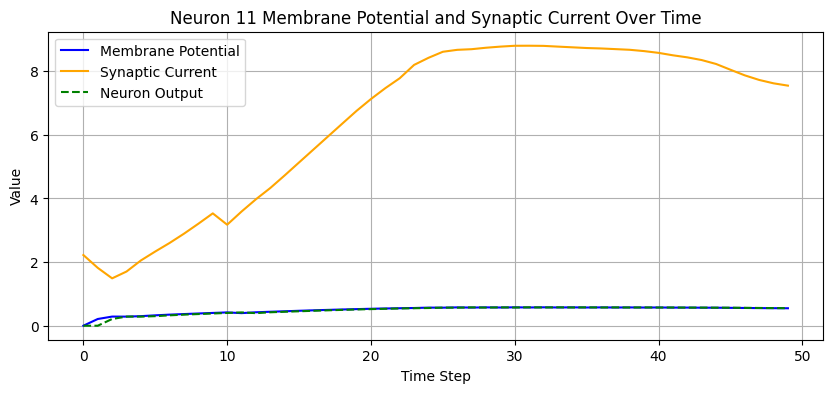

Neuron 12 is non-spiking.
Gamma value: 0.0


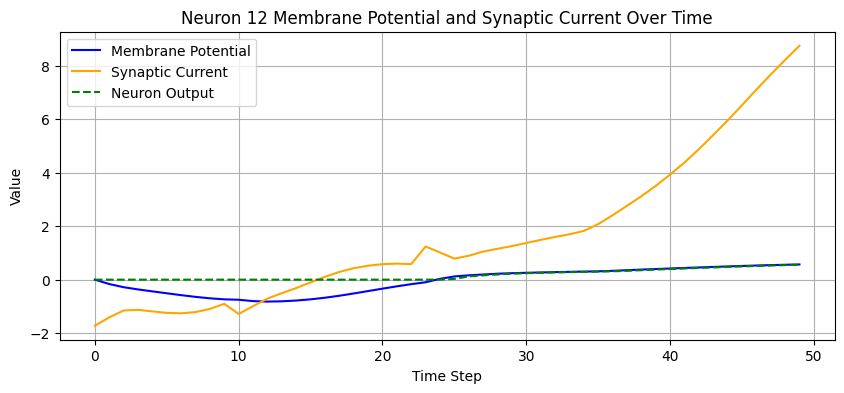

Neuron 13 is non-spiking.
Gamma value: 0.0


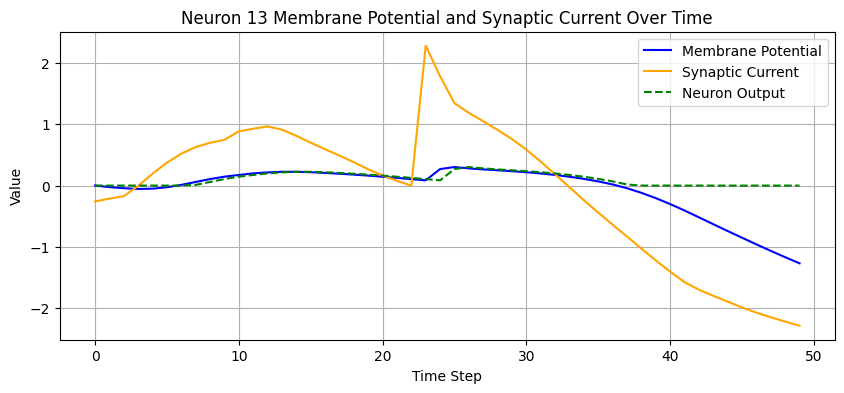

Neuron 14 is non-spiking.
Gamma value: 0.0


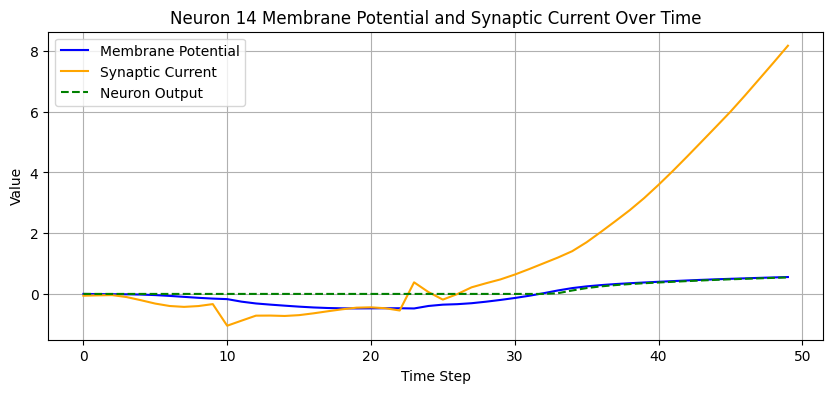

Neuron 15 is non-spiking.
Gamma value: 0.0


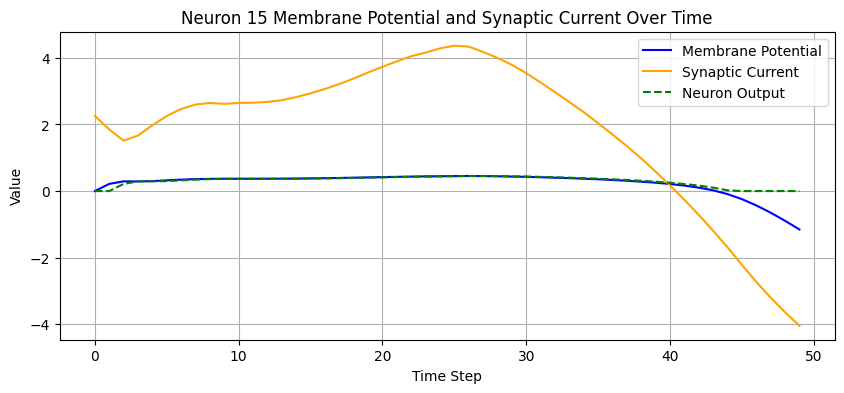

Neuron 16 is non-spiking.
Gamma value: 0.0


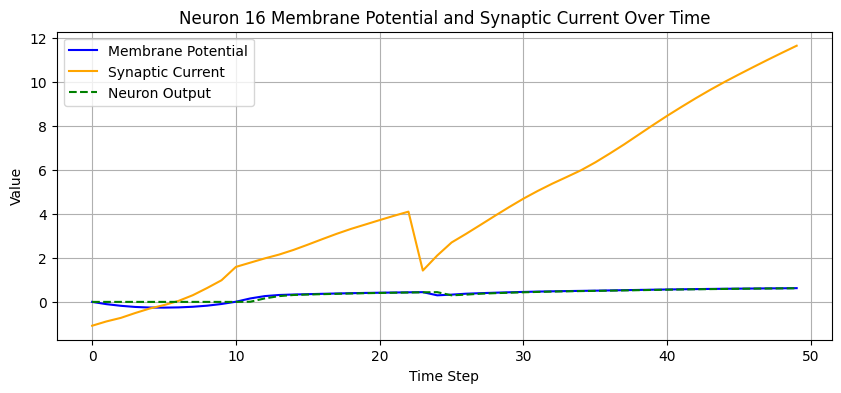

Neuron 17 is non-spiking.
Gamma value: 0.0


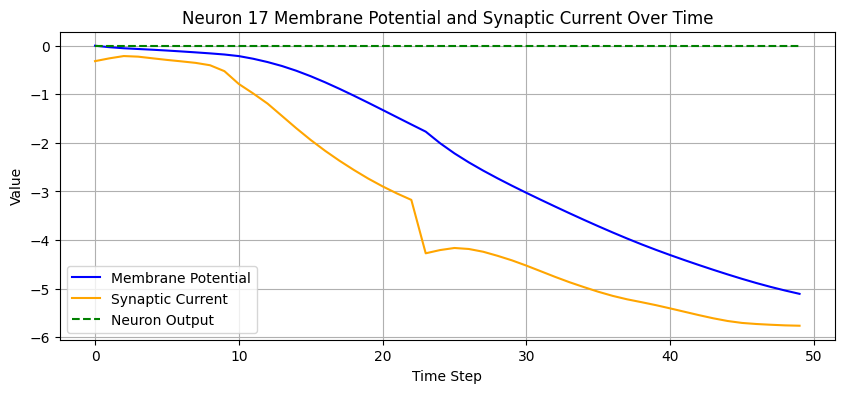

Neuron 18 is non-spiking.
Gamma value: 0.0


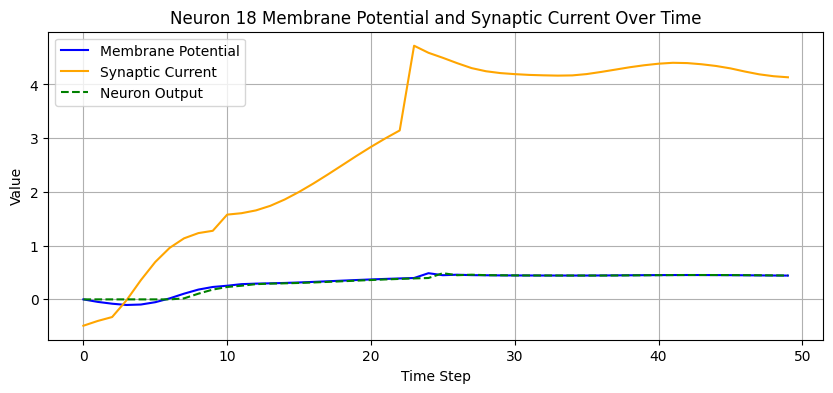

Neuron 19 is non-spiking.
Gamma value: 0.0


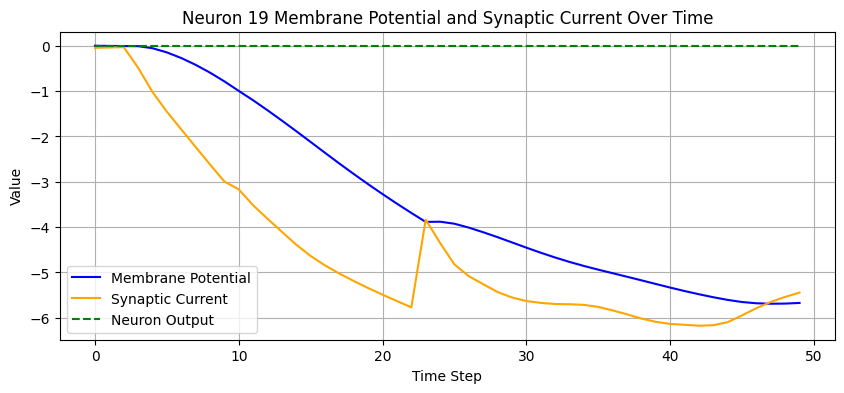

Seed: 2


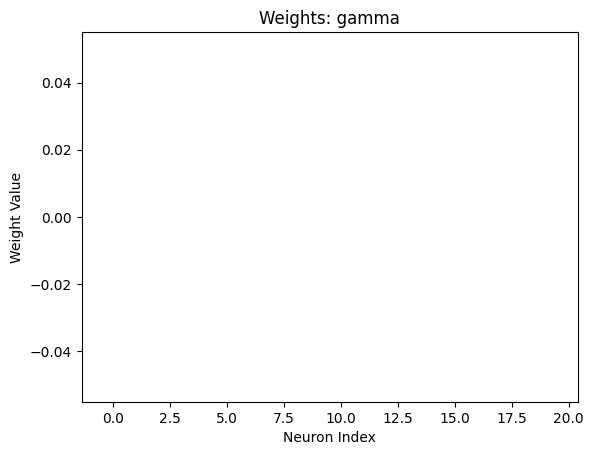

Testing: 100%|██████████| 1/1 [00:00<00:00, 31.02it/s]

Accuracy before binarizing gamma: 0.32249999046325684


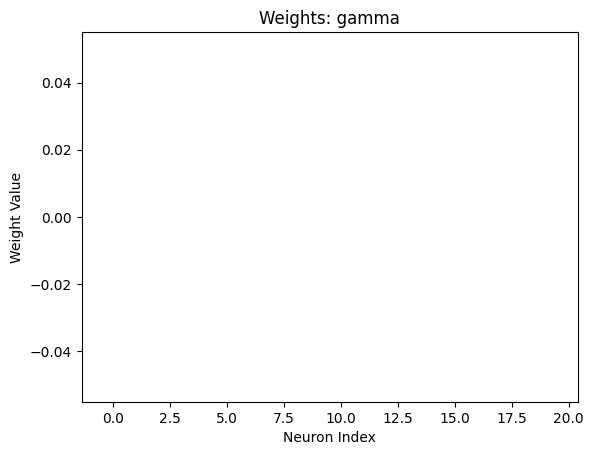

Testing: 100%|██████████| 1/1 [00:00<00:00, 30.84it/s]


Accuracy after binarizing gamma: 0.32249999046325684


Testing:   0%|          | 0/1 [00:00<?, ?it/s]


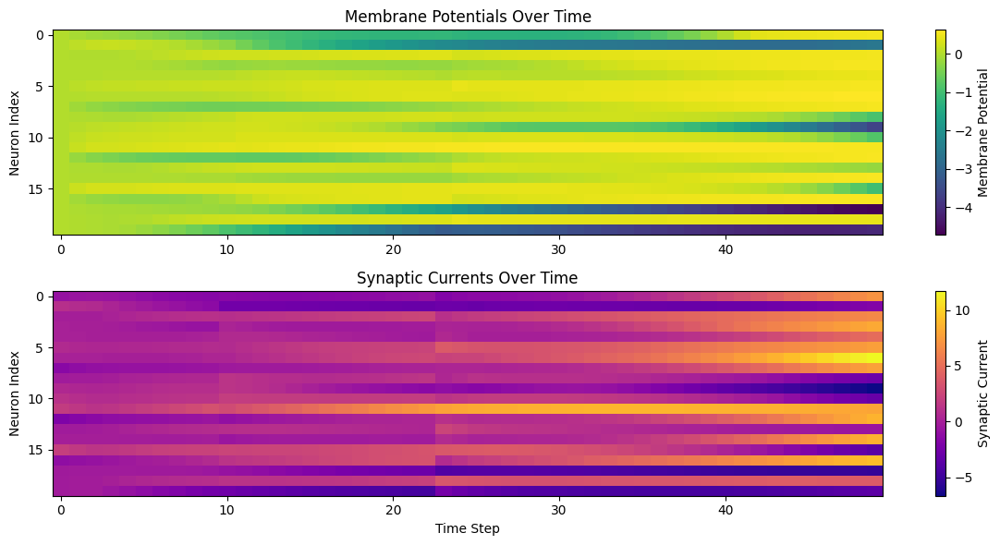

Neuron 0 is non-spiking.
Gamma value: 0.0


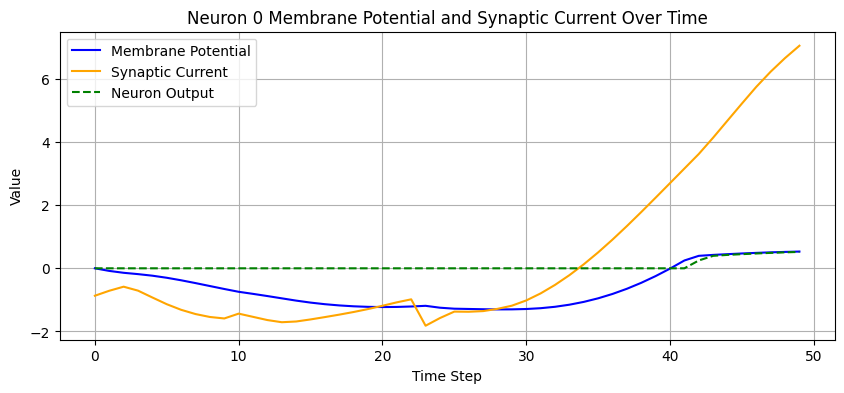

Neuron 1 is non-spiking.
Gamma value: 0.0


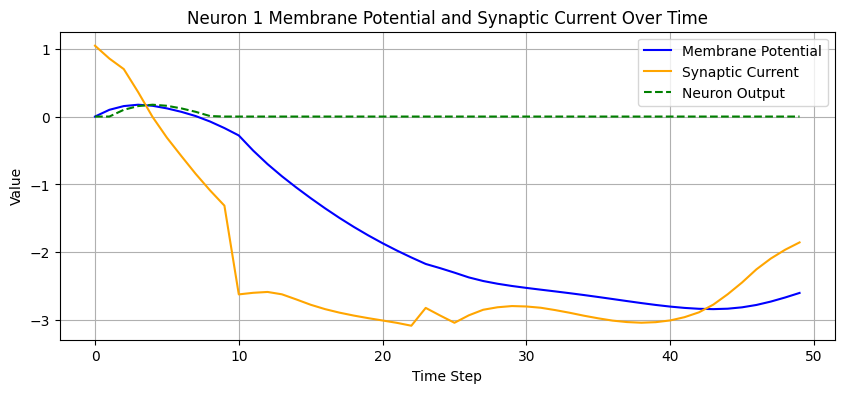

Neuron 2 is non-spiking.
Gamma value: 0.0


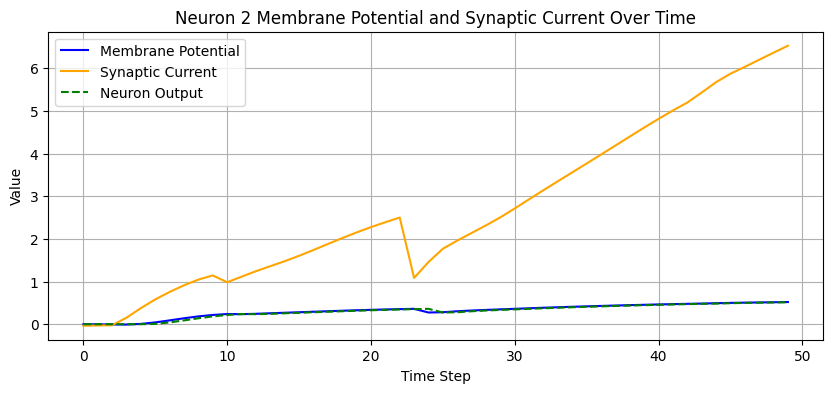

Neuron 3 is non-spiking.
Gamma value: 0.0


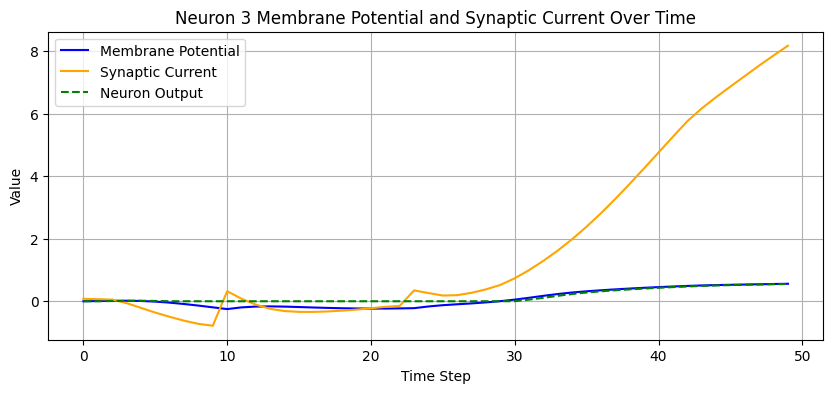

Neuron 4 is non-spiking.
Gamma value: 0.0


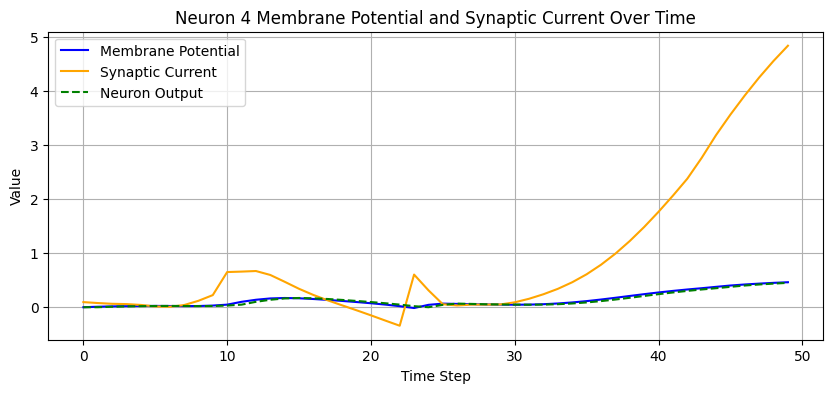

Neuron 5 is non-spiking.
Gamma value: 0.0


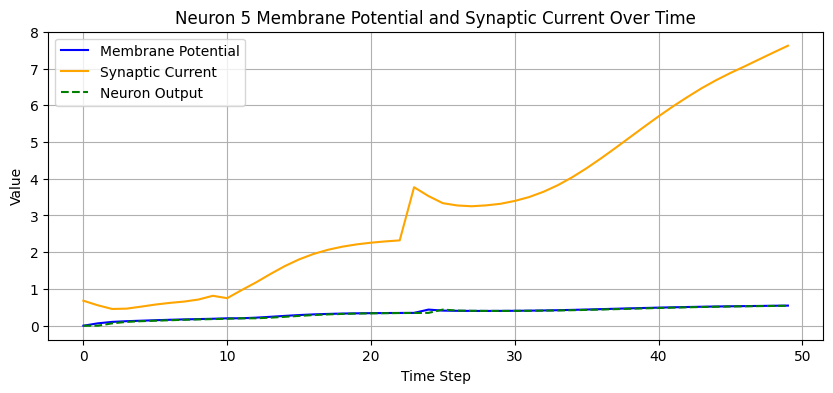

Neuron 6 is non-spiking.
Gamma value: 0.0


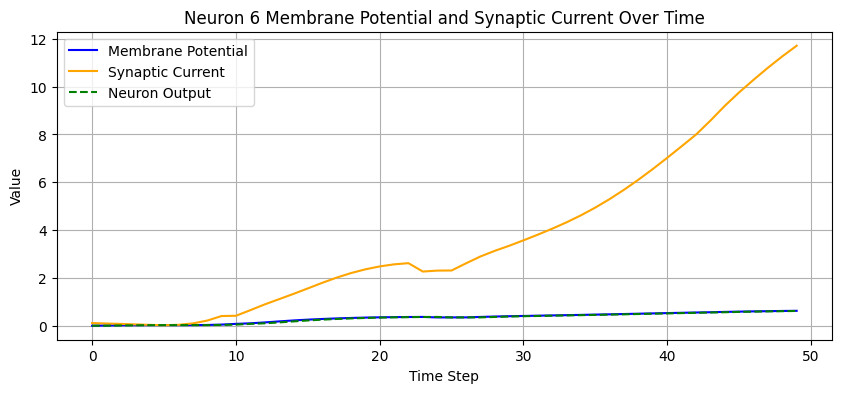

Neuron 7 is non-spiking.
Gamma value: 0.0


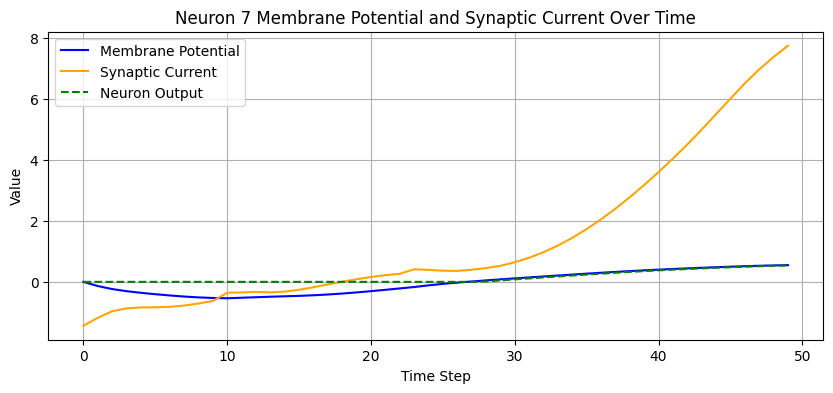

Neuron 8 is non-spiking.
Gamma value: 0.0


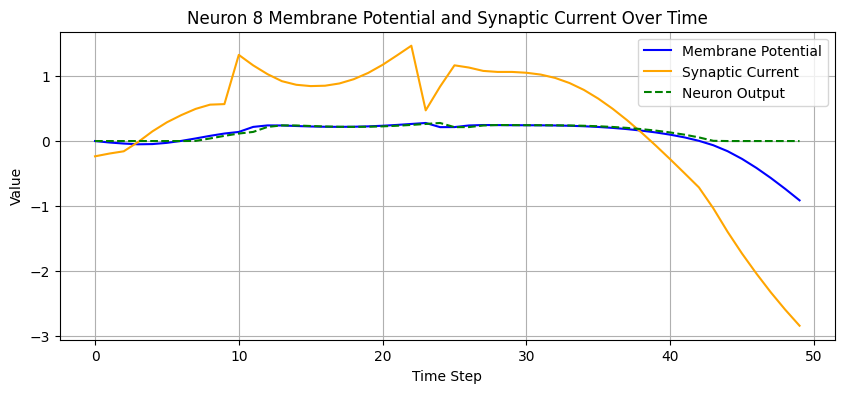

Neuron 9 is non-spiking.
Gamma value: 0.0


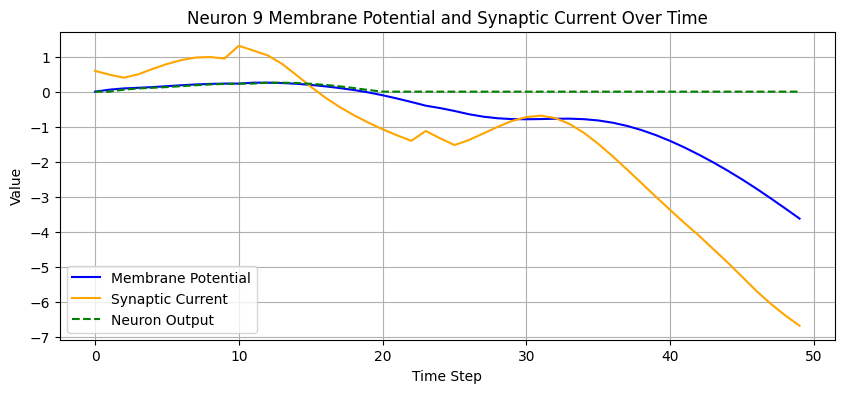

Neuron 10 is non-spiking.
Gamma value: 0.0


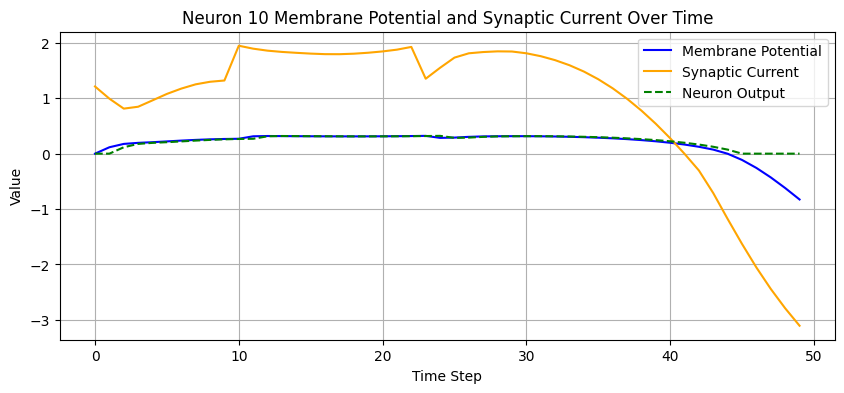

Neuron 11 is non-spiking.
Gamma value: 0.0


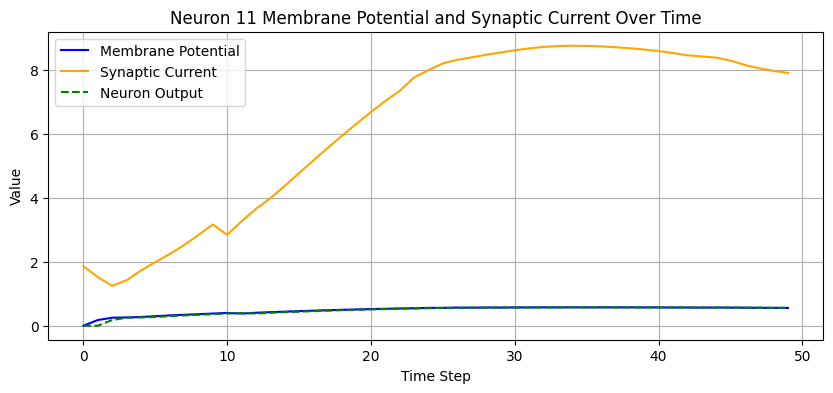

Neuron 12 is non-spiking.
Gamma value: 0.0


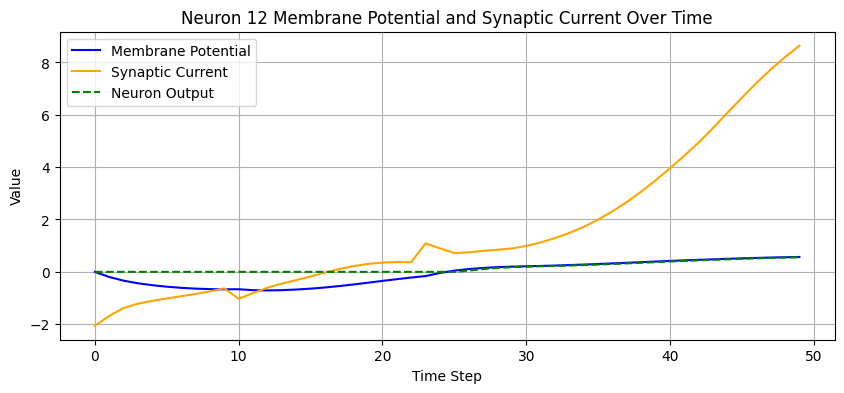

Neuron 13 is non-spiking.
Gamma value: 0.0


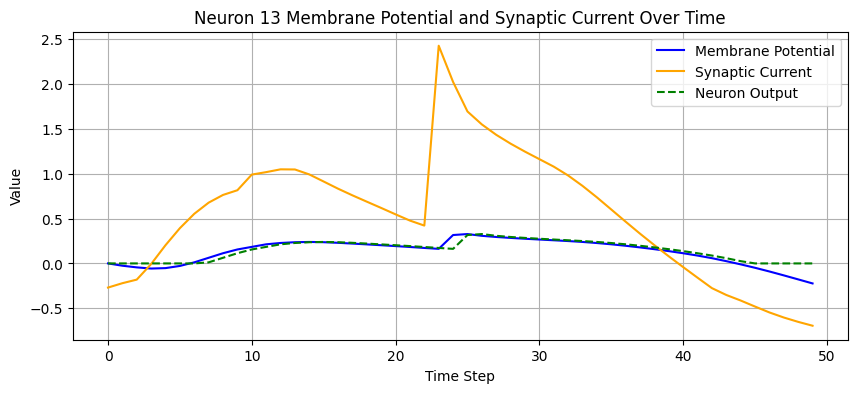

Neuron 14 is non-spiking.
Gamma value: 0.0


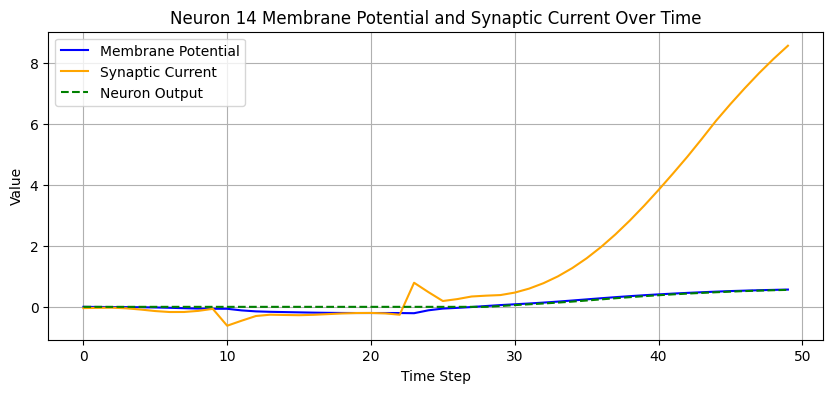

Neuron 15 is non-spiking.
Gamma value: 0.0


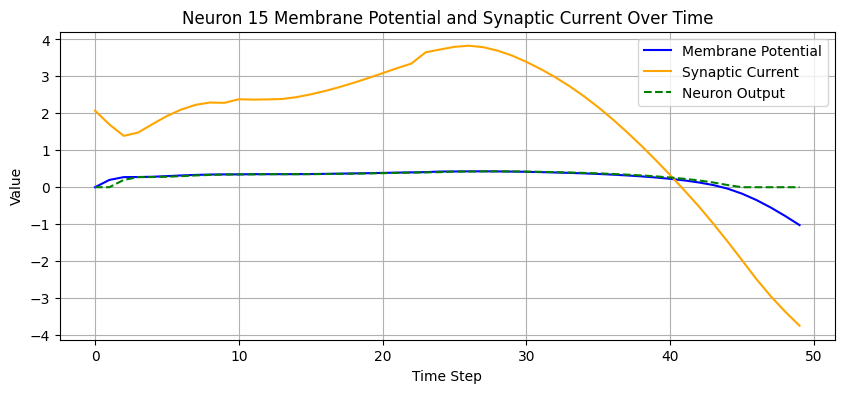

Neuron 16 is non-spiking.
Gamma value: 0.0


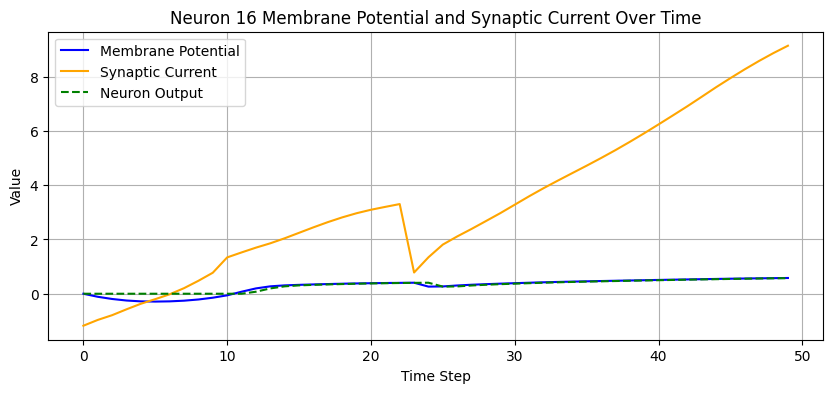

Neuron 17 is non-spiking.
Gamma value: 0.0


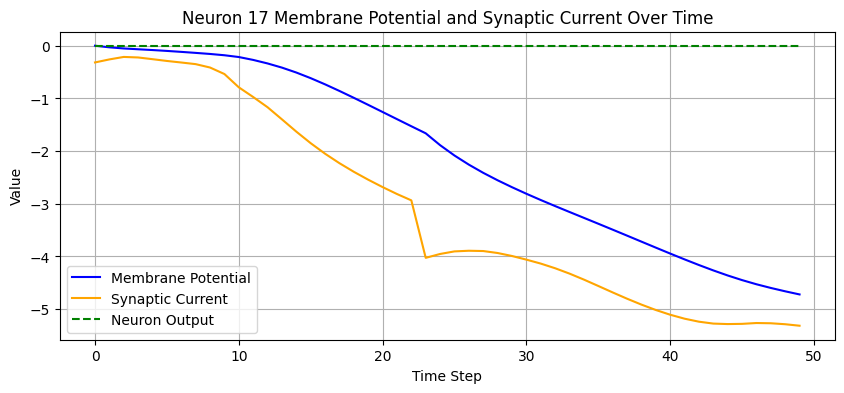

Neuron 18 is non-spiking.
Gamma value: 0.0


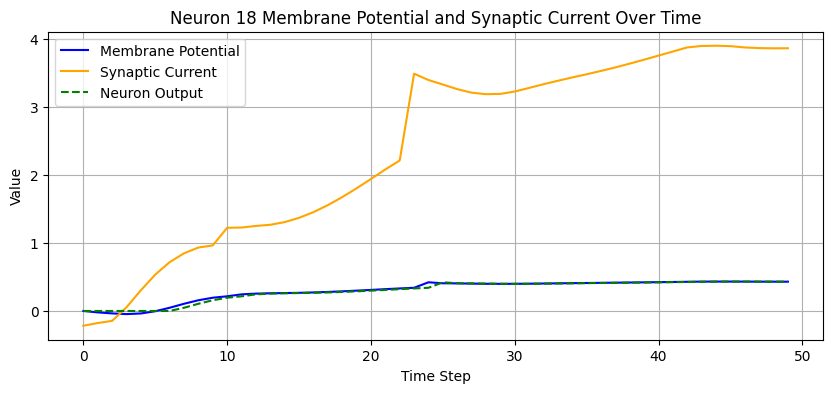

Neuron 19 is non-spiking.
Gamma value: 0.0


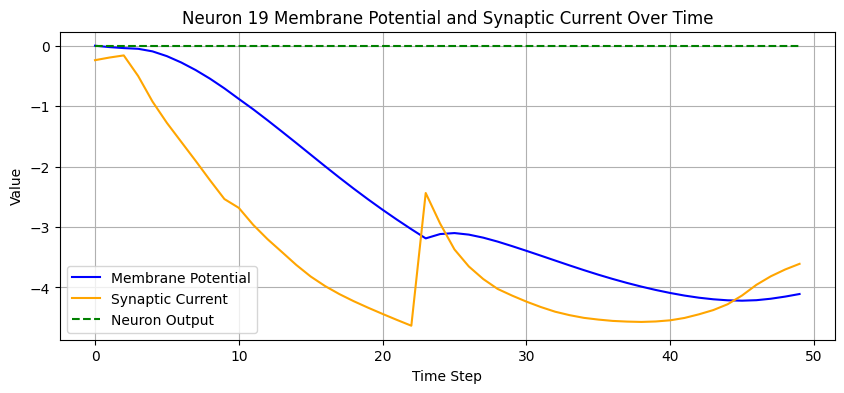

Seed: 3


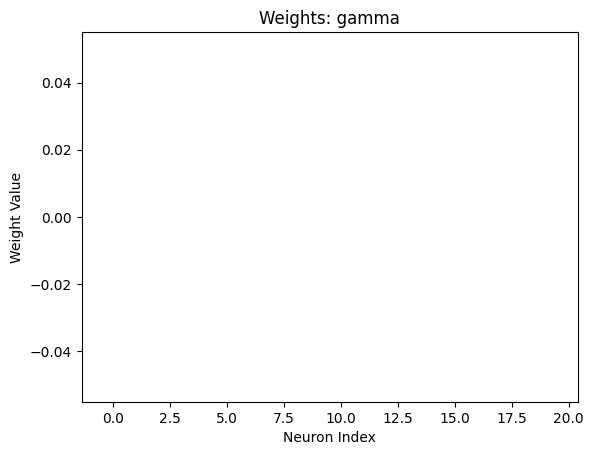

Testing: 100%|██████████| 1/1 [00:00<00:00, 29.43it/s]

Accuracy before binarizing gamma: 0.3449999988079071


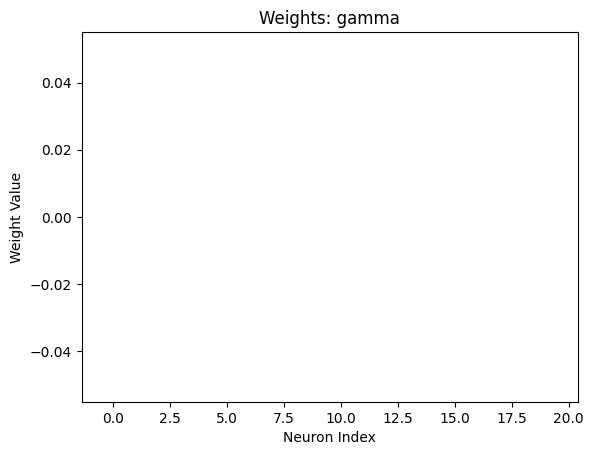

Testing: 100%|██████████| 1/1 [00:00<00:00, 31.95it/s]


Accuracy after binarizing gamma: 0.3449999988079071


Testing:   0%|          | 0/1 [00:00<?, ?it/s]


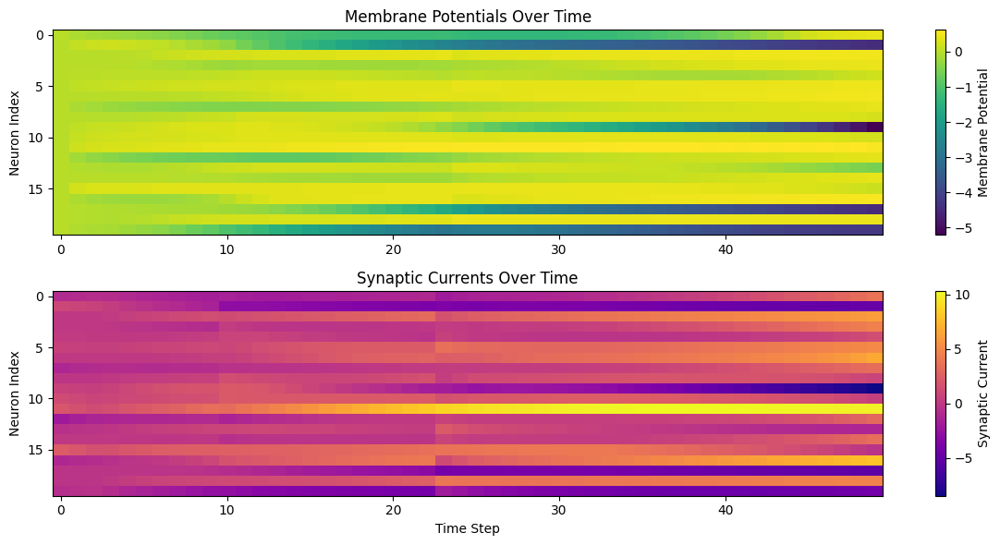

Neuron 0 is non-spiking.
Gamma value: 0.0


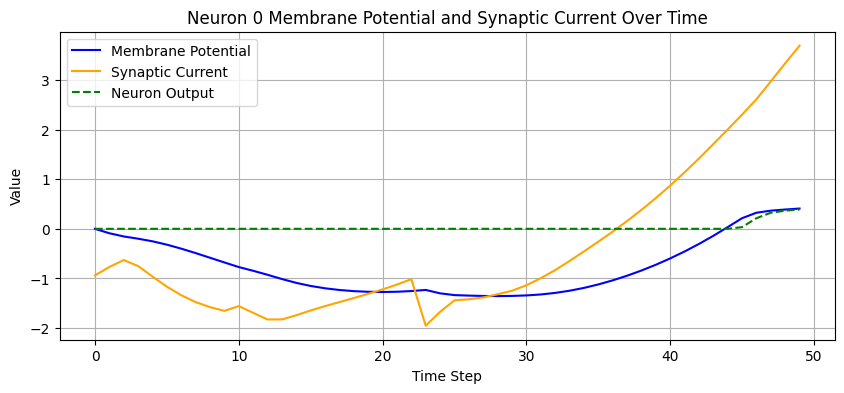

Neuron 1 is non-spiking.
Gamma value: 0.0


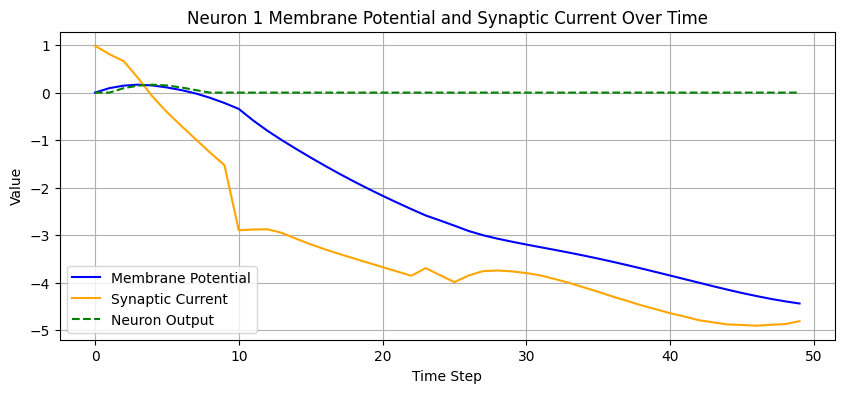

Neuron 2 is non-spiking.
Gamma value: 0.0


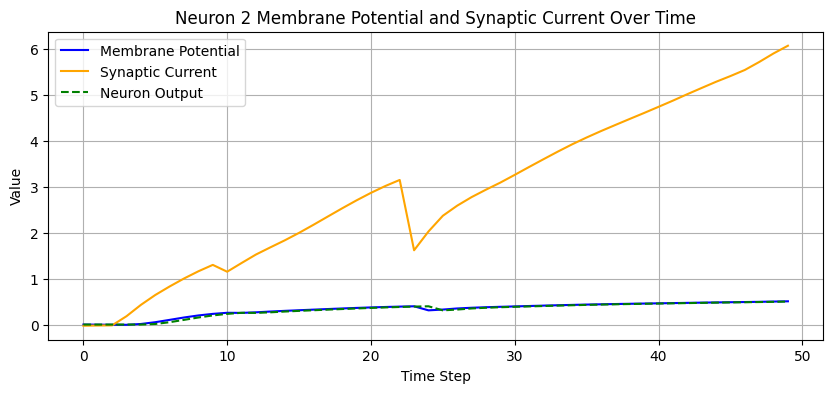

Neuron 3 is non-spiking.
Gamma value: 0.0


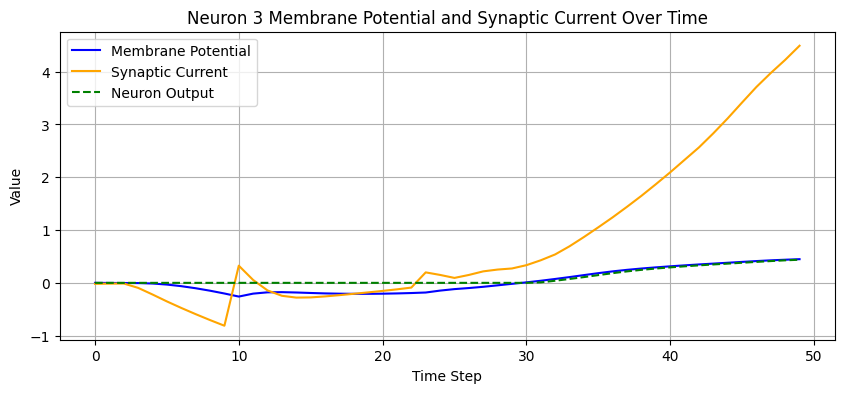

Neuron 4 is non-spiking.
Gamma value: 0.0


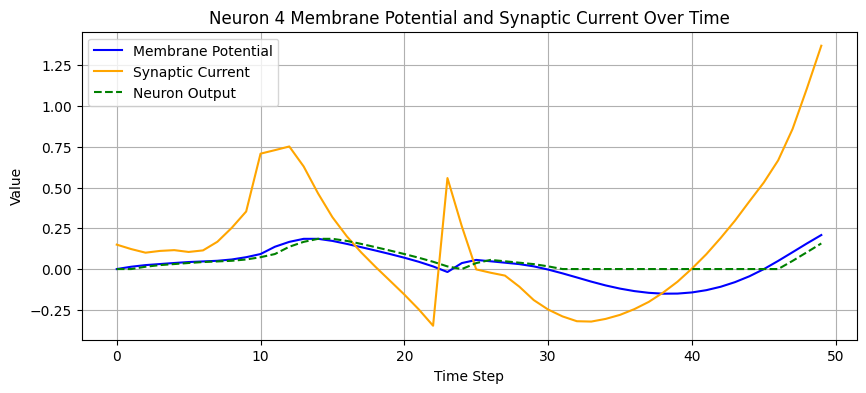

Neuron 5 is non-spiking.
Gamma value: 0.0


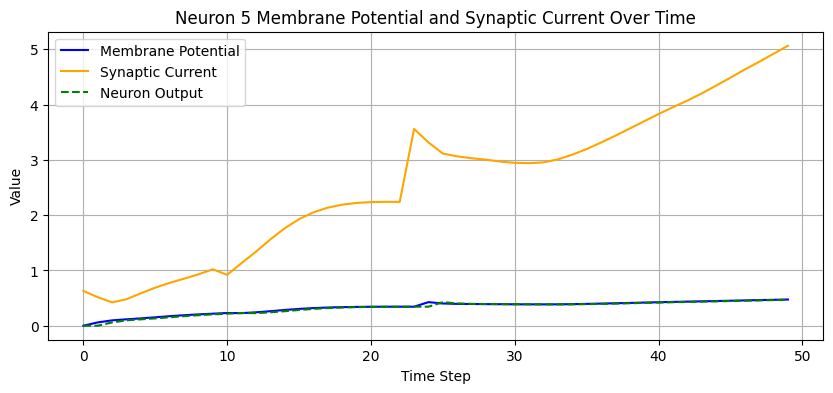

Neuron 6 is non-spiking.
Gamma value: 0.0


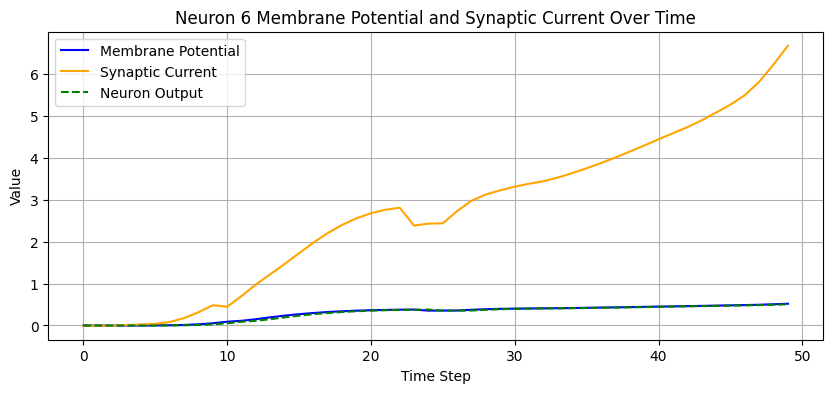

Neuron 7 is non-spiking.
Gamma value: 0.0


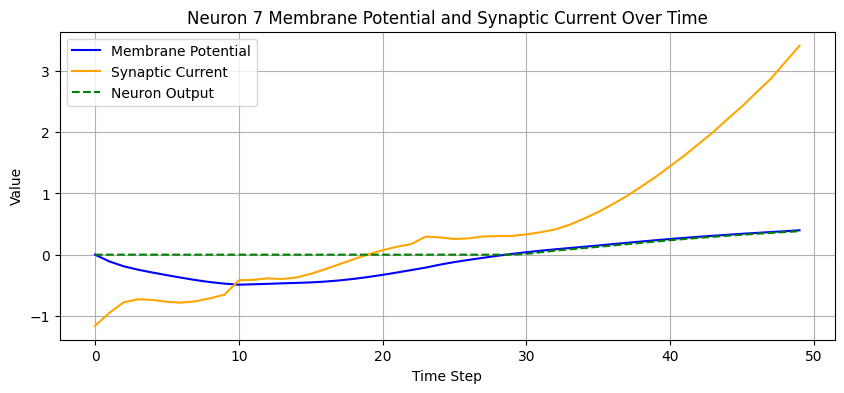

Neuron 8 is non-spiking.
Gamma value: 0.0


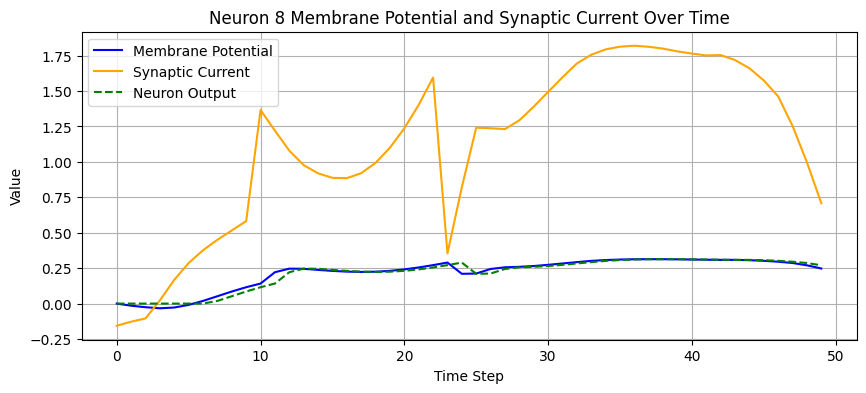

Neuron 9 is non-spiking.
Gamma value: 0.0


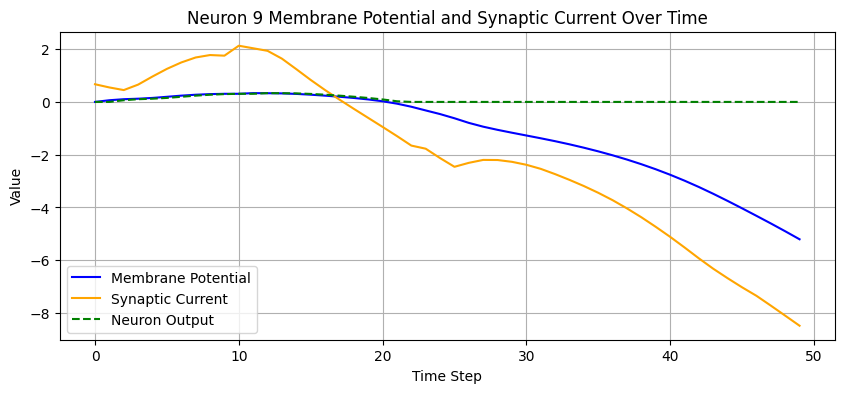

Neuron 10 is non-spiking.
Gamma value: 0.0


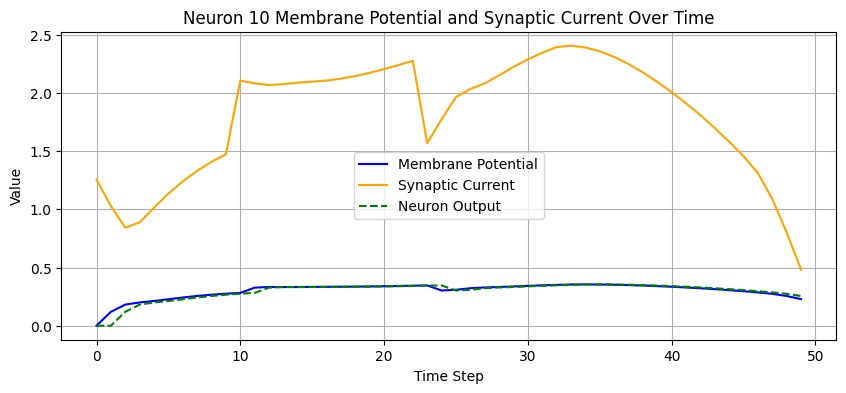

Neuron 11 is non-spiking.
Gamma value: 0.0


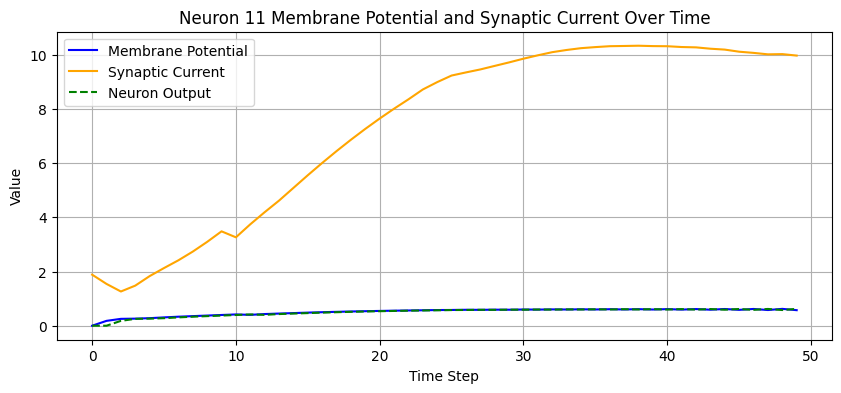

Neuron 12 is non-spiking.
Gamma value: 0.0


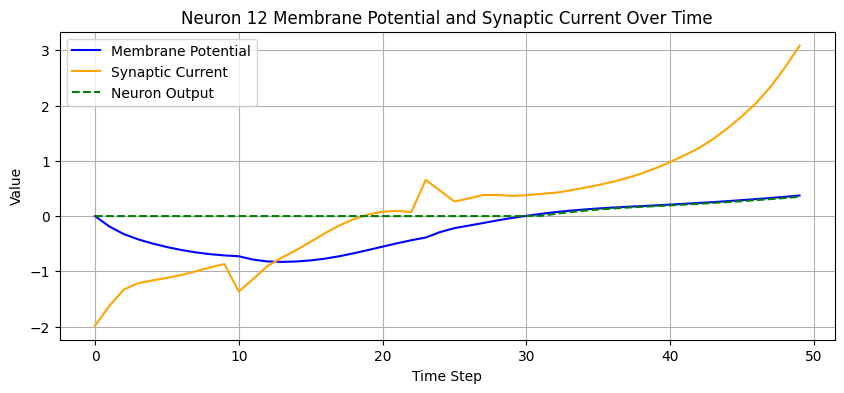

Neuron 13 is non-spiking.
Gamma value: 0.0


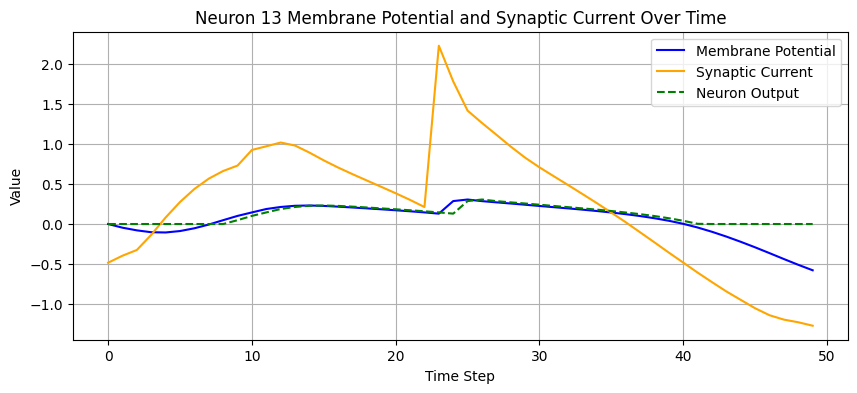

Neuron 14 is non-spiking.
Gamma value: 0.0


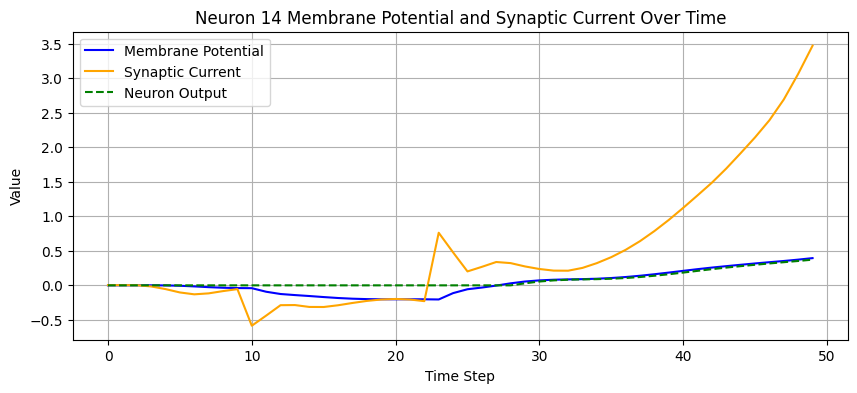

Neuron 15 is non-spiking.
Gamma value: 0.0


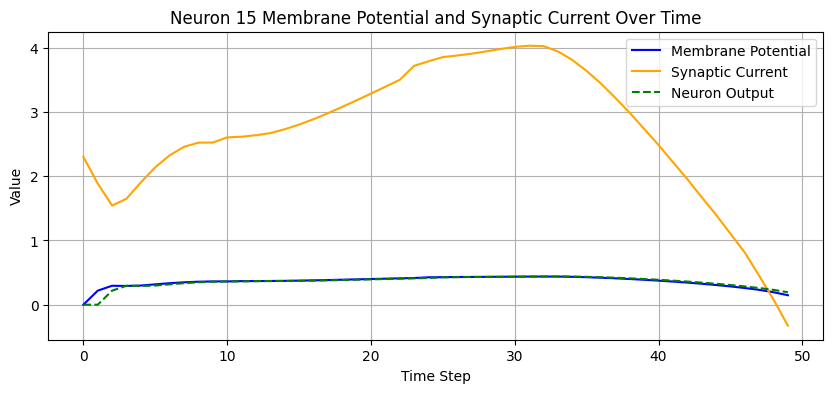

Neuron 16 is non-spiking.
Gamma value: 0.0


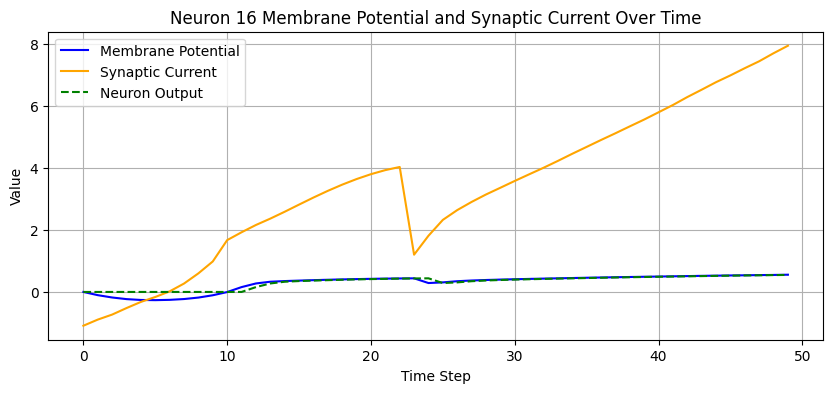

Neuron 17 is non-spiking.
Gamma value: 0.0


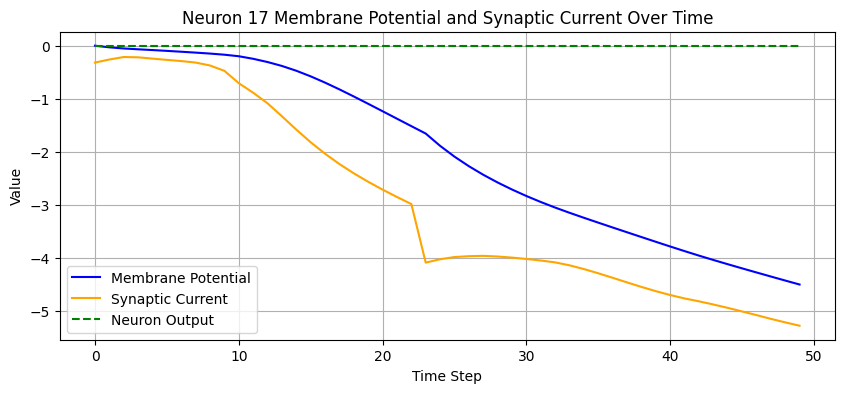

Neuron 18 is non-spiking.
Gamma value: 0.0


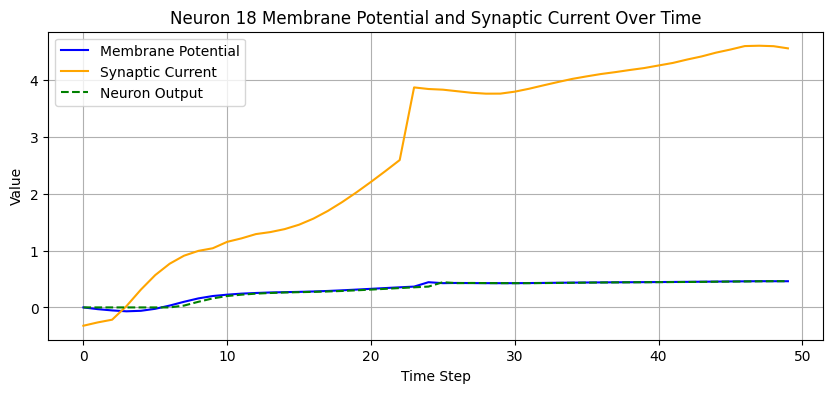

Neuron 19 is non-spiking.
Gamma value: 0.0


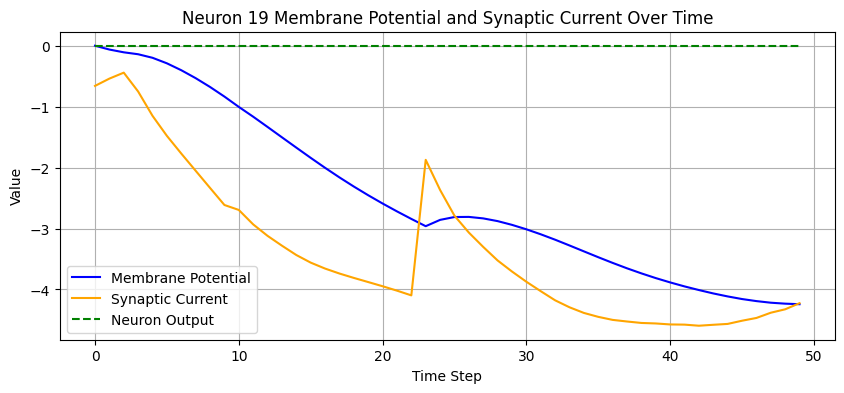

Seed: 4


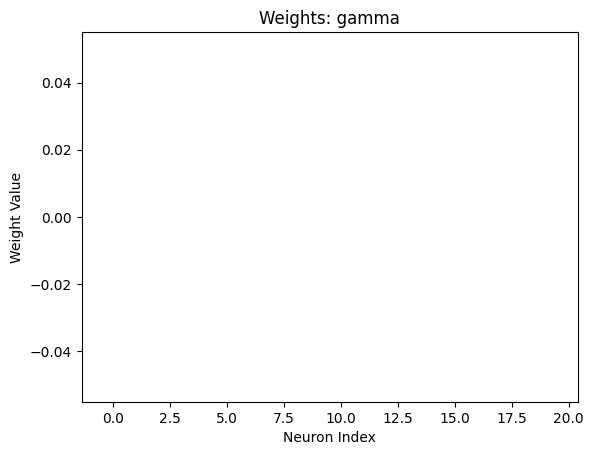

Testing: 100%|██████████| 1/1 [00:00<00:00, 29.19it/s]

Accuracy before binarizing gamma: 0.36500000953674316


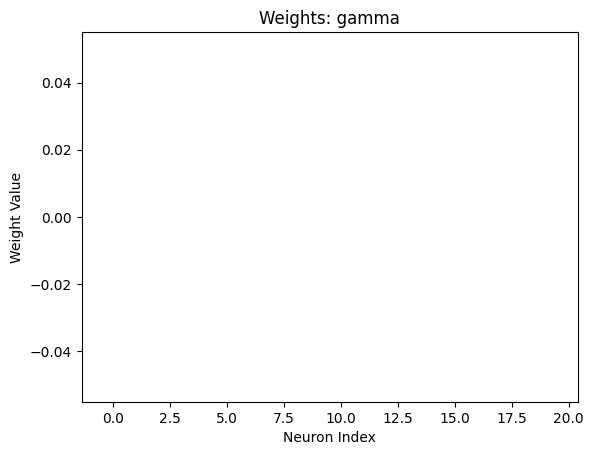

Testing: 100%|██████████| 1/1 [00:00<00:00, 31.50it/s]


Accuracy after binarizing gamma: 0.36500000953674316


Testing:   0%|          | 0/1 [00:00<?, ?it/s]


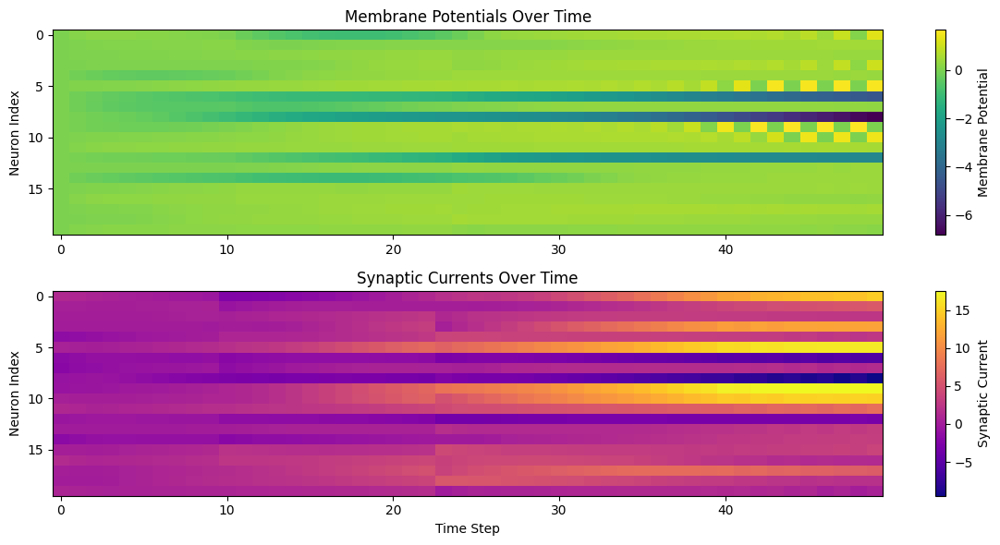

Neuron 0 is non-spiking.
Gamma value: 0.0


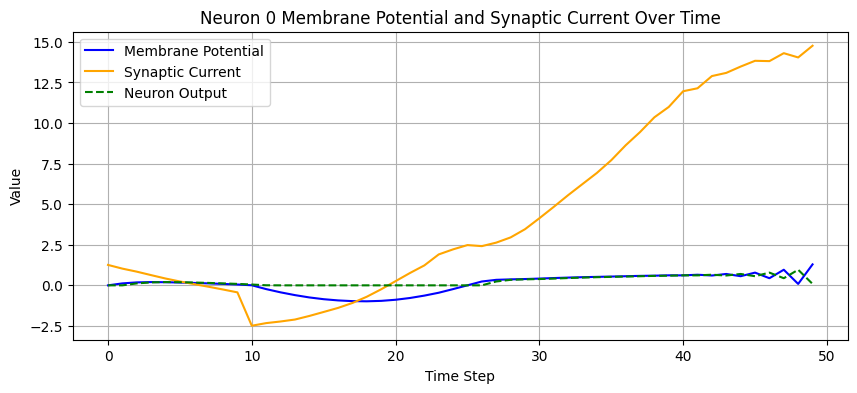

Neuron 1 is non-spiking.
Gamma value: 0.0


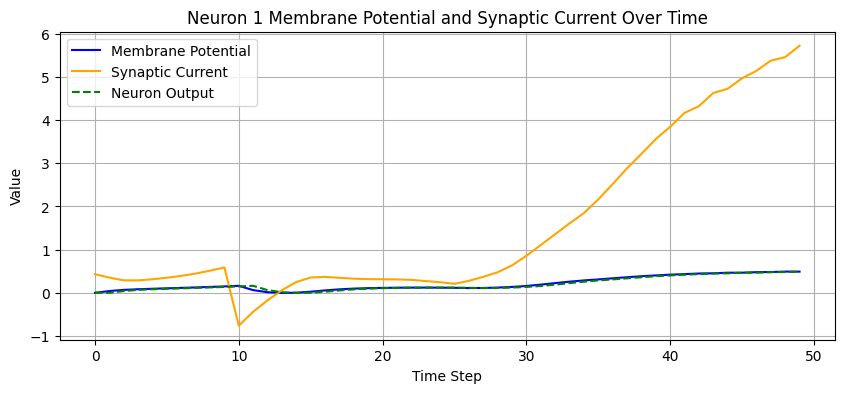

Neuron 2 is non-spiking.
Gamma value: 0.0


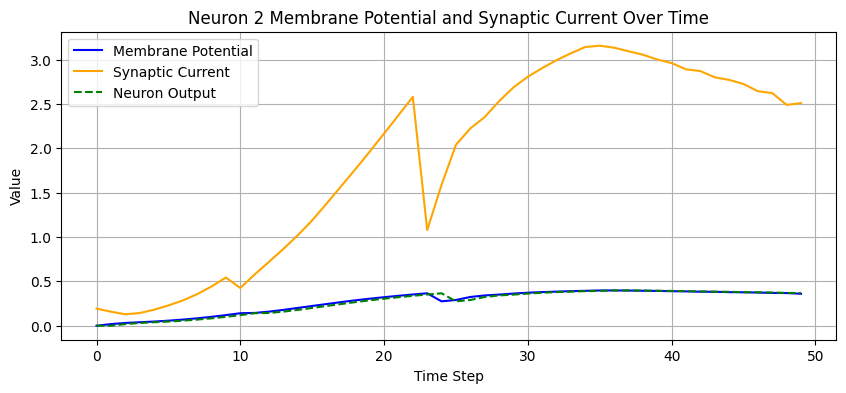

Neuron 3 is non-spiking.
Gamma value: 0.0


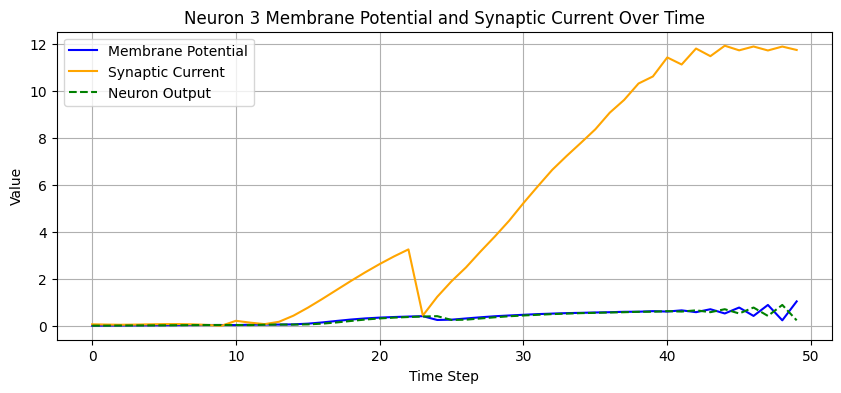

Neuron 4 is non-spiking.
Gamma value: 0.0


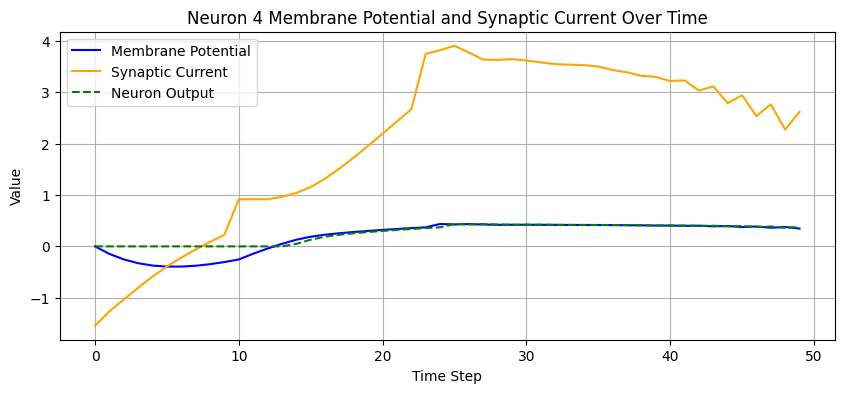

Neuron 5 is non-spiking.
Gamma value: 0.0


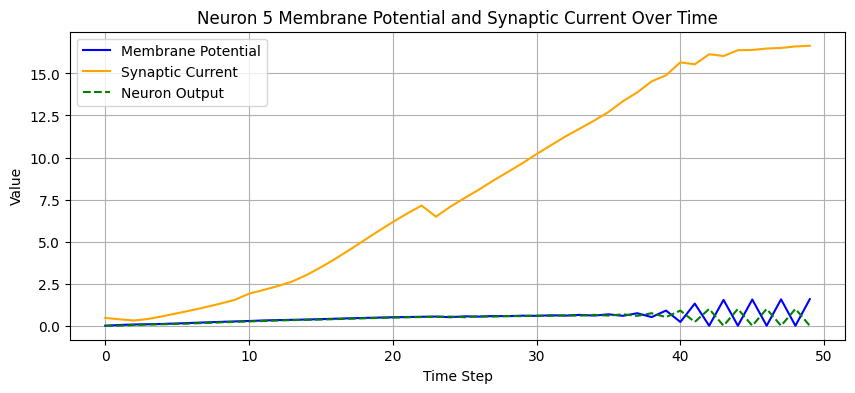

Neuron 6 is non-spiking.
Gamma value: 0.0


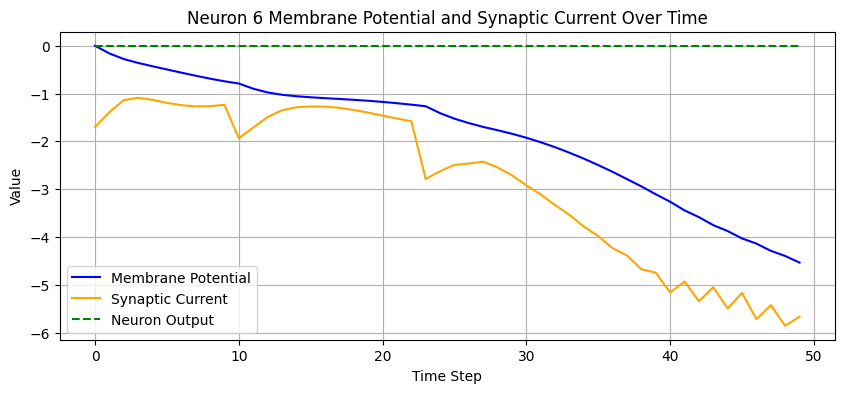

Neuron 7 is non-spiking.
Gamma value: 0.0


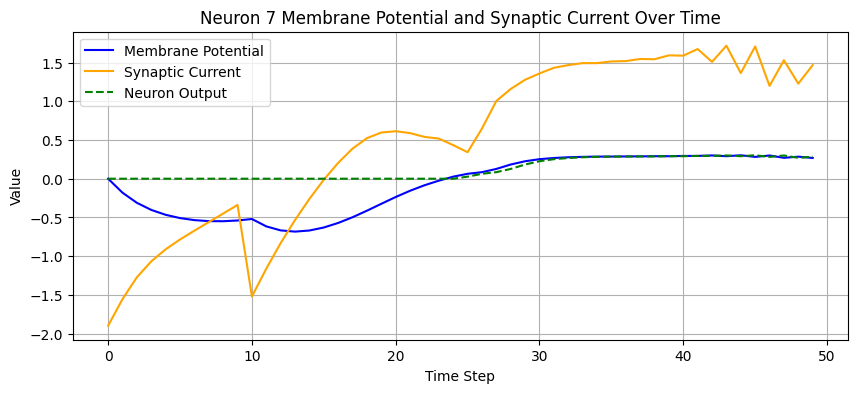

Neuron 8 is non-spiking.
Gamma value: 0.0


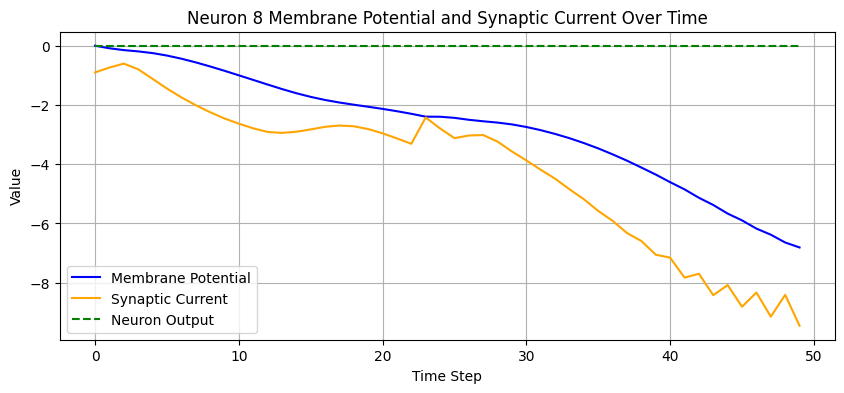

Neuron 9 is non-spiking.
Gamma value: 0.0


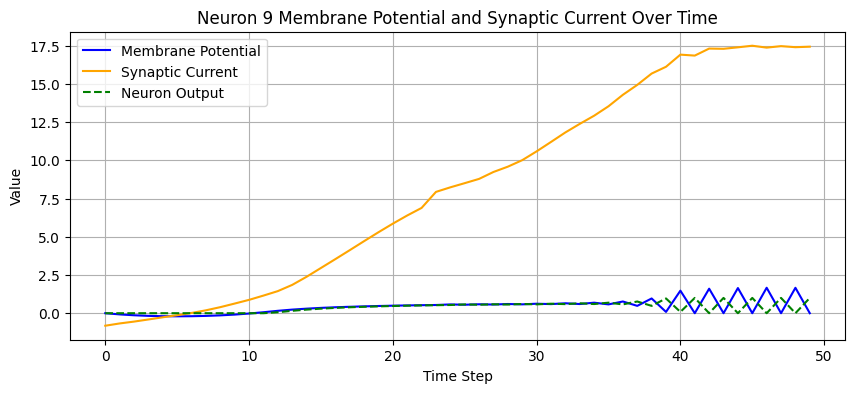

Neuron 10 is non-spiking.
Gamma value: 0.0


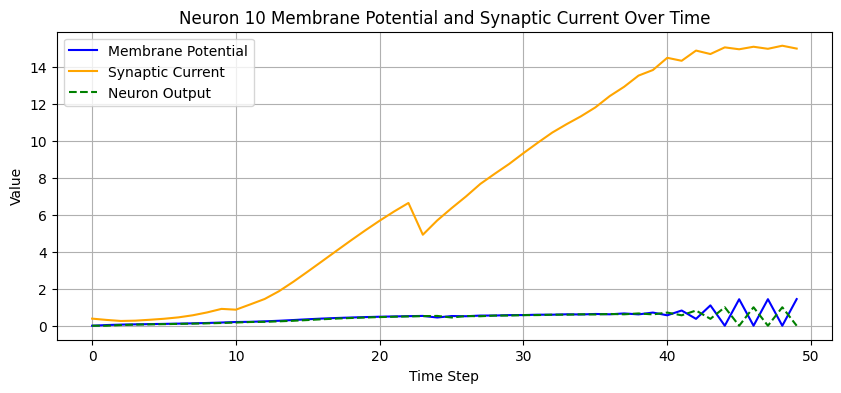

Neuron 11 is non-spiking.
Gamma value: 0.0


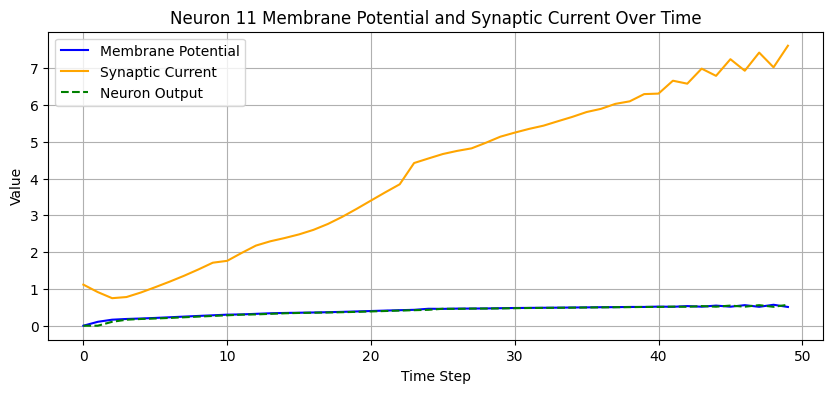

Neuron 12 is non-spiking.
Gamma value: 0.0


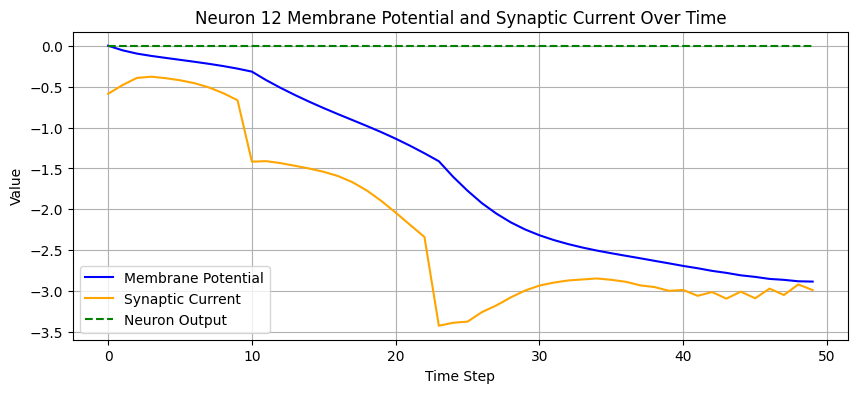

Neuron 13 is non-spiking.
Gamma value: 0.0


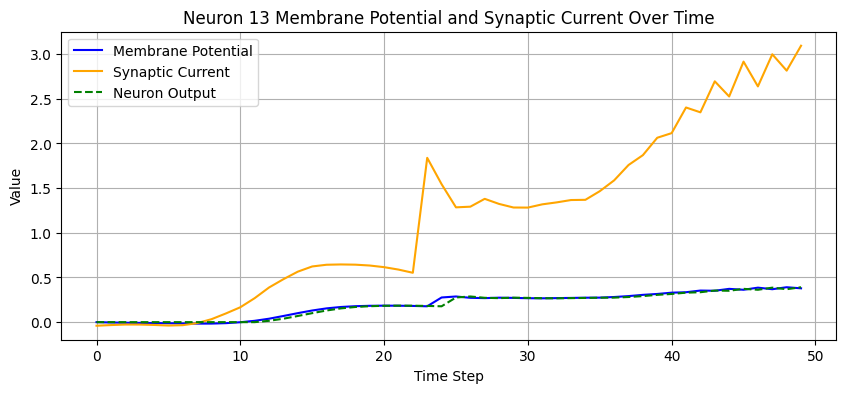

Neuron 14 is non-spiking.
Gamma value: 0.0


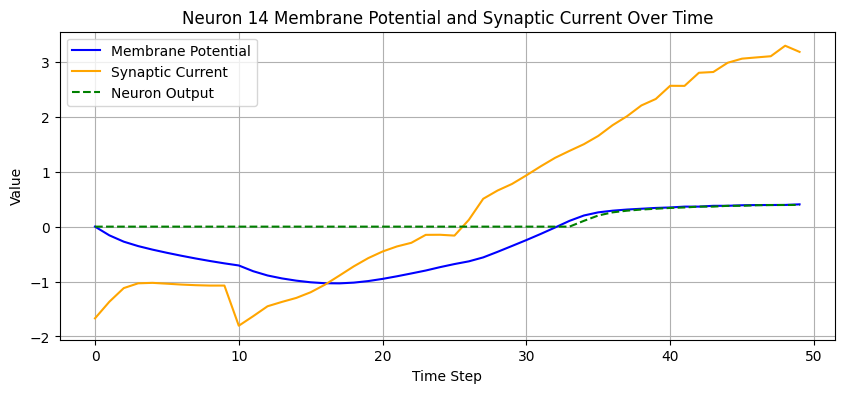

Neuron 15 is non-spiking.
Gamma value: 0.0


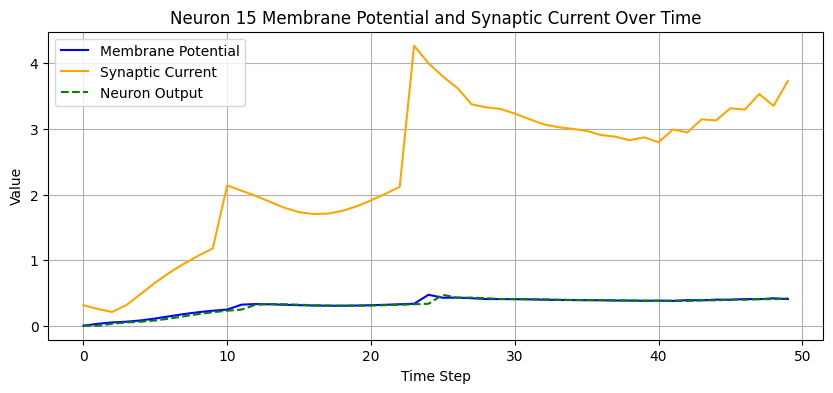

Neuron 16 is non-spiking.
Gamma value: 0.0


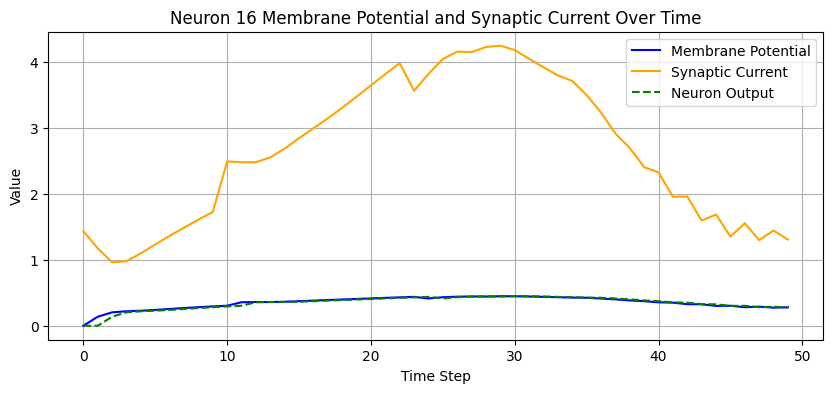

Neuron 17 is non-spiking.
Gamma value: 0.0


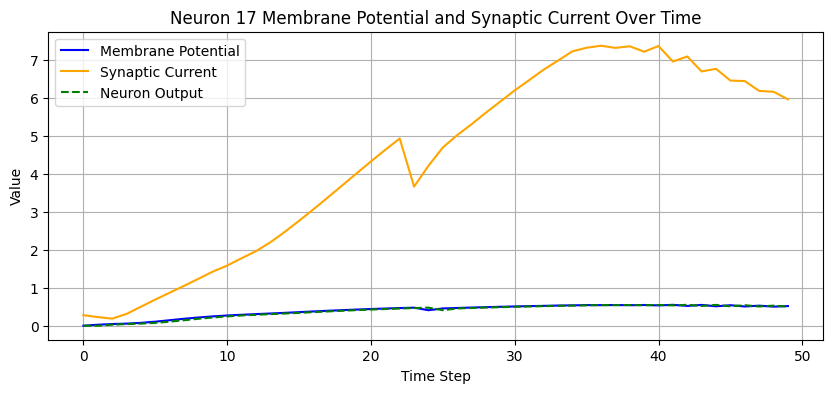

Neuron 18 is non-spiking.
Gamma value: 0.0


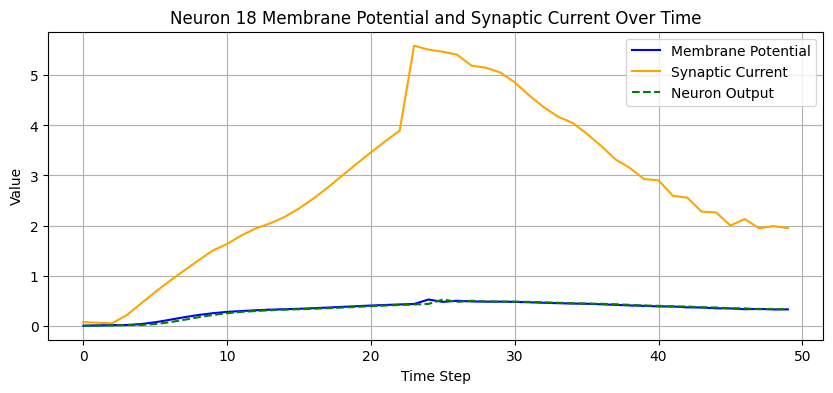

Neuron 19 is non-spiking.
Gamma value: 0.0


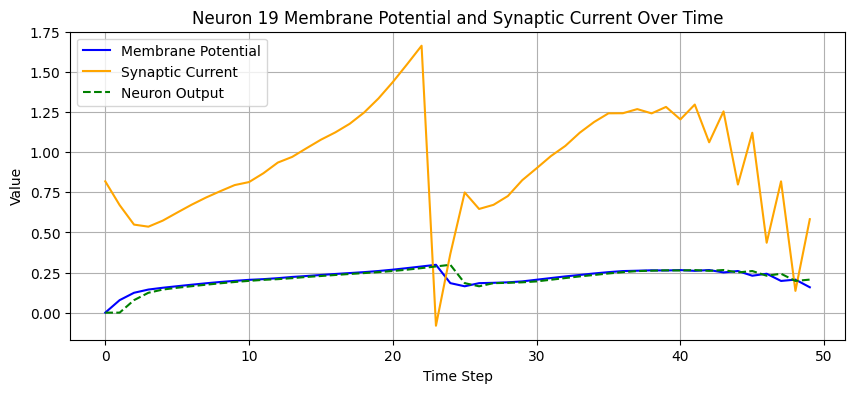

Seed: 5


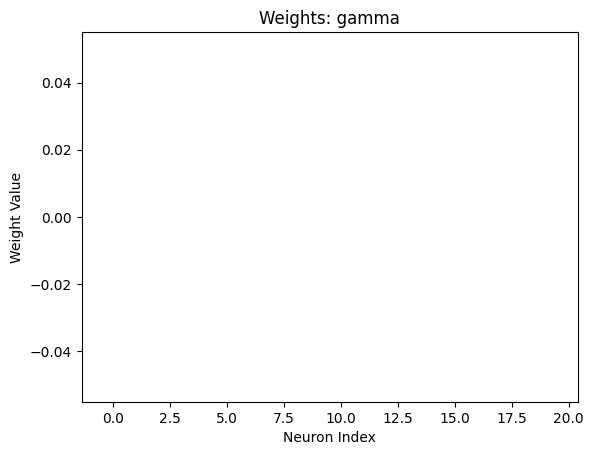

Testing: 100%|██████████| 1/1 [00:00<00:00, 29.53it/s]

Accuracy before binarizing gamma: 0.3449999988079071


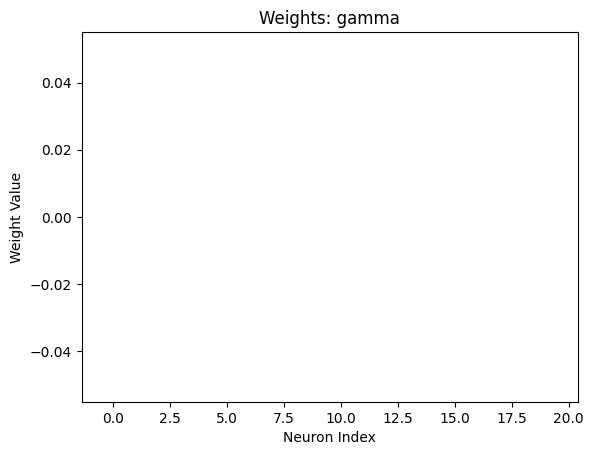

Testing: 100%|██████████| 1/1 [00:00<00:00, 31.49it/s]


Accuracy after binarizing gamma: 0.3449999988079071


Testing:   0%|          | 0/1 [00:00<?, ?it/s]


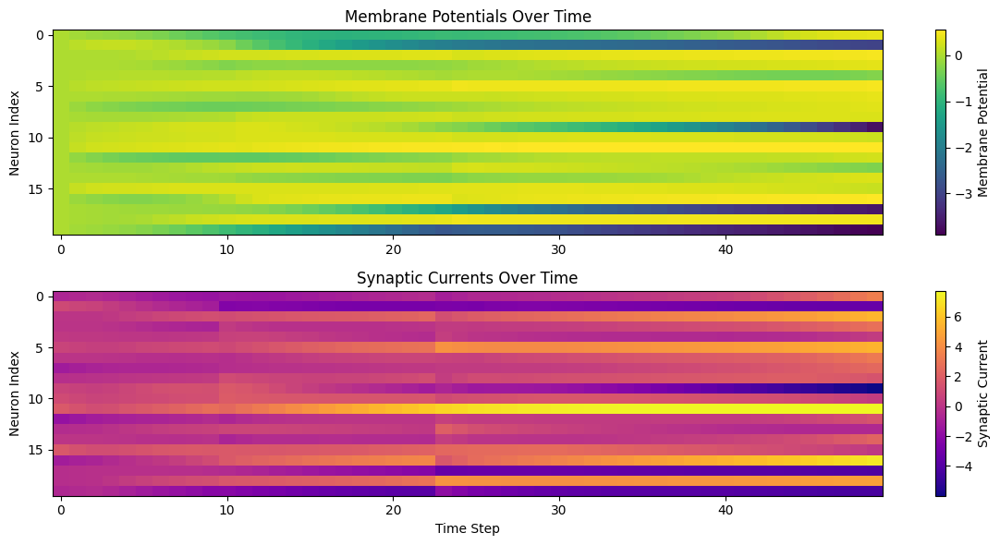

Neuron 0 is non-spiking.
Gamma value: 0.0


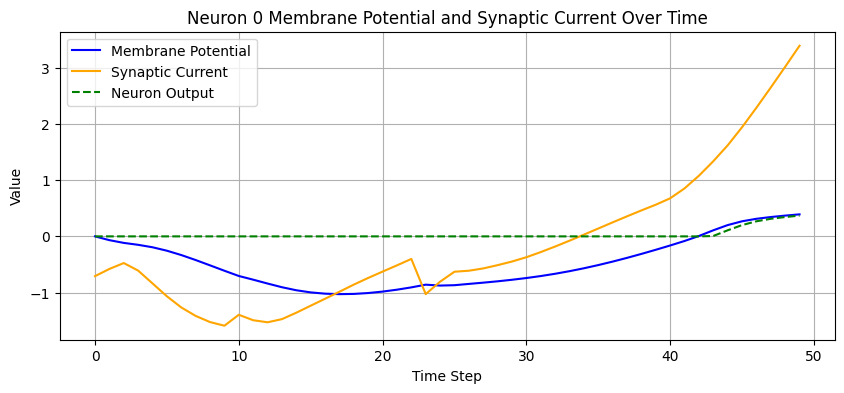

Neuron 1 is non-spiking.
Gamma value: 0.0


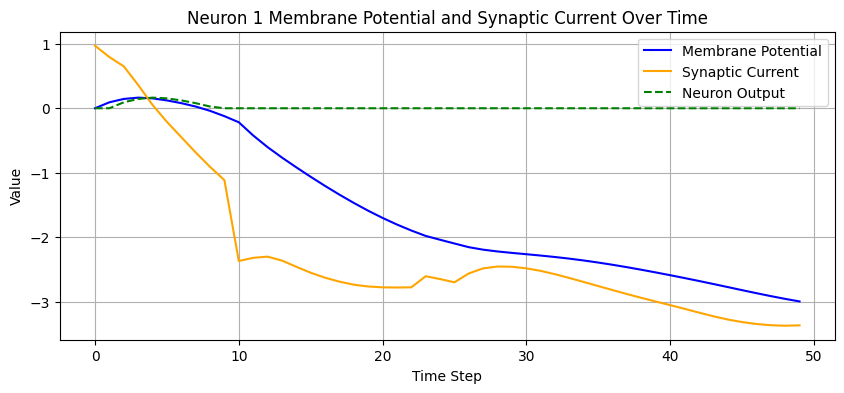

Neuron 2 is non-spiking.
Gamma value: 0.0


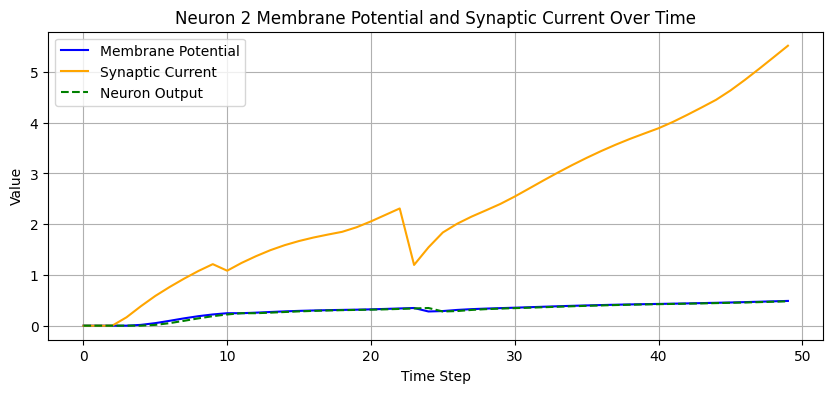

Neuron 3 is non-spiking.
Gamma value: 0.0


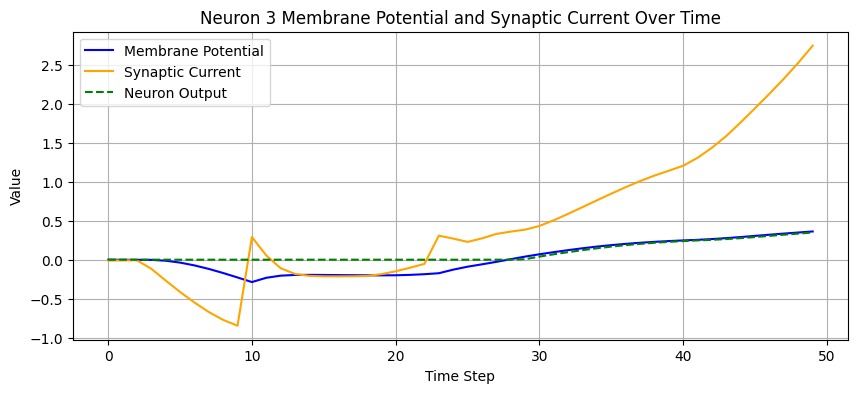

Neuron 4 is non-spiking.
Gamma value: 0.0


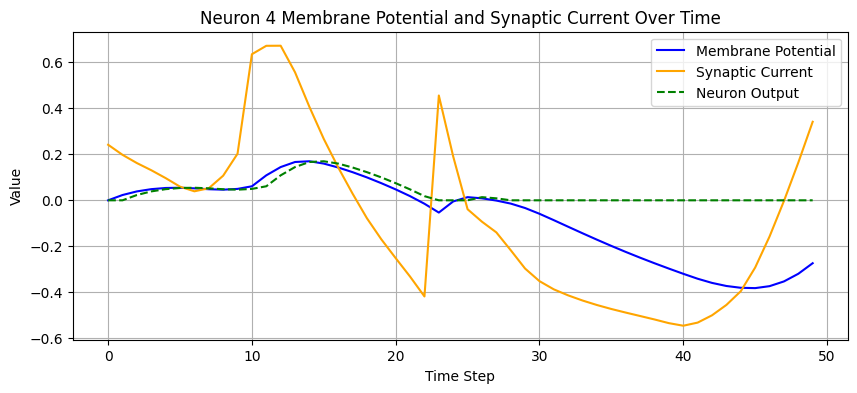

Neuron 5 is non-spiking.
Gamma value: 0.0


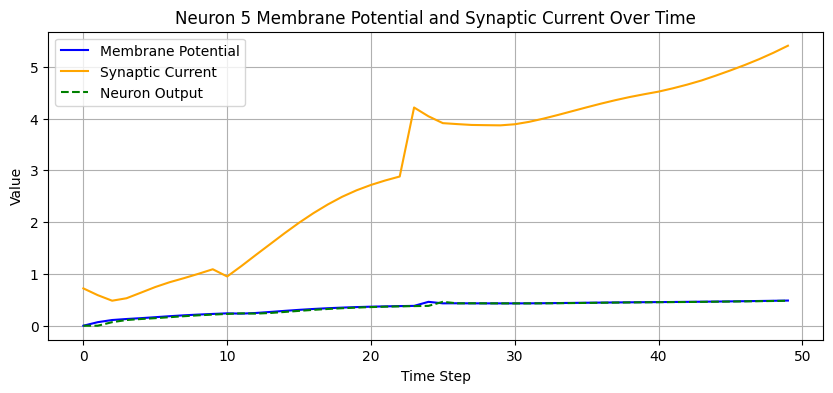

Neuron 6 is non-spiking.
Gamma value: 0.0


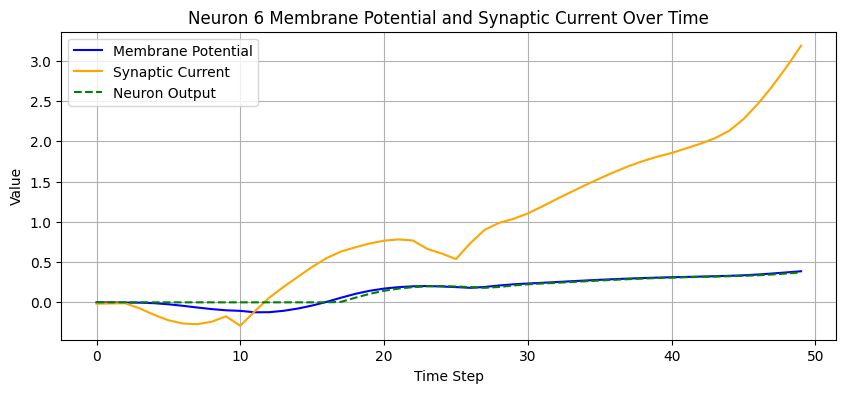

Neuron 7 is non-spiking.
Gamma value: 0.0


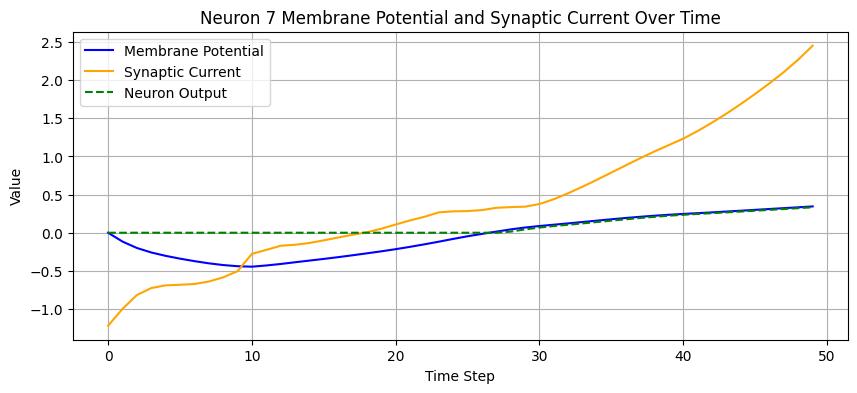

Neuron 8 is non-spiking.
Gamma value: 0.0


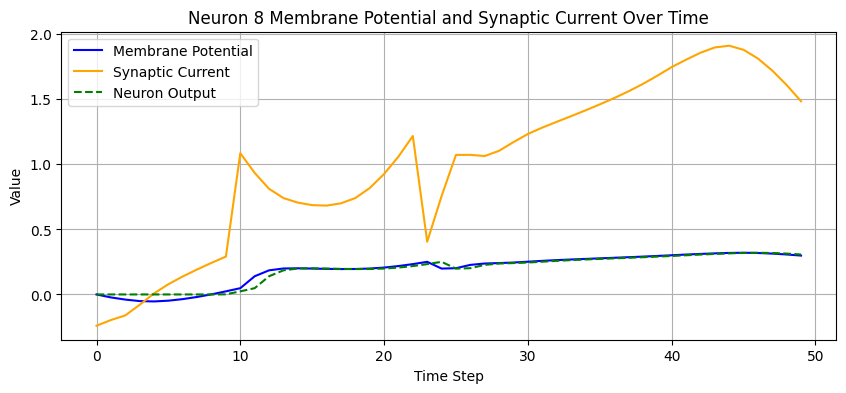

Neuron 9 is non-spiking.
Gamma value: 0.0


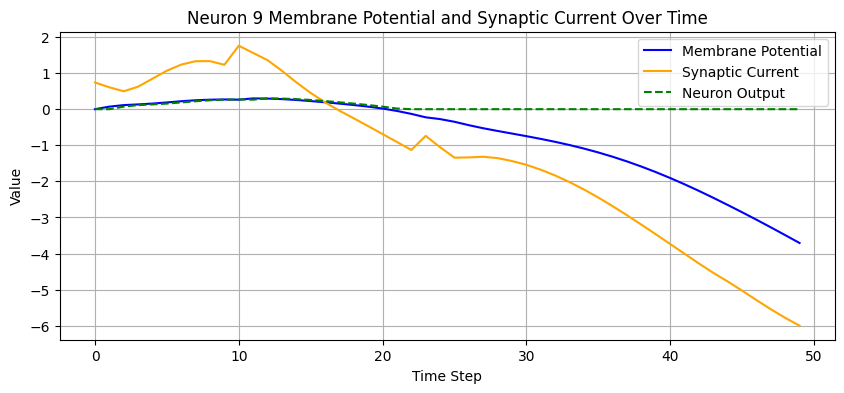

Neuron 10 is non-spiking.
Gamma value: 0.0


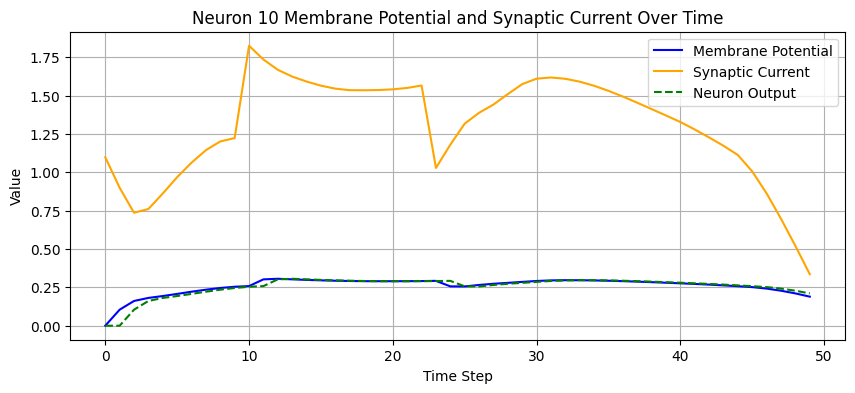

Neuron 11 is non-spiking.
Gamma value: 0.0


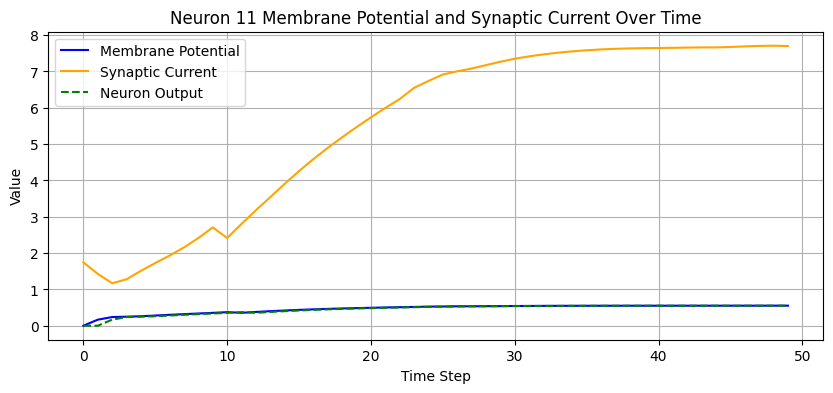

Neuron 12 is non-spiking.
Gamma value: 0.0


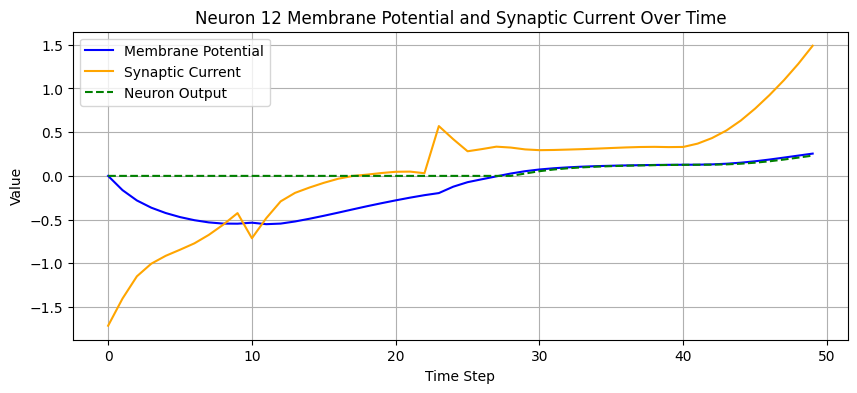

Neuron 13 is non-spiking.
Gamma value: 0.0


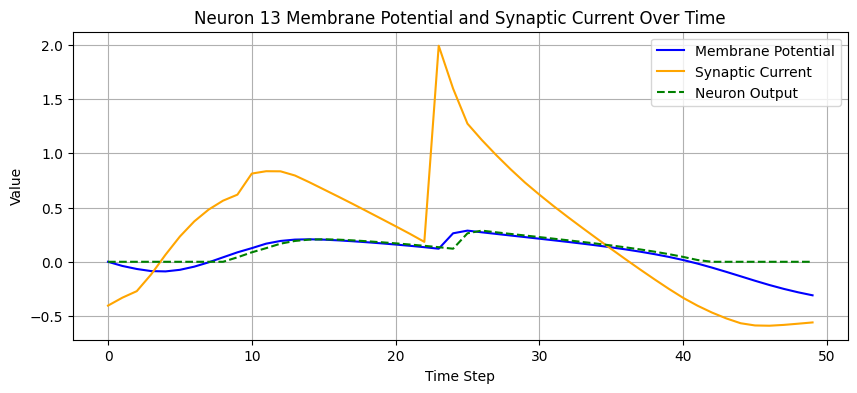

Neuron 14 is non-spiking.
Gamma value: 0.0


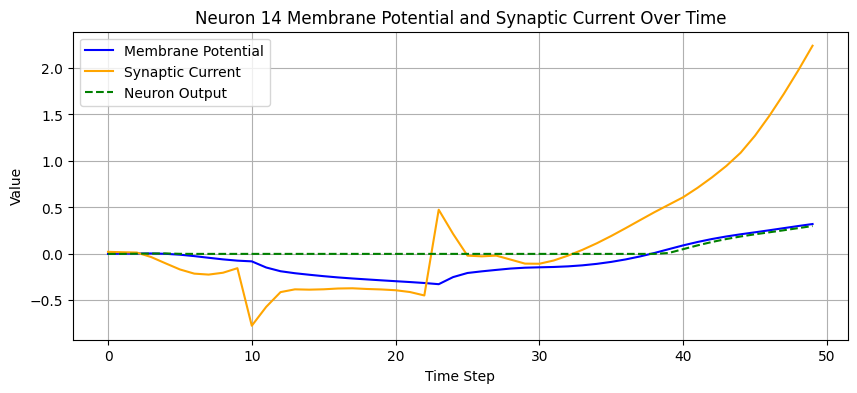

Neuron 15 is non-spiking.
Gamma value: 0.0


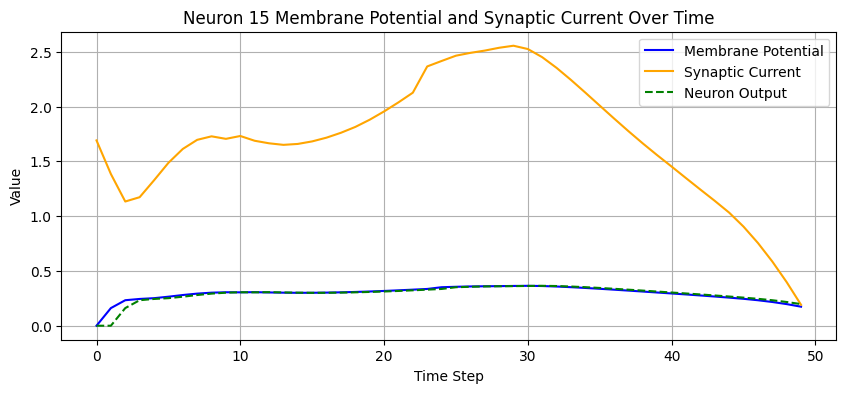

Neuron 16 is non-spiking.
Gamma value: 0.0


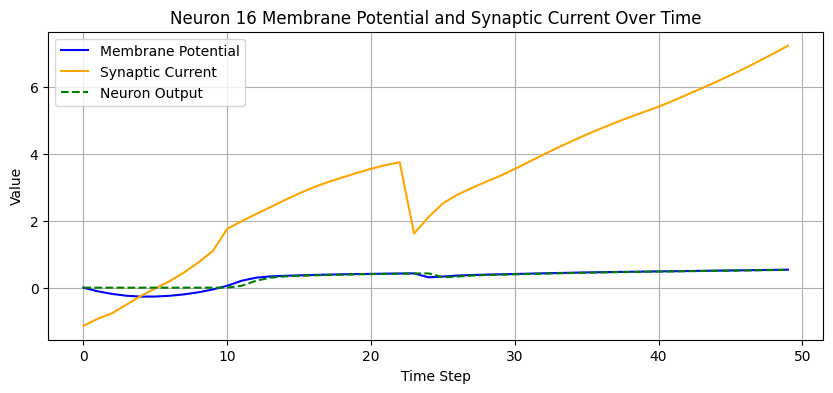

Neuron 17 is non-spiking.
Gamma value: 0.0


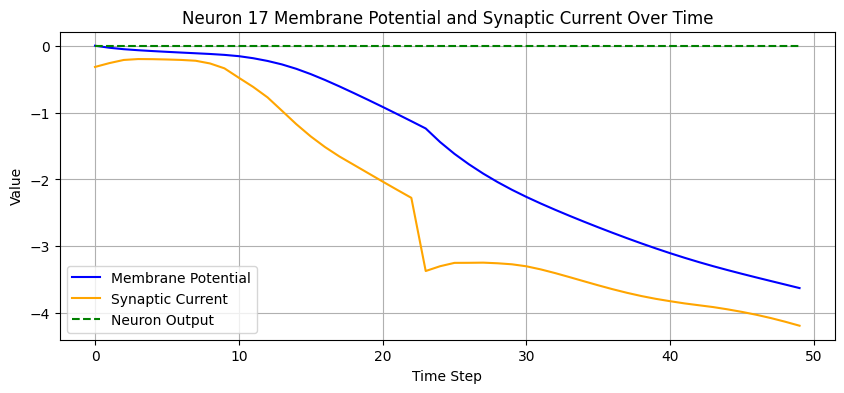

Neuron 18 is non-spiking.
Gamma value: 0.0


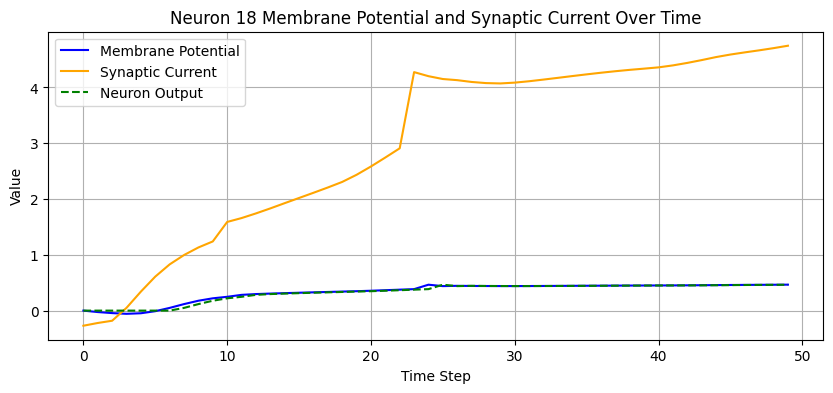

Neuron 19 is non-spiking.
Gamma value: 0.0


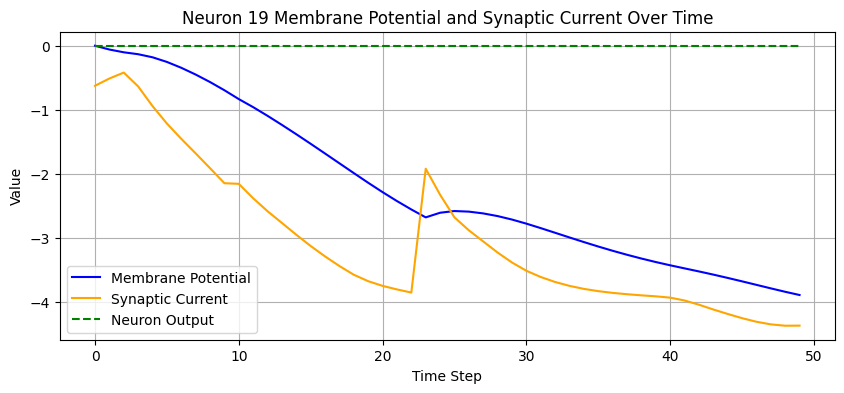

In [52]:
# Now let's compare accuracy with binarized gamma values vs. without binarized gamma values
from test_visualizations.utils import compute_accuracy
accuracy_comparison = {}
for seed in range(1,6):
    accuracy_comparison[seed] = {}
    print(f"Seed: {seed}")
    if data == "randman":
        if reset_nsn == False:
            path = f"/vast/nar8991/snn/training_results/randman/1_d/2_classes/3/cross_entropy/Hybrid_NSN_SNN_V1_Flexible_Spiking/recurrent_True/seed_{seed}/tpe_sampler/20_hidden/1.0_pct_data/None_percent_snn/{gamma_init_type}_gamma_init/gamma_fixed_{gamma_fixed}/reset_nsn_{reset_nsn}/best_model_of_study.ckpt"
        else:
            path = f"/vast/nar8991/snn/training_results/randman/1_d/2_classes/3/cross_entropy/Hybrid_NSN_SNN_V1_Flexible_Spiking/recurrent_True/seed_{seed}/tpe_sampler/20_hidden/1.0_pct_data/None_percent_snn/{gamma_init_type}_gamma_init/gamma_fixed_{gamma_fixed}/best_model_of_study.ckpt"
    elif data == "shd":
        path = f"/vast/nar8991/snn/training_results/shd/None_d/20_classes/700/cross_entropy/Hybrid_NSN_SNN_V1_Flexible_Spiking/recurrent_True/seed_{seed}/tpe_sampler/256_hidden/1.0_pct_data/None_percent_snn/{gamma_init_type}_gamma_init/gamma_fixed_{gamma_fixed}/reset_nsn_{reset_nsn}/best_model_of_study.ckpt"
    model = load_model("Hybrid_NSN_SNN_V1_Flexible_Spiking", path)
    weights = return_weights(model)
    visualize_weights({"gamma": weights["gamma_param"]})
    accuracy = compute_accuracy(model, test_loader)
    accuracy_comparison[seed]['before_binarization'] = accuracy
    print(f"Accuracy before binarizing gamma: {accuracy}")
    
    model.binarize_gamma()  # Binarize gamma values 
    weights_after = return_weights(model)
    visualize_weights({"gamma": weights_after["gamma_param"]})
    gamma_param = weights_after["gamma_param"]
    accuracy_after = compute_accuracy(model, test_loader)
    accuracy_comparison[seed]['after_binarization'] = accuracy_after
    print(f"Accuracy after binarizing gamma: {accuracy_after}")
    auxiliary_outputs, hidden_out_t = get_membrane_potentials(model, test_loader)
    membrane_potentials = auxiliary_outputs['membrane_potentials'] # Something weird is happening here?
    synaptic_currents = auxiliary_outputs['synaptic_currents']
    graph_membrane_potentials_and_synaptic_currents(membrane_potentials.cpu().detach().numpy(), synaptic_currents.cpu().detach().numpy(), example_idx=0)
    neuron_idx = 0
    for neuron_idx in range(membrane_potentials.shape[2]):
        if gamma_param[neuron_idx] > 0.5:
            print(f"Neuron {neuron_idx} is spiking.")
        else:
            print(f"Neuron {neuron_idx} is non-spiking.")
        print(f"Gamma value: {gamma_param[neuron_idx].item()}")
        single_mem_and_syn_potential(membrane_potentials.cpu().detach().numpy(), synaptic_currents.cpu().detach().numpy(), hidden_out_t.cpu().detach().numpy(), neuron_idx, example_idx=0)
    # Identify if the neuron is spiking or nonspiking using gamma


In [54]:
accuracy_comparison

{1: {'before_binarization': 0.3375000059604645,
  'after_binarization': 0.3375000059604645},
 2: {'before_binarization': 0.32249999046325684,
  'after_binarization': 0.32249999046325684},
 3: {'before_binarization': 0.3449999988079071,
  'after_binarization': 0.3449999988079071},
 4: {'before_binarization': 0.36500000953674316,
  'after_binarization': 0.36500000953674316},
 5: {'before_binarization': 0.3449999988079071,
  'after_binarization': 0.3449999988079071}}

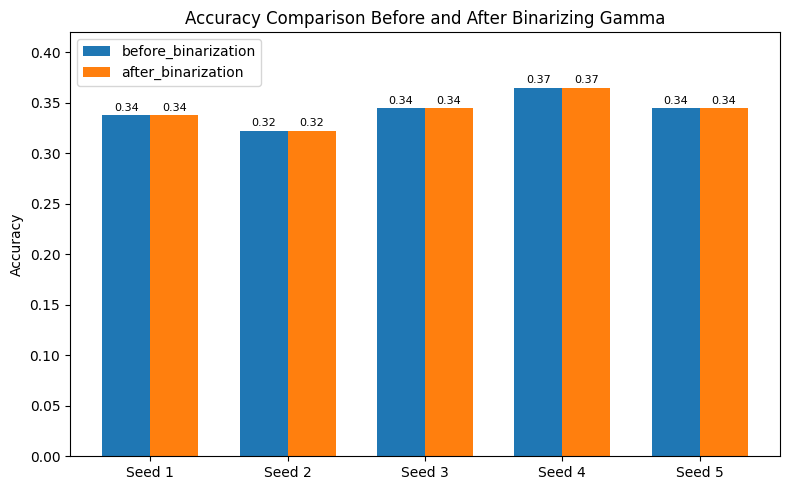

In [53]:
# TO DO: Replace with TPE optimized form
# Plot all accuracies for all seeds in a single grouped bar chart
import numpy as np
def plot_grouped_bar_chart(accuracy_comparison, tlabel = "Accuracy"):
    labels = list(next(iter(accuracy_comparison.values())).keys())
    seeds = list(accuracy_comparison.keys())
    n_labels = len(labels)
    n_seeds = len(seeds)

    bar_width = 0.35
    x = np.arange(n_seeds)

    # Prepare data for each label
    values_per_label = []
    for label in labels:
        values_per_label.append([accuracy_comparison[seed][label] for seed in seeds])

    # Dynamically set y-axis limit based on max value
    max_val = max([max(values) for values in values_per_label])
    y_max = max_val * 1.15 if max_val > 0 else 1

    plt.figure(figsize=(8, 5))
    for i, (label, values) in enumerate(zip(labels, values_per_label)):
        plt.bar(x + i * bar_width, values, width=bar_width, label=label)

    plt.xticks(x + bar_width / 2, [f"Seed {seed}" for seed in seeds])
    plt.ylabel(tlabel)
    plt.ylim(0, y_max)
    plt.title(f"{tlabel} Comparison Before and After Binarizing Gamma")
    plt.legend()
    for i in range(n_labels):
        for j, v in enumerate(values_per_label[i]):
            plt.text(j + i * bar_width, v + y_max*0.01, f"{v:.2f}", ha='center', fontsize=8)
    plt.tight_layout()
    plt.show()
plot_grouped_bar_chart(accuracy_comparison)

Seed: 1
Seed: 2
Seed: 3
Seed: 4
Seed: 5


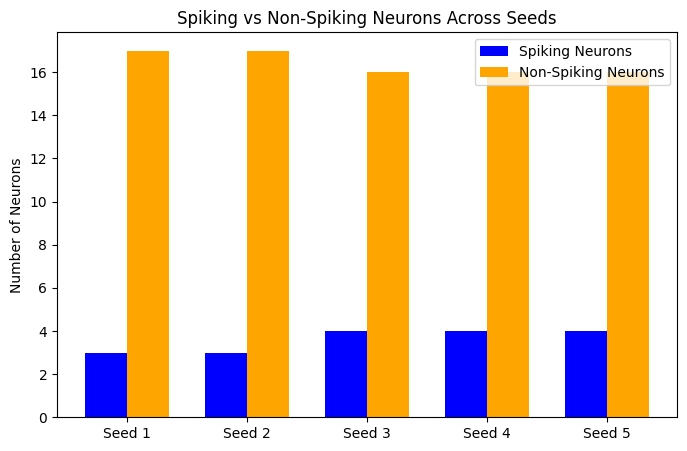

In [ ]:
# Go through the models and show the % of spiking vs. non-spiking neurons
spiking_stats = {}
for seed in range(1,6):
    accuracy_comparison[seed] = {}
    print(f"Seed: {seed}")
    if data == "randman":
        path = f"/vast/nar8991/snn/training_results/randman/1_d/2_classes/3/cross_entropy/Hybrid_NSN_SNN_V1_Flexible_Spiking/recurrent_True/seed_{seed}/tpe_sampler/20_hidden/1.0_pct_data/None_percent_snn/{gamma_init_type}_gamma_init/gamma_fixed_{gamma_fixed}/reset_nsn_{reset_nsn}/best_model_of_study.ckpt"
    elif data == "shd":
        path = f"/vast/nar8991/snn/training_results/shd/None_d/20_classes/700/cross_entropy/Hybrid_NSN_SNN_V1_Flexible_Spiking/recurrent_True/seed_{seed}/tpe_sampler/256_hidden/1.0_pct_data/None_percent_snn/{gamma_init_type}_gamma_init/gamma_fixed_{gamma_fixed}/reset_nsn_{reset_nsn}/best_model_of_study.ckpt"
    model = load_model("Hybrid_NSN_SNN_V1_Flexible_Spiking", path)
    weights = return_weights(model)
    gamma_param = weights["gamma_param"]
    n_spiking = (gamma_param > 0.5).sum().item()
    n_non_spiking = (gamma_param <= 0.5).sum().item()
    total = n_spiking + n_non_spiking
    spiking_stats[seed] = {
        "n_spiking": n_spiking,
        "n_non_spiking": n_non_spiking,
        "total": total,
        "percent_spiking": (n_spiking / total * 100) if total > 0 else 0
    }

# Plot the spiking stats
labels = list(spiking_stats.keys())
n_spiking = [spiking_stats[seed]['n_spiking'] for seed in labels]
n_non_spiking = [spiking_stats[seed]['n_non_spiking'] for seed in labels]
x = np.arange(len(labels))
bar_width = 0.35
plt.figure(figsize=(8, 5))
plt.bar(x - bar_width/2, n_spiking, width=bar_width, label='Spiking Neurons', color='blue')
plt.bar(x + bar_width/2, n_non_spiking, width=bar_width, label='Non-Spiking Neurons', color='orange')
plt.xticks(x, [f"Seed {seed}" for seed in labels])
plt.ylabel('Number of Neurons')
plt.title('Spiking vs Non-Spiking Neurons Across Seeds')
plt.legend()

# Do spiking neurons generalize better?

Thoughts:
- Maybe partially due to hyperparameters?

In [ ]:
def get_spikes(model, test_loader):
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model.test_accuracy.reset()
    model.to(device)
    model.zero_grad()
    spikes = []
    for inputs, targets in tqdm(test_loader, desc="Testing"):
        inputs, targets = inputs.to(device), targets.to(device)
        _, auxiliary_outputs, _, _ = model(inputs)
        spikes.append(auxiliary_outputs['spikes'])
    return spikes

def percent_neurons_spiking(spikes, gamma_param):
    values = []
    for spike in spikes:
        neuron_level_agg = spike.sum(dim=[0, 1])
        neuron_level_agg = (neuron_level_agg > 0).float()
        values.append((neuron_level_agg.sum()/gamma_param.sum()).cpu().item())
    return np.mean(values)

def average_spikes_per_neuron(spikes, gamma_param):
    values = []
    for spike in spikes:
        # Sum across time
        total_spikes_across_time = spike.sum(dim=[1])
        # Take mean across batch (neuron level retained)
        mean_spikes_per_batch = total_spikes_across_time.mean(dim=[0])
        # Then just take mean across all spiking neurons
        values.append((mean_spikes_per_batch.sum().cpu().item())/gamma_param.sum().cpu().item())
    return np.mean(values)


Seed: 1


Testing: 100%|██████████| 1/1 [00:00<00:00, 29.92it/s]


Seed: 2


Testing: 100%|██████████| 1/1 [00:00<00:00, 30.19it/s]


Seed: 3


Testing: 100%|██████████| 1/1 [00:00<00:00, 29.41it/s]


Seed: 4


Testing: 100%|██████████| 1/1 [00:00<00:00, 29.36it/s]


Seed: 5


Testing: 100%|██████████| 1/1 [00:00<00:00, 27.81it/s]


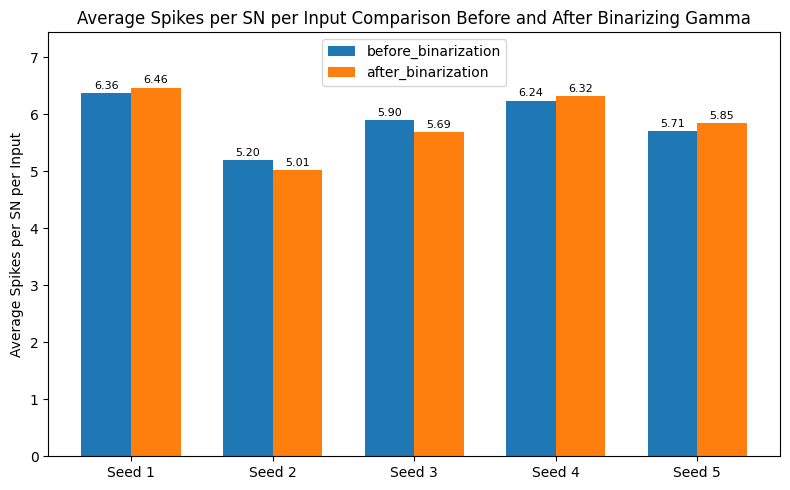

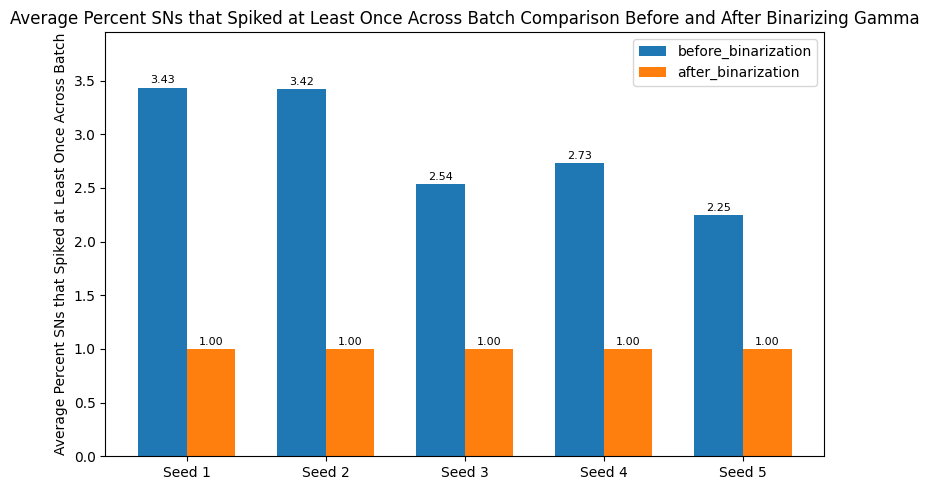

In [ ]:
percent_neurons_spiking_d = {}
average_spikes_per_neuron_d = {}
for seed in range(1,6):
    percent_neurons_spiking_d[seed] = {}
    average_spikes_per_neuron_d[seed] = {}
    print(f"Seed: {seed}")
    path = f"/vast/nar8991/snn/training_results/randman/1_d/2_classes/3/cross_entropy/Hybrid_NSN_SNN_V1_Flexible_Spiking/recurrent_True/seed_{seed}/tpe_sampler/20_hidden/1.0_pct_data/None_percent_snn/{gamma_init_type}_gamma_init/gamma_fixed_{gamma_fixed}/reset_nsn_{reset_nsn}/best_model_of_study.ckpt"
    model = load_model("Hybrid_NSN_SNN_V1_Flexible_Spiking", path)
    weights = return_weights(model)
    gamma_param = weights["gamma_param"]
    spikes = get_spikes(model, test_loader)
    percent_neurons_spiking_d[seed]["before_binarization"] = percent_neurons_spiking(spikes, gamma_param)
    average_spikes_per_neuron_d[seed]["before_binarization"] = average_spikes_per_neuron(spikes, gamma_param)
    model.binarize_gamma()  # Binarize gamma values
    weights_after = return_weights(model)
    gamma_param = weights_after["gamma_param"]
    spikes = get_spikes(model, test_loader)
    percent_neurons_spiking_d[seed]["after_binarization"] = percent_neurons_spiking(spikes, gamma_param)
    average_spikes_per_neuron_d[seed]["after_binarization"] = average_spikes_per_neuron(spikes, gamma_param)
plot_grouped_bar_chart(average_spikes_per_neuron_d, "Average Spikes per SN per Input")
plot_grouped_bar_chart(percent_neurons_spiking_d, "Average Percent SNs that Spiked at Least Once Across Batch")



In [ ]:
# Modified SAM

from loss_landscapes.sam_loss import compute_sam_sharpness 
from loss_landscapes.utils import get_randman_train_data

def calculate_and_visualize_sam(data, models_selected=None, sampler_type="grid", base_prefix="vast", percent_vals=[0.25, 0.5, 0.75], nsn_reset = True):
    if data == 'randman':
        num_dim = 1
        num_classes = 2
        alpha = 3
        BASE_PATH=f"/{base_prefix}/nar8991/snn/training_results/randman/{num_dim}_d/{num_classes}_classes/3/cross_entropy"
        train_loader = get_randman_train_data(num_dim=num_dim, num_classes=num_classes, alpha=alpha)
        test_loader = get_randman_test_data(num_dim=num_dim, num_classes=num_classes, alpha=alpha)
        hidden_neurons = 20
    
    rho_list = [0.01, 0.05, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6]

    # Adjusted structure to store avg and diff SAM values separately for each rho
    sam_results = {
        'avg': {rho: [] for rho in rho_list},
        'diff': {rho: [] for rho in rho_list},
        'test_acc': {rho: [] for rho in rho_list},
        'train_acc': {rho: [] for rho in rho_list},
        'test_acc_bin': {rho: [] for rho in rho_list},
        'train_acc_bin': {rho: [] for rho in rho_list},
    }
    labels = []

    if models_selected is not None:
        new_model_classes = {k: v for k, v in MODEL_CLASSES.items() if k in models_selected}
    else:
        new_model_classes = MODEL_CLASSES

    missing = {}
    successful_models = {}
    
    for model_name, model_class in new_model_classes.items():
        missing[model_name] = {}
        successful_models[model_name] = {}
        
        for recurrent in ["True"]:
            percent_list = percent_vals if ('Hybrid' in model_name and 'Spiking' not in model_name) else [None]
            
            for percent in percent_list:
                missing[model_name][percent] = set()
                successful_models[model_name][percent] = set()
                seeds = range(1,6) if data == 'randman' else range(1,5)
                
                # Process each seed individually and create separate entries
                for seed in tqdm(seeds, desc=f"{model_name} | recurrent={recurrent} | {percent}_percent_snn"):
                    if "Flexible" in model_name:
                        prefix = f"None_percent_snn/{gamma_init_type}_gamma_init/gamma_fixed_{gamma_fixed}/"
                        if nsn_reset == False:
                            prefix = prefix + "reset_nsn_False/"
                        model_path_suffix = f"{prefix}best_model_of_study.ckpt"
                    elif "NSN" in model_name and nsn_reset == False:
                        model_path_suffix = f"{percent}_percent_snn/reset_nsn_{reset_nsn}/best_model_of_study.ckpt"
                    else:
                        model_path_suffix = f"{percent}_percent_snn/best_model_of_study.ckpt"
                    
                    base_path = f"{BASE_PATH}/{model_name}/recurrent_{recurrent}/seed_{seed}/{sampler_type}_sampler/{hidden_neurons}_hidden/1.0_pct_data"
                    model_file_path = f"{base_path}/{model_path_suffix}"
                    
                    if not os.path.exists(model_file_path):
                        print(f"Skipping missing model file: {model_file_path}")
                        missing[model_name][percent].add(seed)
                        continue
                    
                    successful_models[model_name][percent].add(seed)
                    model = model_class.load_from_checkpoint(model_file_path, strict=False)
                    weights = return_weights(model)
                    gamma_param = weights["gamma_param"]
                    n_spiking = (gamma_param > 0.5).sum().item()
                    n_non_spiking = (gamma_param <= 0.5).sum().item()
                    print(f"Model: {model_name} | Seed: {seed} | Spiking Neurons: {n_spiking} | Non-Spiking Neurons: {n_non_spiking}")
                    
                    percent_snn = (n_spiking / (n_spiking + n_non_spiking)) if (n_spiking + n_non_spiking) > 0 else 0
                    
                    # Create seed-specific label
                    label = f"{model_name} | recurrent={recurrent} | {percent_snn}_percent_snn | seed={seed}"
                    labels.append(label)
                    
                    test_accuracy = compute_accuracy(model, test_loader)
                    train_accuracy = compute_accuracy(model, train_loader)
                    
                    # Post binarization accuracy
                    model.binarize_gamma()
                    test_accuracy_binarized = compute_accuracy(model, test_loader)
                    train_accuracy_binarized = compute_accuracy(model, train_loader)

                    # Store single-seed data for each rho
                    for rho in rho_list:
                        avg_sam, diff_sam = compute_sam_sharpness(model, train_loader, rho=rho)
                        sam_results['avg'][rho].append([avg_sam])  # Single value in list
                        sam_results['diff'][rho].append([diff_sam])  # Single value in list
                        sam_results['test_acc'][rho].append([test_accuracy])  # Single value in list
                        sam_results['train_acc'][rho].append([train_accuracy])  # Single value in list
                        sam_results['test_acc_bin'][rho].append([test_accuracy_binarized])  # Single value in list
                        sam_results['train_acc_bin'][rho].append([train_accuracy_binarized])  # Single value in list


    return rho_list, sam_results, labels, missing, successful_models

In [ ]:
models = ["Hybrid_NSN_SNN_V1_Flexible_Spiking"]
# nsn_reset_val = True
rho_list, sam_results, labels, missing, successful = calculate_and_visualize_sam("randman", models_selected=models, sampler_type="tpe", base_prefix="vast", percent_vals=[None], nsn_reset=reset_nsn)

Hybrid_NSN_SNN_V1_Flexible_Spiking | recurrent=True | None_percent_snn:   0%|          | 0/5 [00:00<?, ?it/s]

Model: Hybrid_NSN_SNN_V1_Flexible_Spiking | Seed: 1 | Spiking Neurons: 3 | Non-Spiking Neurons: 17


Testing: 100%|██████████| 3/3 [00:00<00:00, 27.23it/s]
Hybrid_NSN_SNN_V1_Flexible_Spiking | recurrent=True | None_percent_snn:  20%|██        | 1/5 [00:03<00:12,  3.22s/it]

Model: Hybrid_NSN_SNN_V1_Flexible_Spiking | Seed: 2 | Spiking Neurons: 3 | Non-Spiking Neurons: 17


Testing: 100%|██████████| 3/3 [00:00<00:00, 26.86it/s]
Hybrid_NSN_SNN_V1_Flexible_Spiking | recurrent=True | None_percent_snn:  40%|████      | 2/5 [00:06<00:09,  3.20s/it]

Model: Hybrid_NSN_SNN_V1_Flexible_Spiking | Seed: 3 | Spiking Neurons: 4 | Non-Spiking Neurons: 16


Testing: 100%|██████████| 3/3 [00:00<00:00, 27.37it/s]
Hybrid_NSN_SNN_V1_Flexible_Spiking | recurrent=True | None_percent_snn:  60%|██████    | 3/5 [00:09<00:06,  3.21s/it]

Model: Hybrid_NSN_SNN_V1_Flexible_Spiking | Seed: 4 | Spiking Neurons: 4 | Non-Spiking Neurons: 16


Testing: 100%|██████████| 3/3 [00:00<00:00, 27.73it/s]
Hybrid_NSN_SNN_V1_Flexible_Spiking | recurrent=True | None_percent_snn:  80%|████████  | 4/5 [00:12<00:03,  3.21s/it]

Model: Hybrid_NSN_SNN_V1_Flexible_Spiking | Seed: 5 | Spiking Neurons: 4 | Non-Spiking Neurons: 16


Testing: 100%|██████████| 3/3 [00:00<00:00, 27.41it/s]
Hybrid_NSN_SNN_V1_Flexible_Spiking | recurrent=True | None_percent_snn: 100%|██████████| 5/5 [00:16<00:00,  3.21s/it]


In [ ]:
labels

['Hybrid_NSN_SNN_V1_Flexible_Spiking | recurrent=True | 0.15_percent_snn | seed=1',
 'Hybrid_NSN_SNN_V1_Flexible_Spiking | recurrent=True | 0.15_percent_snn | seed=2',
 'Hybrid_NSN_SNN_V1_Flexible_Spiking | recurrent=True | 0.2_percent_snn | seed=3',
 'Hybrid_NSN_SNN_V1_Flexible_Spiking | recurrent=True | 0.2_percent_snn | seed=4',
 'Hybrid_NSN_SNN_V1_Flexible_Spiking | recurrent=True | 0.2_percent_snn | seed=5']

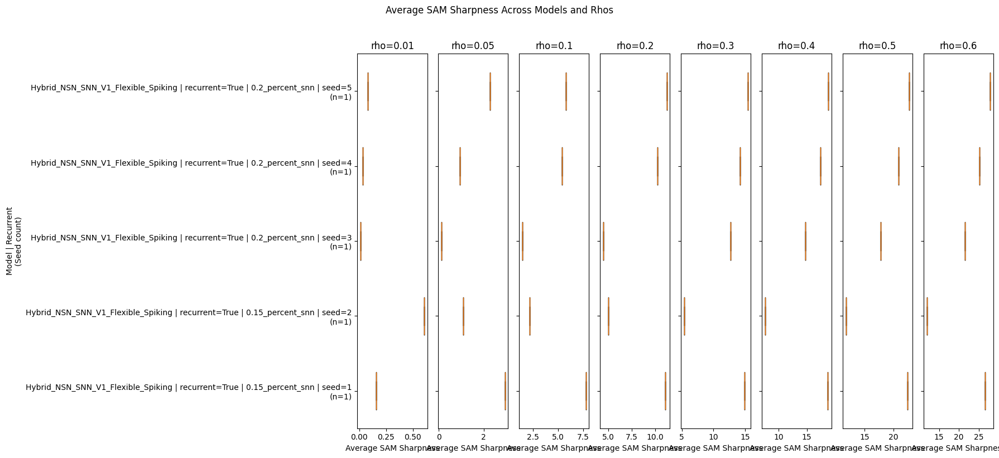

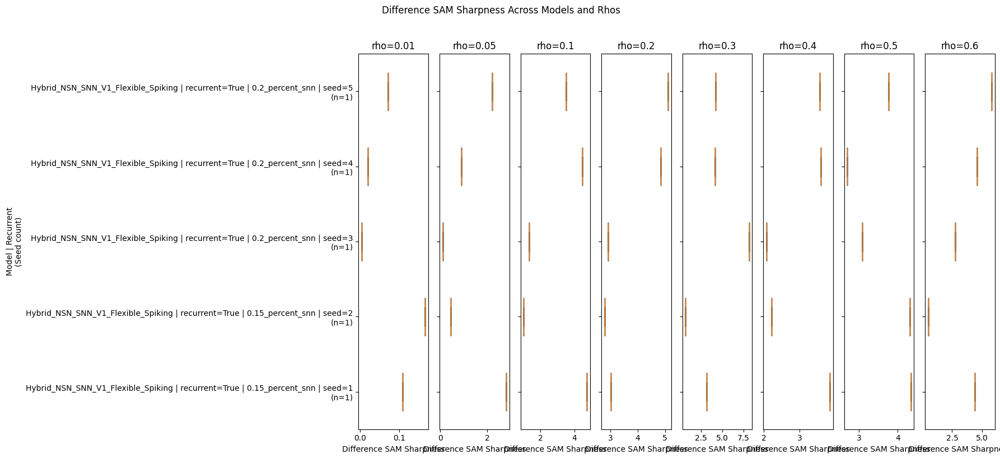

In [ ]:
from loss_landscapes.sam_visuals import plot_sharpness_boxplots
plot_sharpness_boxplots(sam_results, rho_list, labels)

In [ ]:
import pandas as pd
def conversion_df(sam_results, rho_list, labels):
    data = []
    for model_idx, label in enumerate(labels):
        for rho in rho_list:
            avg_vals = sam_results['avg'][rho][model_idx]
            diff_vals = sam_results['diff'][rho][model_idx]
            train_accuracy = sam_results['train_acc'][rho][model_idx]
            test_accuracy = sam_results['test_acc'][rho][model_idx]
            train_accuracy_bin = sam_results['train_acc_bin'][rho][model_idx]
            test_accuracy_bin = sam_results['test_acc_bin'][rho][model_idx]
            for avg, diff in zip(avg_vals, diff_vals):
                data.append({
                    'model': label,
                    'rho': rho,
                    'avg_sam': avg,
                    'diff_sam': diff,
                    'train_accuracy': train_accuracy,
                    'test_accuracy': test_accuracy,
                    'train_accuracy_bin': train_accuracy_bin,
                    'test_accuracy_bin': test_accuracy_bin
                })
    return pd.DataFrame(data)

df_final = conversion_df(sam_results, rho_list, labels)

In [ ]:
def extract_percent_snn(model):
    # Try to extract percent_snn first
    if "percent_snn" in model:
        part = model.split('|')[-1].strip()
        num = part.split('_')[0]
        try:
            return float(num)
        except ValueError:
            pass  # If extraction fails, fall through to other checks
    # If percent_snn not found or extraction failed, try the other two
    if "NSN_with_LIF_output" in model:
        return 0
    elif "SNN" in model:
        return 1
    else:
        return None

df_final['percent_snn'] = df_final['model'].apply(extract_percent_snn)

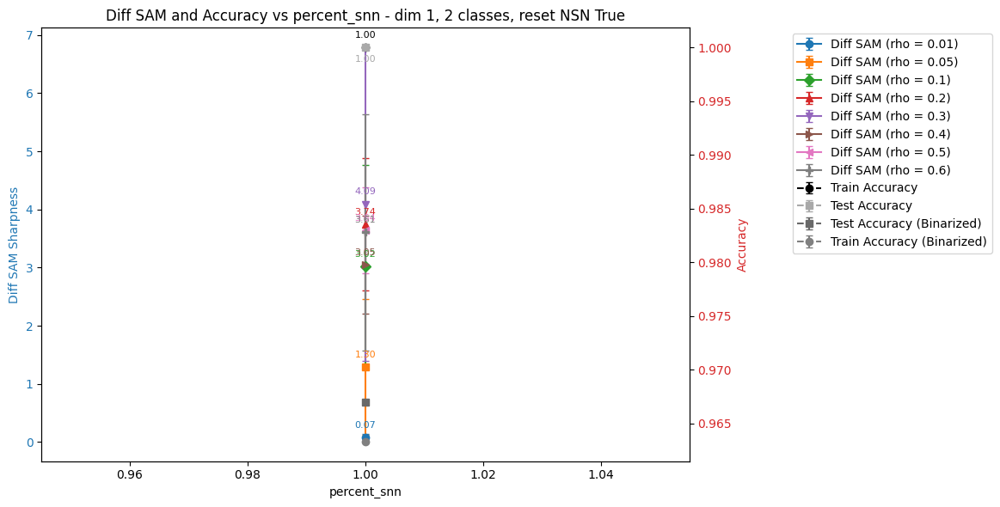

In [ ]:
import matplotlib.pyplot as plt

# Prepare the data: group by percent_snn and rho, and compute mean and std over seeds
import numpy as np
num_dim = 1
num_classes = 2

df_plot = df_final.copy()

def extract_mean(val):
    if isinstance(val, list):
        return np.mean(val)
    try:
        if isinstance(val, str) and val.startswith('['):
            arr = np.array(eval(val))
            return np.mean(arr)
    except Exception:
        pass
    return val

def extract_std(val):
    if isinstance(val, list):
        return np.std(val) if len(val) > 1 else 0.0
    try:
        if isinstance(val, str) and val.startswith('['):
            arr = np.array(eval(val))
            return np.std(arr) if len(arr) > 1 else 0.0
    except Exception:
        pass
    return 0.0
df_plot['test_accuracy_std'] = df_plot['test_accuracy'].apply(extract_std)
df_plot['train_accuracy_std'] = df_plot['train_accuracy'].apply(extract_std)
df_plot['test_accuracy_bin_std'] = df_plot['test_accuracy_bin'].apply(extract_std)
df_plot['train_accuracy_bin_std'] = df_plot['train_accuracy_bin'].apply(extract_std)

# Apply extract_mean to all accuracy columns to get scalar values
df_plot['train_accuracy'] = df_plot['train_accuracy'].apply(extract_mean)
df_plot['test_accuracy'] = df_plot['test_accuracy'].apply(extract_mean)
df_plot['train_accuracy_bin'] = df_plot['train_accuracy_bin'].apply(extract_mean)
df_plot['test_accuracy_bin'] = df_plot['test_accuracy_bin'].apply(extract_mean)


# Group by percent_snn and rho, compute mean and std for diff_sam
grouped = df_plot.groupby(['percent_snn', 'rho'], as_index=False).agg(
    diff_sam_mean=('diff_sam', 'mean'),
    diff_sam_std=('diff_sam', 'std')
)

# Taking mean is fine because it'll be the same across rhos
acc_grouped = df_plot.groupby('percent_snn', as_index=False).agg(
    train_accuracy_mean=('train_accuracy', 'mean'),
    train_accuracy_std=('train_accuracy_std', 'mean'),
    test_accuracy_mean=('test_accuracy', 'mean'),
    test_accuracy_std=('test_accuracy_std', 'mean'),
    test_accuracy_bin_mean=('test_accuracy_bin', 'mean'),
    test_accuracy_bin_std=('test_accuracy_bin_std', 'mean'),
    train_accuracy_bin_mean=('train_accuracy_bin', 'mean'),
    train_accuracy_bin_std=('train_accuracy_bin_std', 'mean')
)

marker_list = ['o', 's', 'D', '^', 'v', '>', '<', 'P', '*']
color_list = plt.cm.tab10.colors

fig, ax1 = plt.subplots(figsize=(12, 6))

# Create second y-axis
ax2 = ax1.twinx()


for i, rho in enumerate(sorted(grouped['rho'].unique())):
    rho_data = grouped[grouped['rho'] == rho].sort_values('percent_snn')
    ax1.errorbar(
        rho_data['percent_snn'], 
        rho_data['diff_sam_mean'], 
        yerr=rho_data['diff_sam_std'],
        label=f"Diff SAM (rho = {rho})",
        marker=marker_list[i % len(marker_list)],
        color=color_list[i % len(color_list)],
        linestyle='-',
        capsize=3
    )
    # Add number labels for diff_sam_mean
    for x, y in zip(rho_data['percent_snn'], rho_data['diff_sam_mean']):
        ax1.annotate(f"{y:.2f}", (x, y), textcoords="offset points", xytext=(0, 8), ha='center', fontsize=8, color=color_list[i % len(color_list)])

# Plot accuracy values on right axis (ax2)
# Train accuracy: black dashed line with error bars
ax2.errorbar(
    acc_grouped['percent_snn'],
    acc_grouped['train_accuracy_mean'],
    yerr=acc_grouped['train_accuracy_std'],
    fmt='o--', color='black', label='Train Accuracy', capsize=3
)

# Test accuracy: grey dashed line with error bars
ax2.errorbar(
    acc_grouped['percent_snn'],
    acc_grouped['test_accuracy_mean'],
    yerr=acc_grouped['test_accuracy_std'],
    fmt='s--', color='darkgrey', label='Test Accuracy', capsize=3
)

# Test accuracy binarized: dimgray dashed line with error bars
ax2.errorbar(
    acc_grouped['percent_snn'],
    acc_grouped['test_accuracy_bin_mean'],
    yerr=acc_grouped['test_accuracy_bin_std'],
    fmt='s--', color='dimgray', label='Test Accuracy (Binarized)', capsize=3
)

# Train accuracy binarized: gray dashed line with error bars
ax2.errorbar(
    acc_grouped['percent_snn'],
    acc_grouped['train_accuracy_bin_mean'],
    yerr=acc_grouped['train_accuracy_bin_std'],
    fmt='o--', color='gray', label='Train Accuracy (Binarized)', capsize=3
)

# Add number labels for accuracies
for x, y in zip(acc_grouped['percent_snn'], acc_grouped['train_accuracy_mean']):
    ax2.annotate(f"{y:.2f}", (x, y), textcoords="offset points", xytext=(0, 8), ha='center', fontsize=8, color='black')

for x, y in zip(acc_grouped['percent_snn'], acc_grouped['test_accuracy_mean']):
    ax2.annotate(f"{y:.2f}", (x, y), textcoords="offset points", xytext=(0, -12), ha='center', fontsize=8, color='darkgrey')

# Set labels and title
ax1.set_xlabel('percent_snn')
ax1.set_ylabel('Diff SAM Sharpness', color='tab:blue')
ax2.set_ylabel('Accuracy', color='tab:red')
ax1.set_title(f'Diff SAM and Accuracy vs percent_snn - dim {num_dim}, {num_classes} classes, reset NSN {nsn_reset_val}')

# Color the y-axis labels to match their data
ax1.tick_params(axis='y', labelcolor='tab:blue')
ax2.tick_params(axis='y', labelcolor='tab:red')

# Create combined legend
lines1, labels1 = ax1.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
ax1.legend(lines1 + lines2, labels1 + labels2, bbox_to_anchor=(1.15, 1), loc='upper left')

plt.tight_layout()
plt.show()

In [ ]:
# filepath = "/vast/nar8991/snn/training_results/randman/1_d/2_classes/3/cross_entropy"
# # Find the png files in the directory
# import glob
# import os
# import shutil
# png_files = glob.glob(os.path.join(filepath, "**", "*.png"), recursive=True)
# # Combine them into a single image
# from PIL import Image
# import numpy as np

# images = [Image.open(x) for x in png_files]
# widths, heights = zip(*(i.size for i in images))
# total_width = sum(widths)
# max_height = max(heights)
# new_im = Image.new('RGB', (total_width, max_height))
# x_offset = 0
# for im in images:
#     new_im.paste(im, (x_offset,0))
#     x_offset += im.size[0]
# new_im.save(os.path.join(filepath, "combined.png"))
# # Move the combined image to a different directory

In [ ]:
# filepath = "/vast/nar8991/snn/training_results/randman/1_d/2_classes/3/cross_entropy"
# # Find the png files in the directory
# import glob
# import os
# import shutil
# png_files = glob.glob(os.path.join(filepath, "**", "*.png"), recursive=True)
# # Combine them into a single image
# from PIL import Image
# import numpy as np

# # Exclude files with 'reset_nsn'
# filtered_png_files = [f for f in png_files if "reset_nsn" not in f]
# filtered_images = [Image.open(x) for x in filtered_png_files]

# # Arrange images in a grid (e.g., 2 rows)
# n_cols = len(filtered_images) // 2 + (len(filtered_images) % 2)
# n_rows = 2

# # Get max width and height for each column and row
# widths = [img.size[0] for img in filtered_images]
# heights = [img.size[1] for img in filtered_images]
# max_width = max(widths)
# max_height = max(heights)

# # Create new image with appropriate size
# grid_width = n_cols * max_width
# grid_height = n_rows * max_height
# new_im = Image.new('RGB', (grid_width, grid_height))

# for idx, im in enumerate(filtered_images):
#     row = idx // n_cols
#     col = idx % n_cols
#     x_offset = col * max_width
#     y_offset = row * max_height
#     new_im.paste(im.convert('RGB'), (x_offset, y_offset))

# combined_path = os.path.join(filepath, "combined_grid.png")
# new_im.save(combined_path)
# print(f"Combined image saved to {combined_path}")

In [ ]:
# # Only include files with 'reset_nsn' in the filename
# reset_nsn_png_files = [f for f in png_files if "reset_nsn" in f]
# reset_nsn_images = [Image.open(x) for x in reset_nsn_png_files]

# # Arrange images in a grid (e.g., 2 rows)
# n_imgs = len(reset_nsn_images)
# n_cols = n_imgs // 2 + (n_imgs % 2)
# n_rows = 2

# # Get max width and height for each column and row
# widths = [img.size[0] for img in reset_nsn_images]
# heights = [img.size[1] for img in reset_nsn_images]
# max_width = max(widths)
# max_height = max(heights)

# # Create new image with appropriate size
# grid_width = n_cols * max_width
# grid_height = n_rows * max_height
# new_im = Image.new('RGB', (grid_width, grid_height))

# for idx, im in enumerate(reset_nsn_images):
#     row = idx // n_cols
#     col = idx % n_cols
#     x_offset = col * max_width
#     y_offset = row * max_height
#     new_im.paste(im.convert('RGB'), (x_offset, y_offset))

# combined_path_reset = os.path.join(filepath, "combined_grid_reset_nsn.png")
# new_im.save(combined_path_reset)
# print(f"Combined image saved to {combined_path_reset}")
